# Causes of CG methylation variation 
---


**Papers to cite**
* Dubin et al.
* Schmitz et al.
* Dowen et al. 2012
* Bewick et al. 2017 (https://www.sciencedirect.com/science/article/pii/S1369526616301297)
* Coleman-Derr et al. 2012 (https://journals.plos.org/plosgenetics/article?id=10.1371/journal.pgen.1002988)
* DNA methylation is not a driver of gene expression reprogramming in young honey bee workers  https://onlinelibrary.wiley.com/doi/full/10.1111/mec.16098?campaign=woletoc



**Things to do**

- [x] Can you predict CG gbM in grand children given the CG in parents?
    - Dominance of the phenotype at each locus?
- [x] Trans QTL on chromosome 4
    - distribution of pvalues at QTL.
    - effect of these two alleles for all 20000 genes.
    - how big is the peak. 


In [2]:
library(tictoc)
library("qtl")
library("rhdf5")
library(RColorBrewer)
library("GenomicRanges")
library(rtracklayer)
library(ggplot2)
library("ggpubr")
library(cowplot)
library(tidyverse)
library(plotly)
library(furrr)

# library(glmnet)  ### Generalised linear models with LASSO and Ridge
library(rTASSEL)  ### TASSEL for GWAS
library(sommer)   ### Great package for linear mixed models
library(lme4)

library(car)
library(foreach)
library(doSNOW)   ###library(doParallel) ## doParallel doesnt work

home.fol = "/users/rahul.pisupati/"

# devtools::install_github("byandell/qtlbim")
library("qtlbim", quietly = T)

options(warn=-1)
options(repr.plot.width=12, repr.plot.height=8, repr.plot.pointsize = 13)

### Run this line when tab completion gives you wierd back ticks
### IRkernel::installspec() 
for (ef in Sys.glob( paste0(home.fol, "/mygit/gists/*/*R") ) ){
    source( ef, local = T)
}

devtools::load_all(path = paste0(home.fol,  "/mygit/epiRqtl/") )
# devtools::document("/users/rahul.pisupati/mygit/epiRqtl/")

logit <- function(x) log(x/(1-x))


my_ggtheme <- function(cex = 1.8){
    base_size=12
#     base_family='Helvetica'
#     base_line_size=base_size/24
#     base_rect_size=base_size/24
#     border=FALSE
#   return_theme <- return_theme + ggplot2::theme(panel.border = ggplot2::element_rect(fill = NA, color = color_text, size = base_rect_size))
    ggplot2::theme(axis.title = element_text(size = rel(cex)), axis.text = element_text(size = rel(cex)), legend.title = element_text(size = rel(cex)), legend.text = element_text(size = rel(cex)) )
}

colors.f2.alleles = c(brewer.pal(3,"BrBG")[1], brewer.pal(6,"RdGy")[5], brewer.pal(3,"BrBG")[3])

Loading epiRqtl



In [3]:
home.fol = "~/"
proj.fol = "/groups/nordborg/projects/epiclines/"

cross_genotypes = list()
# cross_genotypes['2013.d1.t16.fol'] = list( file.path( proj.fol, "004.manu.crosses.2013/001.F2s.6191x6046/methylpy/" ) )
# cross_genotypes['2013.d1.t16'] = list( read.cross("csvr", file.path(cross_genotypes[['2013.d1.t16.fol']], "snps_bcftools/"), "genotyper_final.csv", genotypes=c("AA","AB","BB"), na.strings = c('-1', "NA"), estimate.map=FALSE) )
# cross_genotypes['2013.d2.t4.fol'] = list( file.path( proj.fol, "004.manu.crosses.2013/002.F2s.6046x6191_4C/methylpy/" ) )
# cross_genotypes['2013.d2.t4'] = list( read.cross("csvr", file.path(cross_genotypes[['2013.d2.t4.fol']], "snps_bcftools/"), "genotyper_final.csv", genotypes=c("AA","AB","BB"), na.strings = c('-1', "NA"), estimate.map=FALSE) )

cross_genotypes['2020.all.fol'] = list( file.path( proj.fol, "/005.manu.crosses.2020/004.design_resolved/" ) )
cross_genotypes['2020.all'] = list( read.cross("csvr", file.path(cross_genotypes[['2020.all.fol']], "snps_bcftools/"), "genotyper_final_all.csv", genotypes=c("A","H","B"), na.strings = c('-1', "NA"), estimate.map=FALSE) )

cross_genotypes['2020.d1.fol'] = list( file.path( proj.fol, "/005.manu.crosses.2020/004.design_resolved/" ) )
cross_genotypes['2020.d1'] = list( read.cross("csvr", file.path(cross_genotypes[['2020.d1.fol']], "snps_bcftools/"), "genotyper_final_D1.csv", genotypes=c("AA","AB","BB"), na.strings = c('-1', "NA"), estimate.map=FALSE) )


cross_genotypes['2020.d2.fol'] = list( file.path( proj.fol, "/005.manu.crosses.2020/004.design_resolved/" ) )
cross_genotypes['2020.d2'] = list( read.cross("csvr", file.path(cross_genotypes[['2020.d2.fol']], "snps_bcftools/"), "genotyper_final_D2.csv", genotypes=c("AA","AB","BB"), na.strings = c('-1', "NA"), estimate.map=FALSE) )


cross_genotypes[["2020.d1.t16"]] = subset(cross_genotypes[["2020.d1"]], ind= str_which(getid(cross_genotypes[["2020.d1"]]), "T16"))
cross_genotypes[["2020.d1.t4"]] = subset(cross_genotypes[["2020.d1"]], ind= str_which(getid(cross_genotypes[["2020.d1"]]), "T4"))
# write.cross(subset(cross_genotypes[["2020.d1"]], ind= str_which(getid(cross_genotypes[["2020.d1"]]), "T16")), format = "csvr", file.path(cross_genotypes[["2020.d1.fol"]], "snps_bcftools", "genotyper_final_D1_T16"))

 --Read the following data:
	 613  individuals
	 18585  markers
	 12  phenotypes
 --Cross type: f2 
 --Read the following data:
	 308  individuals
	 3299  markers
	 12  phenotypes
 --Cross type: f2 
 --Read the following data:
	 306  individuals
	 3299  markers
	 12  phenotypes
 --Cross type: f2 


In [4]:
parents = c("6191", "6046")
parents_df = read.csv( file.path(cross_genotypes[['2020.all.fol']], "phenos", "wma.genes.CG.csv"), as.is= T)[,1]
parents_df = c(parents_df[which(str_detect(parents_df, paste0("P_", parents[1])))], parents_df[which(str_detect(parents_df, paste0("P_", parents[2])))])
parents_df = data.frame("id" = parents_df, "parent" = str_remove(str_split_fixed(parents_df, "_", 3)[,3], "P_"))

qtl_results = list()
# araport.genes = read.table(file.path(home.fol, "ARAPORT11/Araport11_GFF3_genes_transposons.ids.onlychrs.bed"), header = F, as.is = T)
# araport.genes = read.table(file.path(home.fol, "ARAPORT11/Araport11_GFF3_genes_201606.onlychrs.bed"), header = F, as.is = T)
# araport.genes.str = paste(araport.genes$V1, araport.genes$V2, araport.genes$V3, sep = ",")

# summary(cross_genotypes[['2020.all']])

cross_genotypes['2020.geno'] = list( genotype_at_marker(cross_genotypes[['2020.d1']], markernames( cross_genotypes[['2020.d1']] )) - 1 )
cross_genotypes[['2020.geno']] = rbind(cross_genotypes[['2020.geno']], genotype_at_marker(cross_genotypes[['2020.d2']], markernames( cross_genotypes[['2020.d2']] )) - 1) %>% as_data_frame()
rownames(cross_genotypes[['2020.geno']]) = c(as.character(pull(cross_genotypes[['2020.d1']]$pheno, "id")), as.character(pull(cross_genotypes[['2020.d2']]$pheno, "id")))
colnames(cross_genotypes[['2020.geno']]) = markernames( cross_genotypes[['2020.d2']] )

cross_genotypes['2020.kin'] = list( A.mat( as.matrix(cross_genotypes[['2020.geno']]) ) )

In [5]:
### Adding temperature, plate and direction in phenotypes based on Name
add_metadata = function(cross_pheno_df){
    ### first column name is ID with file names
    cross_pheno_df = cross_pheno_df %>% mutate("direction" = str_remove( str_split_fixed(pull(cross_pheno_df, 'id'), "_", 3)[,3], pattern = "F2_" ) )
    cross_pheno_df = cross_pheno_df %>% mutate("temp" = str_split_fixed(pull(cross_pheno_df, 'id'), "_", 2)[,1] )
    cross_pheno_df = cross_pheno_df %>% mutate("plate" =  str_extract(pull(cross_pheno_df, 'id'), "_P[1-5]") )
    cross_pheno_df = cross_pheno_df %>% mutate("plate" =  str_remove(pull(cross_pheno_df, 'plate'), "_P"  ) )

    cross_pheno_df = cross_pheno_df %>% mutate("position" = str_split_fixed( str_split_fixed( pull(cross_pheno_df, "id"), "_", 3)[,2], "[.]", 2)[,2] )
    cross_pheno_df = cross_pheno_df %>% mutate( "row" =  str_sub(pull(cross_pheno_df, "position"), start = 1, end = 1) )
    cross_pheno_df = cross_pheno_df %>% mutate( "col" =  as.numeric(str_sub(pull(cross_pheno_df, "position"), start = 2, end = 3) ))
    cross_pheno_df = cross_pheno_df %>% mutate( "tray" = as.integer(pull(cross_pheno_df, "col") > 6) + 1 + (2 * (as.numeric(pull(cross_pheno_df, "plate")) - 1) ))
    cross_pheno_df = cross_pheno_df %>% unite( "temp_plate", c(temp, plate), sep = "_P", remove = F ) 
    cross_pheno_df = cross_pheno_df %>% unite( "temp_tray", c(temp, tray), sep = "_tray", remove = F ) 
    cross_pheno_df = cross_pheno_df %>% unite( "temp_direction", c(temp, direction), sep = "_", remove = F )
    cross_pheno_df = cross_pheno_df %>% unite( "d_tp", c(direction, temp_plate), sep = "_", remove = F )
    cross_pheno_df = cross_pheno_df %>% mutate("direction" =  str_remove(pull(cross_pheno_df, 'direction'), "D"  ) )
    cross_pheno_df = cross_pheno_df %>% mutate_at( c("plate","temp_plate", "temp_tray", "temp_direction", "d_tp"), as.factor) #%>% mutate_at( c("temp_plate", "temp_tray", "temp_direction", "d_top"), as.numeric) 
    cross_pheno_df = cross_pheno_df %>% mutate("temp" =  as.numeric(pull(cross_pheno_df, 'temp') == 'T16') + 1 )
#     cross_pheno_df = cross_pheno_df %>% mutate("temp" = as.numeric(str_split_fixed(pull(cross_pheno_df, 'id'), "_", 2)[,1] == "T16") + 1 )
    # # geno_unified$pheno = geno_unified$pheno %>% mutate("temp" = str_split_fixed(getid(geno_unified), "_", 2)[,1] ) 
    cross_pheno_df = cross_pheno_df %>% mutate_at( c("temp", "direction"), as.factor) %>% mutate( plate = as.factor(as.numeric(temp_plate)) )
    return(cross_pheno_df)
}

parents_df = add_metadata( parents_df )
# cross_genotypes[['2020.all']]$pheno = add_metadata(cross_genotypes[['2020.all']]$pheno)
cross_genotypes[['2020.d1']]$pheno = add_metadata(cross_genotypes[['2020.d1']]$pheno['id'] )
cross_genotypes[['2020.d2']]$pheno = add_metadata(cross_genotypes[['2020.d2']]$pheno['id'] )

# cross_genotypes[["2020.d1.t16"]] = subset(cross_genotypes[["2020.d1"]], ind= str_which(getid(cross_genotypes[["2020.d1"]]), "T16"))

# write.cross( cross_genotypes[["2020.d1.t16"]], format = "csvr", file.path(cross_genotypes[["2020.d1.fol"]], "snps_bcftools/genotyper_final_D1_T16.csv")  )

In [6]:
# # cross_genotypes[['2020.all']]$pheno = add_phenos_to_qtl( cross_genotypes[['2020.all']], file.path(cross_genotypes[['2020.all.fol']], "phenos", "wma.genes"), "gene", transform_fn = logit)
# parents_df = add_phenos_to_df( parents_df, file.path(cross_genotypes[['2020.all.fol']], "phenos", "wma.genes"), "gene", transform_fn = logit)
# # cross_genotypes[['2020.all']]$pheno = add_phenos_to_qtl( cross_genotypes[['2020.all']], file.path(cross_genotypes[['2020.all.fol']], "phenos", "wma.tes"), "tes", transform_fn = logit)
# parents_df = add_phenos_to_df( parents_df, file.path(cross_genotypes[['2020.all.fol']], "phenos", "wma.tes"), "tes", transform_fn = logit)

# phenos_to_map = c("gene.cg", "tes.cg", "tes.chg", "tes.chh", "rddm.tes.cg", "rddm.tes.chg", "rddm.tes.chh", "cmt2.tes.cg", "cmt2.tes.chg", "cmt2.tes.chh")

# for (ef_cross in c("2020.d1", "2020.d2")){ ##"2013.d2.t4", "2013.d1.t16"
#     cross_genotypes[[ef_cross]]$pheno = add_phenos_to_qtl( cross_genotypes[[ef_cross]], file.path(cross_genotypes[[paste0(ef_cross, ".fol")]], "phenos", "wma.genes"), "gene", transform_fn = logit)
#     cross_genotypes[[ef_cross]]$pheno = add_phenos_to_qtl( cross_genotypes[[ef_cross]], file.path(cross_genotypes[[paste0(ef_cross, ".fol")]], "phenos", "wma.tes"), "tes", transform_fn = logit)
#     cross_genotypes[[ef_cross]]$pheno = add_phenos_to_qtl( cross_genotypes[[ef_cross]], file.path(cross_genotypes[[paste0(ef_cross, ".fol")]], "phenos", "wma.cmt2.tes"), "cmt2.tes", transform_fn = logit)
#     cross_genotypes[[ef_cross]]$pheno = add_phenos_to_qtl( cross_genotypes[[ef_cross]], file.path(cross_genotypes[[paste0(ef_cross, ".fol")]], "phenos", "wma.rddm.tes"), "rddm.tes", transform_fn = logit)
# }
# cross_genotypes['pheno'] = list( bind_rows( cross_genotypes[['2020.d1']]$pheno, cross_genotypes[['2020.d2']]$pheno ) %>% mutate_at(c("plate", "temp", "direction", "temp_direction", "temp_plate"), as.factor) )

# cross_genotypes[['pheno']] = full_join(cross_genotypes[['pheno']], cross_genotypes[['2020.geno']] %>% rename_at(colnames(cross_genotypes[['2020.geno']]), ~paste0("marker", seq( dim(cross_genotypes[['2020.geno']])[2] )) )  %>% rownames_to_column("id"), by = "id") %>% mutate_at(vars(starts_with("marker")), function(x){factor(x, levels= c("0", "1", "2"), labels = c("AA", "AB", "BB")  ) } ) #%>% mutate_at(vars(starts_with("marker")), as.factor)

# # thres_perm = as.numeric(summary(scanone(cross_genotypes[['2020.d1']], method="hk", n.perm=1000, pheno.col = 'gene.cg'), alpha=0.05 ))
# # print(thres_perm)

In [7]:
# ### You do not need to load this unless you want to get specific gene of interest
# araport.anno = import.gff( file.path(home.fol, "ARAPORT11/Araport11_GFF3_genes_transposons.201606.gff") )
# araport.gene = subset(araport.anno, locus_type == "protein_coding"  & seqnames %in% paste0("Chr", seq(5)) )
# araport.tegene = subset(araport.anno, type == "transposable_element_gene"  & seqnames %in% paste0("Chr", seq(5)) )
# araport.tes = subset(araport.anno, type == "transposable_element"  & seqnames %in% paste0("Chr", seq(5)) )


# h5closeAll( )
# # phenos = file.path(data.fol, "wmas_araport/",  "wma.all.6191x6046.CG.hdf5")
# phenos = file.path(cross_genotypes[['2020.d1.fol']], "wmas_cds_genes/",  "wma.all_samples_cds_gbm.CG.hdf5")
# phenos_arastr = paste(h5read(phenos, "chr"), h5read(phenos, "start"), h5read(phenos, "end"), sep = ",")
# phenos_arastr = unique( phenos_arastr )
# phenos_df = get_pheno_from_value_hdf5( phenos, phenos_arastr )

# parents_df = full_join(parents_df, phenos_df %>% slice(match(pull(parents_df, "id"),accs) ) %>% rename(id = accs), by = "id")
# phenos_df = phenos_df %>% slice(match(cross_genotypes[['pheno']][,"id"],accs) ) %>% rename(id = accs) #%>% mutate_at(vars(!matches("id")), logit)
# # phenos_df = create_rqtl_phenos(cross_genotypes[['2020.d1']], phenos_df)

# ### Araport protein coding genes
# # req_genes_str = str_c( seqnames(araport.gene), start(araport.gene), end(araport.gene), sep = ",")
# # req_genes_phenos = phenos_df[c("id", req_genes_str)] %>% mutate_at(vars(!matches("id")), logit)
# # req_genes_phenos[sapply(req_genes_phenos, simplify = 'matrix', is.infinite)] <- NA
# # req_genes_phenos = create_rqtl_phenos(cross_genotypes[['2020.d2']], req_genes_phenos)


# # ### Write the interesting genes to run the model
# # write.table(req_genes_str[ which( as.numeric( colSums(is.na(req_genes_phenos)) ) < 50) - 1 ], "/groups/nordborg/projects/epiclines/005.manu.crosses.2020/004.design_resolved/qtl_maps.aragenes.d2/gene.str.d2.csv", col.names = F, row.names = F, sep = ",", quote = F )

In [8]:
# req.gene.str = paste(seqnames(araport.gene), start(araport.gene), end(araport.gene), sep = ",")
# # req.gene.str = paste(seqnames(araport.tegene), start(araport.tegene), end(araport.tegene), sep = ",")


# ## get cis marker for each gene and stored in a file
# # plan(multicore, workers = 16)
# # req.gene.str.cis.marker = req.gene.str %>% future_map_chr( function(x) { get_closest_marker( geno_unified = cross_genotypes[['2020.d1']], bed_str = x)$id } ) 
# # req.gene.str.cis.marker = cbind(gene_str = req.gene.str, cis_marker = req.gene.str.cis.marker)
# # write.table(req.gene.str.cis.marker, "cache_data/araport.genes.closest.marker.csv", sep = "\t", row.names = F)

# req.gene.str.cis.marker = read.table("cache_data/araport.genes.closest.marker.csv", sep = "\t", header = T, as.is = T)
# req.gene.str.cis.marker['marker_ix'] = match(req.gene.str.cis.marker$cis_marker, markernames( cross_genotypes[['2020.d1']] ) )

# #### Calculate differential methylation on parents
# # parents_diff_meths = parents_df %>% filter( temp == 2 ) %>% group_by( parent ) %>% summarise_at( req.gene.str,  function(x) {mean(x, na.rm = T)} )  #
# # parents_diff_meths = t(parents_diff_meths)
# # colnames(parents_diff_meths) = as.character(parents_diff_meths[1,])
# # parents_diff_meths = parents_diff_meths[-1,]
# # write.table(parents_diff_meths, "cache_data/araport.genes.parents.differential.cg.methylation.csv", row.names = T)

# # parents_diff_meths = read.table("cache_data/araport.genes.parents.differential.cg.methylation.csv", header = T, as.is = T)
# # parents_diff_meths = parents_diff_meths %>% mutate( "mc_diff" =  pull(parents_diff_meths,1) - pull(parents_diff_meths,2) )

In [9]:
# ### DMRs from papers
# cg_dmrs = list()

# cg_dmrs[['schmitz2011']] = read.csv( "/groups/nordborg/projects/epiclines/005.manu.crosses.2020/001.data/01.schmitz2011/Schmitz2011.CG-DMRs.csv", as.is = T )
# cg_dmrs[['schmitz2011']] = GRanges( seqnames = cg_dmrs[['schmitz2011']][,"Chr"], ranges = IRanges( start = cg_dmrs[['schmitz2011']][,"Start"], end = cg_dmrs[['schmitz2011']][,"End"] ) )
# cg_dmrs[['schmitz2011.gene']] = GenomicRanges::intersect(araport.gene, cg_dmrs[['schmitz2011']], ignore.strand = TRUE)
# cg_dmrs[['schmitz2011.gene.str']] = paste(seqnames(cg_dmrs[['schmitz2011.gene']]), start(cg_dmrs[['schmitz2011.gene']]), end(cg_dmrs[['schmitz2011.gene']]), sep = ",")


# cg_dmrs[['becker2011']] = read.csv( "/groups/nordborg/projects/epiclines/005.manu.crosses.2020/001.data/02.becker2011/Becker2011-DMRs-TableS2.csv", sep = "\t", as.is = T )
# cg_dmrs[['becker2011.gene']] = subset( araport.gene, Name %in% as.vector(str_split_fixed(string = cg_dmrs[['becker2011']][,'gene_ID'], pattern = ",", n = 2 )) )
# cg_dmrs[['becker2011.gene.str']] = paste(seqnames(cg_dmrs[['becker2011.gene']]), start(cg_dmrs[['becker2011.gene']]), end(cg_dmrs[['becker2011.gene']]), sep = ",")

In [10]:
ef_rates = read_csv( "cache_data/epimutation_rates_500Kb_rep2.csv" )
ef_rates = create_rqtl_phenos(cross_genotypes[["2020.d1"]], ef_rates %>% column_to_rownames("X1") %>% rownames_to_column("id") )

cross_genotypes[['2020.d1']]$pheno = left_join(cross_genotypes[['2020.d1']]$pheno[1:12],  ef_rates, by = "id")


── Column specification ────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  X1 = col_character(),
  `subpop:Chr1,1,500000` = col_character(),
  `subpop:Chr1,500001,1000000` = col_character(),
  `subpop:Chr1,1000001,1500000` = col_character(),
  `subpop:Chr1,1500001,2000000` = col_character(),
  `subpop:Chr1,2000001,2500000` = col_character(),
  `subpop:Chr1,2500001,3000000` = col_character(),
  `subpop:Chr1,3000001,3500000` = col_character(),
  `subpop:Chr1,3500001,4000000` = col_character(),
  `subpop:Chr1,4000001,4500000` = col_character(),
  `subpop:Chr1,4500001,5000000` = col_character(),
  `subpop:Chr1,5000001,5500000` = col_character(),
  `subpop:Chr1,5500001,6000000` = col_character(),
  `subpop:Chr1,6000001,6500000` = col_character(),
  `subpop:Chr1,6500001,7000000` = col_character(),
  `subpop:Chr1,7000001,7500000` = col_character(),
  `subpop:Chr1,7500001,8000000` = col_character(),
  `subpop:Chr1,8000001,8500000` = col_character(),
  

In [12]:
ef_rates = read_csv( "cache_data/epimutation_rates_500Kb_d2_rep2.csv" )
# ef_rates = read_csv( "cache_data/epimutation_rates_500Kb_d2_rep2_test.csv" )

ef_rates = create_rqtl_phenos(cross_genotypes[["2020.d2"]], ef_rates %>% column_to_rownames("X1") %>% rownames_to_column("id") )

cross_genotypes[['2020.d2']]$pheno = left_join(cross_genotypes[['2020.d2']]$pheno[1:12],  ef_rates, by = "id")


── Column specification ────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  X1 = col_character(),
  `subpop:Chr1,1,500000` = col_character(),
  `subpop:Chr1,500001,1000000` = col_character(),
  `subpop:Chr1,1000001,1500000` = col_character(),
  `subpop:Chr1,1500001,2000000` = col_character(),
  `subpop:Chr1,2000001,2500000` = col_character(),
  `subpop:Chr1,2500001,3000000` = col_character(),
  `subpop:Chr1,3000001,3500000` = col_character(),
  `subpop:Chr1,3500001,4000000` = col_character(),
  `subpop:Chr1,4000001,4500000` = col_character(),
  `subpop:Chr1,4500001,5000000` = col_character(),
  `subpop:Chr1,5000001,5500000` = col_character(),
  `subpop:Chr1,5500001,6000000` = col_character(),
  `subpop:Chr1,6000001,6500000` = col_character(),
  `subpop:Chr1,6500001,7000000` = col_character(),
  `subpop:Chr1,7000001,7500000` = col_character(),
  `subpop:Chr1,7500001,8000000` = col_character(),
  `subpop:Chr1,8000001,8500000` = col_character(),
  

## MQM

In [59]:
t_gains_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_0_nonpoly")))) < 200))
cross_genotypes[['2020.d1']]$pheno = cross_genotypes[['2020.d1']]$pheno %>% mutate(mean.dev_0 = rowMeans( cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(t_gains_phenos), na.rm = T ) )



t_loss_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_1_nonpoly")))) < 200))

cross_genotypes[['2020.d1']]$pheno = cross_genotypes[['2020.d1']]$pheno %>% mutate(mean.dev_1 = rowMeans( cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(t_loss_phenos), na.rm = T ) )

In [19]:
t_gains_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d2']]$pheno %>% dplyr::select(starts_with("deviation_0_nonpoly")))) < 200))
cross_genotypes[['2020.d2']]$pheno = cross_genotypes[['2020.d2']]$pheno %>% mutate(mean.dev_0 = rowMeans( cross_genotypes[['2020.d2']]$pheno %>% dplyr::select(t_gains_phenos), na.rm = T ) )



t_loss_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d2']]$pheno %>% dplyr::select(starts_with("deviation_1_nonpoly")))) < 200))

cross_genotypes[['2020.d2']]$pheno = cross_genotypes[['2020.d2']]$pheno %>% mutate(mean.dev_1 = rowMeans( cross_genotypes[['2020.d2']]$pheno %>% dplyr::select(t_loss_phenos), na.rm = T ) )

Note: Using an external vector in selections is ambiguous.
ℹ Use `all_of(t_gains_phenos)` instead of `t_gains_phenos` to silence this message.
ℹ See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.
This message is displayed once per session.

Note: Using an external vector in selections is ambiguous.
ℹ Use `all_of(t_loss_phenos)` instead of `t_loss_phenos` to silence this message.
ℹ See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.
This message is displayed once per session.



In [18]:
ef_data = read.csv("cache_data/STable_average_deviations_across_windows.csv")# %>% rename(id = X1)
colnames(ef_data)[1] = 'id'


cross_genotypes[['2020.d1']]$pheno = left_join(cross_genotypes[['2020.d1']]$pheno, ef_data, by = 'id')

In [19]:
cross_genotypes[["2020.d1.t16"]] = subset(cross_genotypes[["2020.d1"]], ind = which(cross_genotypes[["2020.d1"]]$pheno[,'temp.x'] == 2))
cross_genotypes[["2020.d1.t4"]] = subset(cross_genotypes[["2020.d1"]], ind = which(cross_genotypes[["2020.d1"]]$pheno[,'temp.x'] == 1))

In [71]:
bayesint(cim(cross_genotypes[["2020.d1.t4"]], pheno.col = 'mean.dev_0', n.marcovar = 2), 5)

,chr,pos,lod
,<fct>,<dbl>,<dbl>
Chr5:17306935,5,64.53983,3.849170
Chr5:18298373,5,69.43149,4.309381
Chr5:19871408,5,72.85227,3.124703


In [72]:
bayesint(scanone(cross_genotypes[["2020.d1.t4"]], pheno.col = 'mean.dev_0'), 5)

,chr,pos,lod
,<fct>,<dbl>,<dbl>
Chr5:15234214,5,52.80001,1.706078
Chr5:18298373,5,69.43149,2.916824
Chr5:20971904,5,76.10956,1.459428


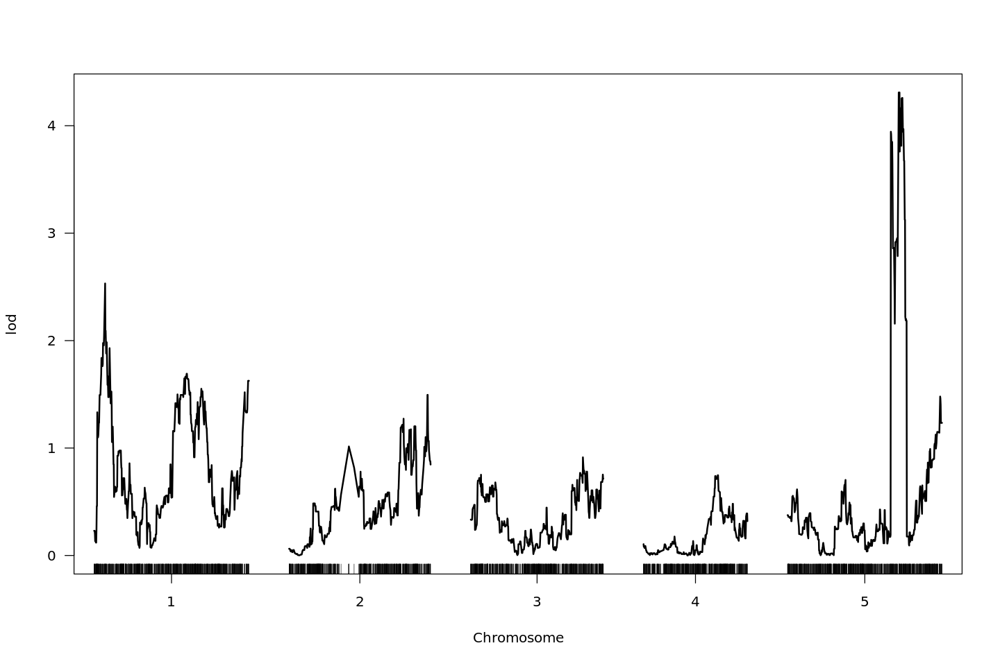

In [67]:
plot(cim(cross_genotypes[["2020.d1.t4"]], pheno.col = 'mean.dev_0', n.marcovar = 2) )

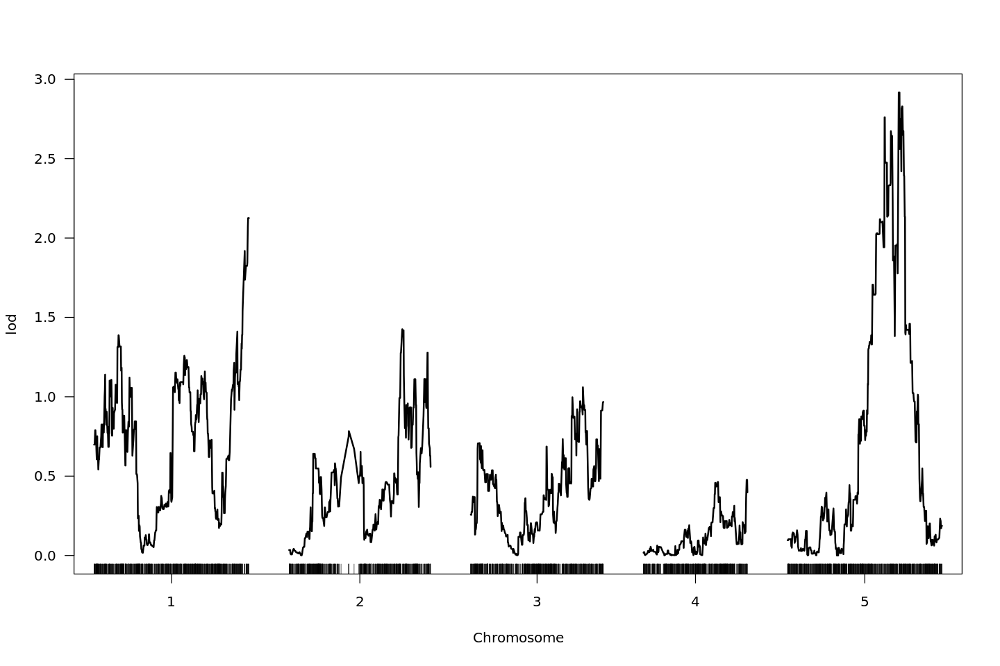

In [74]:
plot(scanone(cross_genotypes[["2020.d1.t4"]], pheno.col = 'mean.dev_0') )

In [24]:
# gain_cim_1 = scanone(cross_genotypes[["2020.d1"]], pheno.col = "deviation_0_nonpoly_qtl_gain_0", intcovar = as.numeric(cross_genotypes[["2020.d1"]]$pheno[,'temp.x'])  )
gain_cim_1 = cim(cross_genotypes[["2020.d1"]], pheno.col = "deviation_0_nonpoly_qtl_gain_0", n.marcovar = 2) 
# gain_cim_2 = scanone(cross_genotypes[["2020.d1"]], pheno.col = "deviation_0_nonpoly_qtl_gain_2", intcovar = as.numeric(cross_genotypes[["2020.d1"]]$pheno[,'temp.x'])  )
gain_cim_2 = cim(cross_genotypes[["2020.d1"]], pheno.col = "deviation_0_nonpoly_qtl_gain_2", n.marcovar = 2) 

In [33]:
colnames(ef_data)

[1] "id"                             "qtl_gain_0"                    
 [3] "qtl_gain_1"                     "qtl_gain_2"                    
 [5] "qtl_loss_0"                     "qtl_loss_1"                    
 [7] "qtl_loss_2"                     "temp"                          
 [9] "deviation_0_nonpoly_qtl_gain_0" "deviation_0_poly_qtl_gain_0"   
[11] "deviation_0_nonpoly_qtl_gain_1" "deviation_0_poly_qtl_gain_1"   
[13] "deviation_0_nonpoly_qtl_gain_2" "deviation_0_poly_qtl_gain_2"   
[15] "deviation_1_nonpoly_qtl_loss_0" "deviation_1_poly_qtl_loss_0"   
[17] "deviation_1_nonpoly_qtl_loss_1" "deviation_1_poly_qtl_loss_1"   
[19] "deviation_1_nonpoly_qtl_loss_2" "deviation_1_poly_qtl_loss_2"

In [19]:
bayesint(gain_cim_1, 1)

,chr,pos,lod
,<fct>,<dbl>,<dbl>
Chr1:4036590,1,10.91605,4.102524
Chr1:4917674,1,15.80764,5.310841
Chr1:5489294,1,17.11033,4.396564


In [23]:
bayesint(gain_cim_2, 5)

,chr,pos,lod
,<fct>,<dbl>,<dbl>
Chr5:15623429,5,55.57145,2.969559
Chr5:16384938,5,60.30148,4.076728
Chr5:17555150,5,65.19077,3.489734


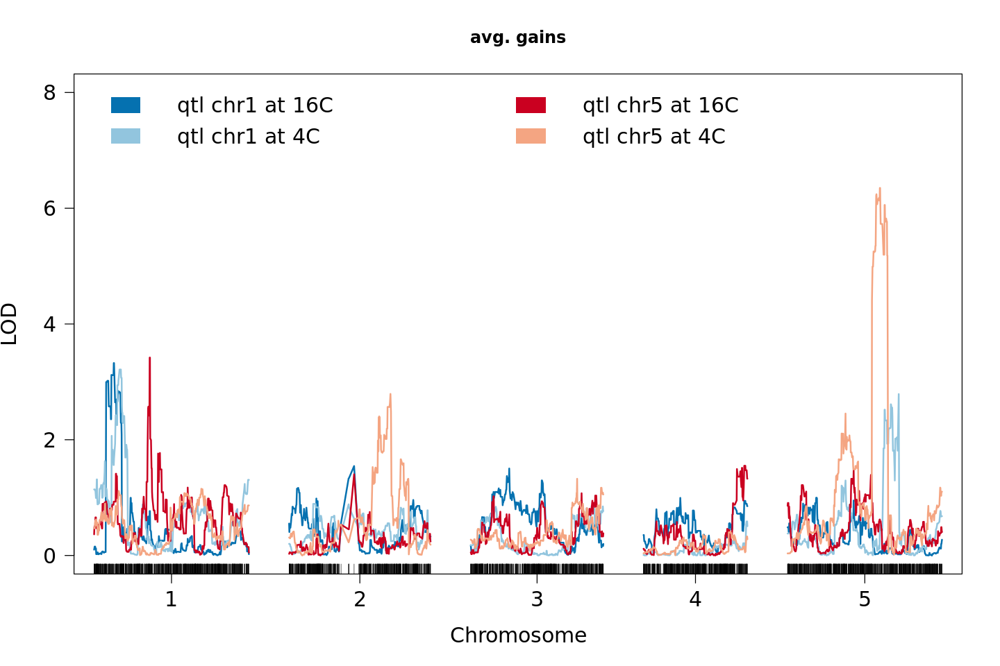

In [23]:
par(cex.axis = 1.5, cex.lab = 1.5)

plot(cim(cross_genotypes[["2020.d1.t16"]], pheno.col = "deviation_0_nonpoly_qtl_gain_0", n.marcovar = 1), ylab="LOD", ylim = c(0, 8), col = brewer.pal(5, "RdBu")[5], main = "avg. gains")
plot(cim(cross_genotypes[["2020.d1.t4"]], pheno.col = "deviation_0_nonpoly_qtl_gain_0", n.marcovar = 2), col = brewer.pal(5, "RdBu")[4], add = T)

plot(cim(cross_genotypes[["2020.d1.t16"]], pheno.col = "deviation_0_nonpoly_qtl_gain_2", n.marcovar = 2), col = brewer.pal(5, "RdBu")[1], add = T)
plot(cim(cross_genotypes[["2020.d1.t4"]], pheno.col = "deviation_0_nonpoly_qtl_gain_2", n.marcovar = 2), col = brewer.pal(5, "RdBu")[2], add = T)

# plot(gain_cim_2, ylab="LOD", ylim = c(0, 8), col = brewer.pal(5, "OrRd")[5], add = T)


legend("topleft", c("qtl chr1 at 16C", "qtl chr1 at 4C", "qtl chr5 at 16C", "qtl chr5 at 4C"), fill = brewer.pal(5, "RdBu")[c(5,4,1,2)], ncol = 2, border = NA, box.lty = 0, bg="transparent", cex = 1.5)


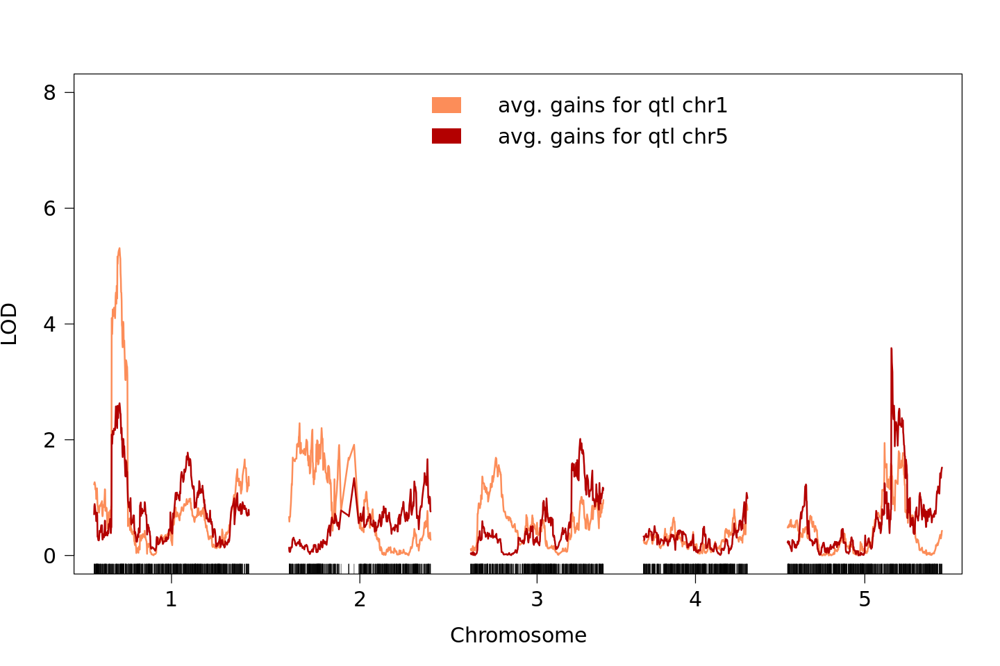

In [25]:
par(cex.axis = 1.5, cex.lab = 1.5)

plot(gain_cim_1, ylab="LOD", ylim = c(0, 8), col = brewer.pal(5, "OrRd")[3])

plot(gain_cim_2, ylab="LOD", ylim = c(0, 8), col = brewer.pal(5, "OrRd")[5], add = T)


legend("topright", c("avg. gains for qtl chr1", "avg. gains for qtl chr5"), fill = c(brewer.pal(5, "OrRd")[3], brewer.pal(5, "OrRd")[5]), ncol = 1, border = NA, box.lty = 0, bg="transparent", cex = 1.5)

# dev.off()

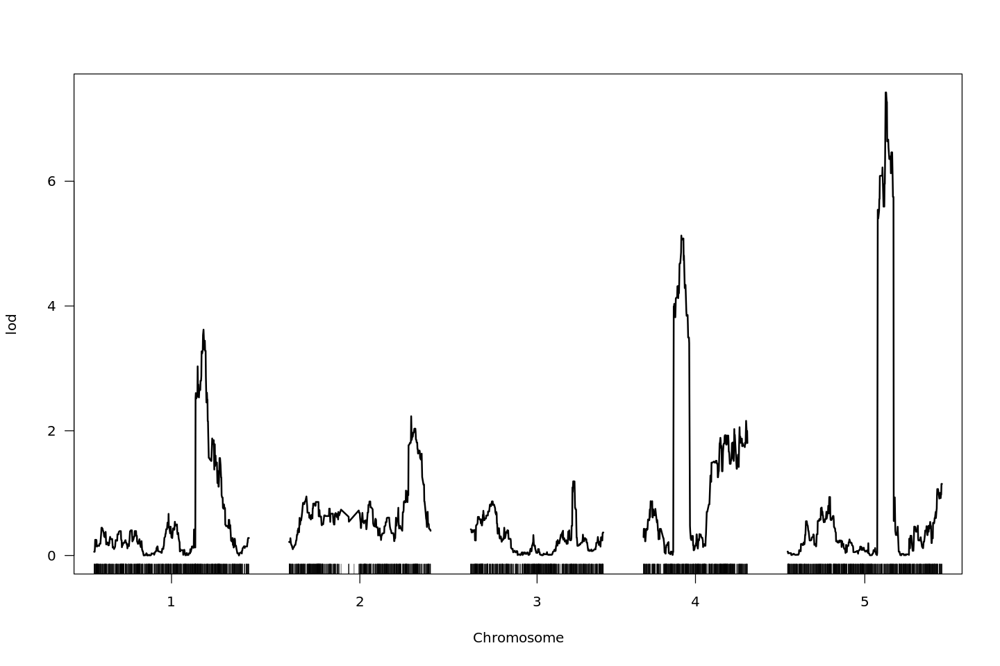

In [76]:
plot( cim(cross_genotypes[["2020.d1.t4"]], pheno.col = "deviation_1_nonpoly_qtl_loss_0", n.marcovar = 3) )

In [132]:
loss_cim_0 = cim(cross_genotypes[["2020.d1"]], pheno.col = "deviation_1_nonpoly_qtl_loss_0", n.marcovar = 3) 
loss_cim_1 = cim(cross_genotypes[["2020.d1"]], pheno.col = "deviation_1_nonpoly_qtl_loss_1", n.marcovar = 3) 
loss_cim_2 = cim(cross_genotypes[["2020.d1"]], pheno.col = "deviation_1_nonpoly_qtl_loss_2", n.marcovar = 3) 

In [134]:
loss_sim = scanone(cross_genotypes[["2020.d1"]], pheno.col = "deviation_1_nonpoly_qtl_loss_0") 

In [141]:
bayesint(loss_sim, 5)

,chr,pos,lod
,<fct>,<dbl>,<dbl>
Chr5:15478232,5,54.43065,5.088875
Chr5:16445720,5,60.95324,7.118091
Chr5:17535478,5,65.02804,5.060519


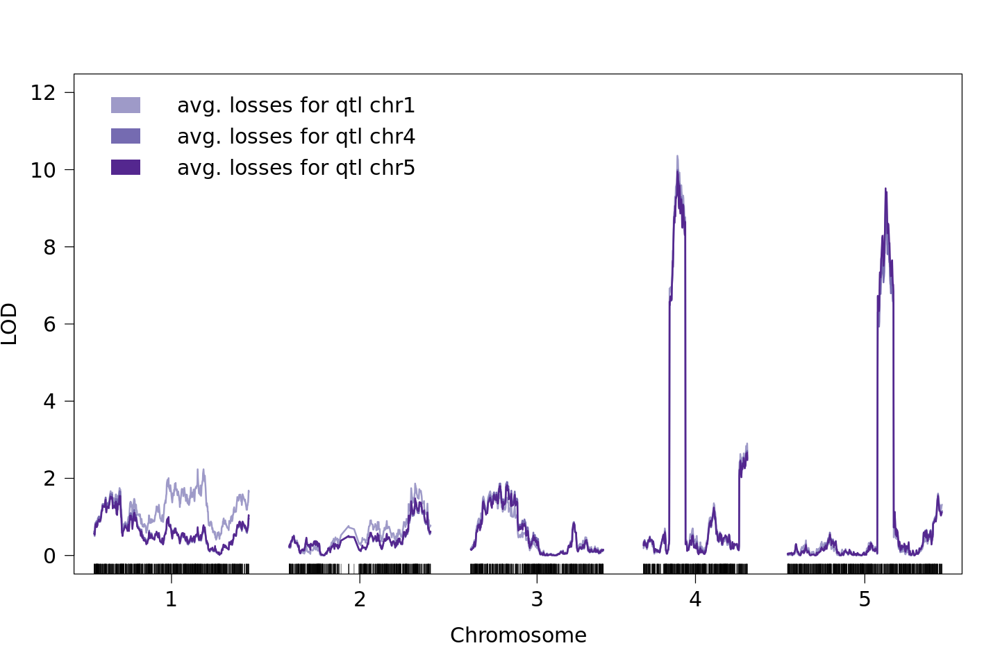

In [133]:
par(cex.axis = 1.5, cex.lab = 1.5)

plot(loss_cim_0, ylab="LOD", ylim = c(0, 12), col = brewer.pal(5, "Purples")[3])

plot(loss_cim_1, ylab="LOD", col = brewer.pal(5, "Purples")[4], add = T)

plot(loss_cim_2, ylab="LOD", col = brewer.pal(5, "Purples")[5], add = T)


legend("topleft", c("avg. losses for qtl chr1", "avg. losses for qtl chr4", 'avg. losses for qtl chr5'), fill = brewer.pal(5, "Purples")[c(3,4,5)], ncol = 1, border = NA, box.lty = 0, bg="transparent", cex = 1.5)

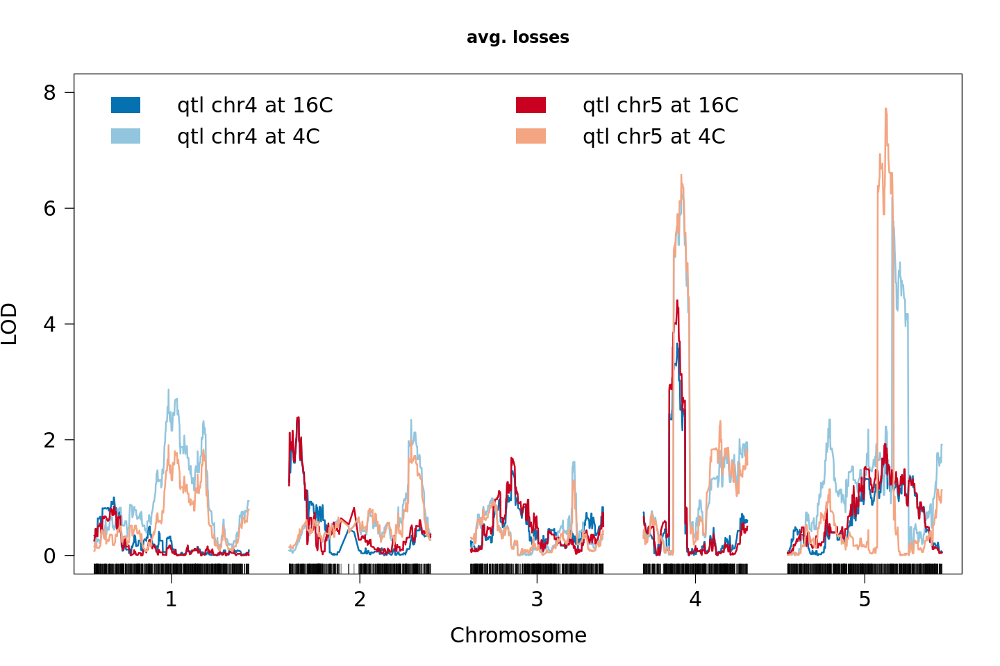

In [27]:
par(cex.axis = 1.5, cex.lab = 1.5)

plot(cim(cross_genotypes[["2020.d1.t16"]], pheno.col = "deviation_1_nonpoly_qtl_loss_1", n.marcovar = 1), ylab="LOD", ylim = c(0, 8), col = brewer.pal(5, "RdBu")[5], main = "avg. losses")
plot(cim(cross_genotypes[["2020.d1.t4"]], pheno.col = "deviation_1_nonpoly_qtl_loss_1", n.marcovar = 2), col = brewer.pal(5, "RdBu")[4], add = T)

plot(cim(cross_genotypes[["2020.d1.t16"]], pheno.col = "deviation_1_nonpoly_qtl_loss_2", n.marcovar = 2), col = brewer.pal(5, "RdBu")[1], add = T)
plot(cim(cross_genotypes[["2020.d1.t4"]], pheno.col = "deviation_1_nonpoly_qtl_loss_2", n.marcovar = 2), col = brewer.pal(5, "RdBu")[2], add = T)

# plot(gain_cim_2, ylab="LOD", ylim = c(0, 8), col = brewer.pal(5, "OrRd")[5], add = T)


legend("topleft", c("qtl chr4 at 16C", "qtl chr4 at 4C", "qtl chr5 at 16C", "qtl chr5 at 4C"), fill = brewer.pal(5, "RdBu")[c(5,4,1,2)], ncol = 2, border = NA, box.lty = 0, bg="transparent", cex = 1.5)


## Mapping epistasis

In [20]:
m = c()# cross_genotypes[["2020.d1"]]
for (i in 1:5){
    m = c(m, pickMarkerSubset(pull.map(cross_genotypes[["2020.d2"]])[[i]], 0.5))
}
subset_cross = drop.markers(cross_genotypes[["2020.d2"]],  markernames(cross_genotypes[["2020.d2"]])[which(!(markernames(cross_genotypes[["2020.d2"]]) %in% m))]  )

In [17]:
# subset_cross$pheno

In [21]:
m = scantwo(subset_cross, pheno.col = 'mean.dev_1', method="hk", n.cluster = 8)

 --Running scanone
 --Running scantwo
 (1,1)
 (1,2)
 (1,3)
 (1,4)
 (1,5)
 (2,2)
 (2,3)
 (2,4)
 (2,5)
 (3,3)
 (3,4)
 (3,5)
 (4,4)
 (4,5)
 (5,5)


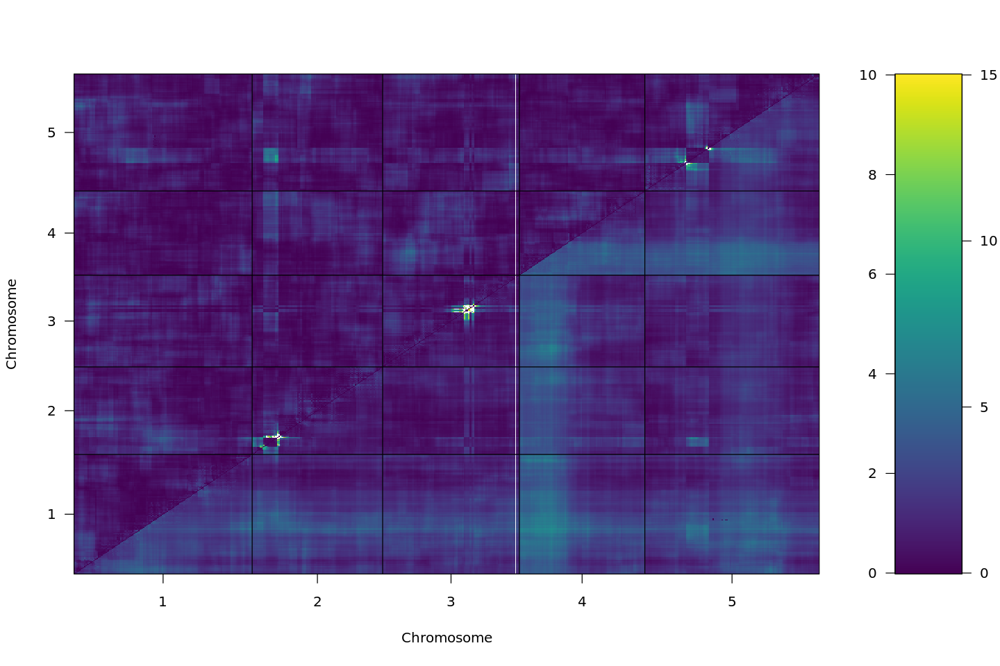

In [23]:
plot(m, zlim = c(15, 10))

In [22]:
arrange(summary(m, what="int"), lod.int)

chr1,chr2,pos1,pos2,lod.full,lod.fv1,lod.int,lod.add,lod.av1
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,4,99.618367,5.425788,6.592729,3.04441309,2.536524,4.0562052,0.50788915
1,1,6.405450,13.130661,3.757111,0.55193140,2.564607,1.1925035,-2.01267586
1,3,9.195227,43.155993,3.396575,0.19139602,2.678772,0.7178030,-2.48737631
4,4,25.797031,51.105371,5.355671,1.80735488,2.735987,2.6196837,-0.92863240
2,3,14.516641,45.943490,3.027235,2.13678222,2.766847,0.2603881,-0.63006495
3,5,73.191665,21.818996,3.855829,2.02597227,2.793612,1.0622168,-0.76763944
4,5,67.185466,23.786065,3.515549,-0.03276733,2.862579,0.6529694,-2.89534668
1,2,102.251262,14.516641,4.198531,0.99335134,3.346794,0.8517364,-2.35344296
1,5,4.270042,71.213487,5.649073,2.44389389,3.374438,2.2746355,-0.93054386


### QTLs
```
chr	pos
Chr1:5038757	1	16.13393
Chr5:15932197	5	57.36564

```

```
Chr1:21740818	1	64.38145
Chr4:5929511	4	23.50346
Chr5:16445720	5	60.95324
```

chr1,chr2,pos1,pos2,lod.full,lod.fv1,lod.int,lod.add,lod.av1
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4,5,60.516214,87.525640,5.775037,-1.8117368,4.830342,0.9446948,-6.64207866
2,3,72.578191,3.422314,6.612863,4.2515552,4.838182,1.7746812,-0.58662667
2,4,71.926434,62.634064,7.484682,5.3584680,4.945465,2.5392169,0.41300286
1,4,68.689748,33.932734,7.015163,3.9546603,4.945946,2.0692170,-0.99128578
3,5,4.074135,20.541316,6.059935,-1.5268384,4.968384,1.0915510,-6.49522242
3,4,71.352974,37.841553,7.416588,5.0552803,5.162657,2.2539313,-0.10737657
1,3,95.436976,39.901121,7.700706,4.6402034,5.213288,2.4874186,-0.57308410
2,5,68.334893,79.861652,8.228027,0.6412533,5.661314,2.5667127,-5.02006073
1,2,85.152998,46.159523,8.928636,5.8681332,6.656417,2.2722189,-0.78828381


In [52]:
mperm = scantwo(subset_cross, pheno.col = 'deviation_1_nonpoly_qtl_loss_1', method="hk", intcovar = as.numeric(subset_cross$pheno[,'temp.x']), n.cluster = 8,n.perm = 100)

In [112]:
summary(mperm)

,deviation_1_nonpoly_qtl_loss_0
5%,9.327152
10%,8.494308
,deviation_1_nonpoly_qtl_loss_0
5%,6.834351
10%,6.366843
,deviation_1_nonpoly_qtl_loss_0
5%,5.462817
10%,5.081526
,deviation_1_nonpoly_qtl_loss_0
5%,6.122839


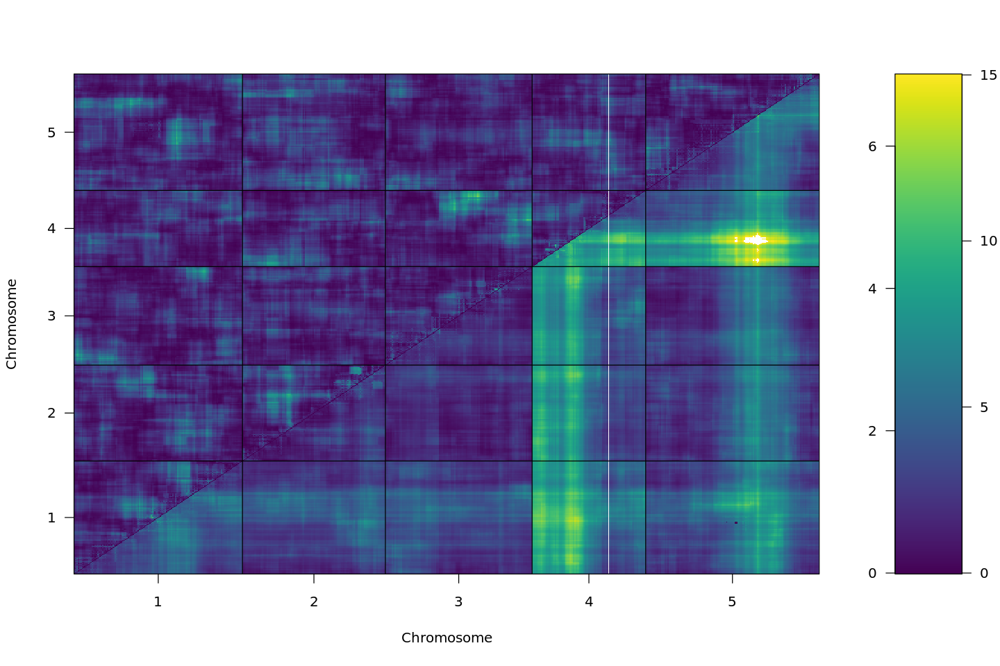

In [114]:
plot(m, zlim = c(15, 7))

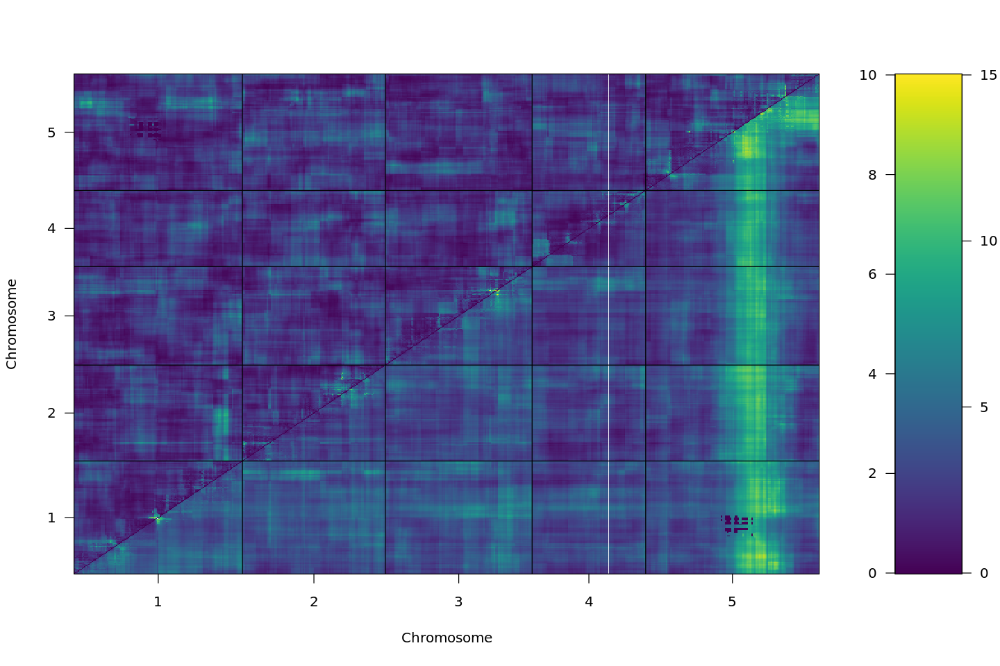

In [129]:
m = scantwo(subset_cross, pheno.col = 'deviation_0_nonpoly_qtl_gain_0', method="hk", n.cluster = 8)

 --Running scanone
 --Running scantwo
 (1,1)
 (1,2)
 (1,3)
 (1,4)
 (1,5)
 (2,2)
 (2,3)
 (2,4)
 (2,5)
 (3,3)
 (3,4)
 (3,5)
 (4,4)
 (4,5)
 (5,5)


In [ ]:
# intcovar = as.numeric(cross_genotypes[["2020.d1"]]$pheno[,'temp.x']),

In [125]:
# mperm = scantwo(subset_cross, intcovar = as.numeric(cross_genotypes[["2020.d1"]]$pheno[,'temp.x']), pheno.col = 'deviation_0_nonpoly_qtl_gain_2', method="hk", n.cluster = 8,n.perm = 100)

In [126]:
summary(mperm)

,deviation_0_nonpoly_qtl_gain_2
5%,12.52161
10%,11.15478
,deviation_0_nonpoly_qtl_gain_2
5%,10.984017
10%,9.818262
,deviation_0_nonpoly_qtl_gain_2
5%,7.538152
10%,6.700050
,deviation_0_nonpoly_qtl_gain_2
5%,8.362636


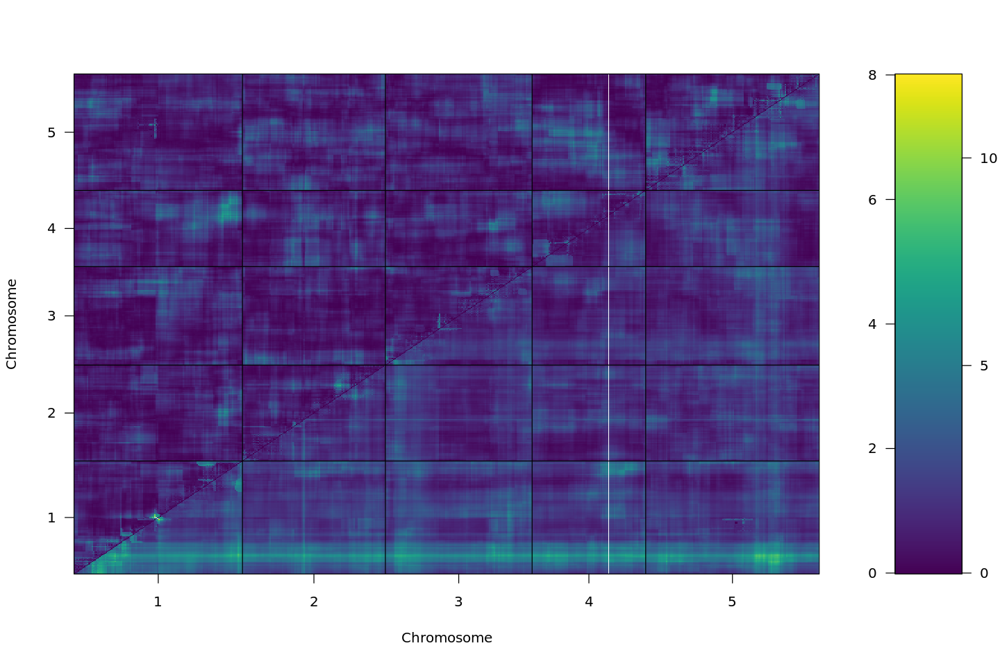

In [130]:
plot(m, zlim = c(12, 8))

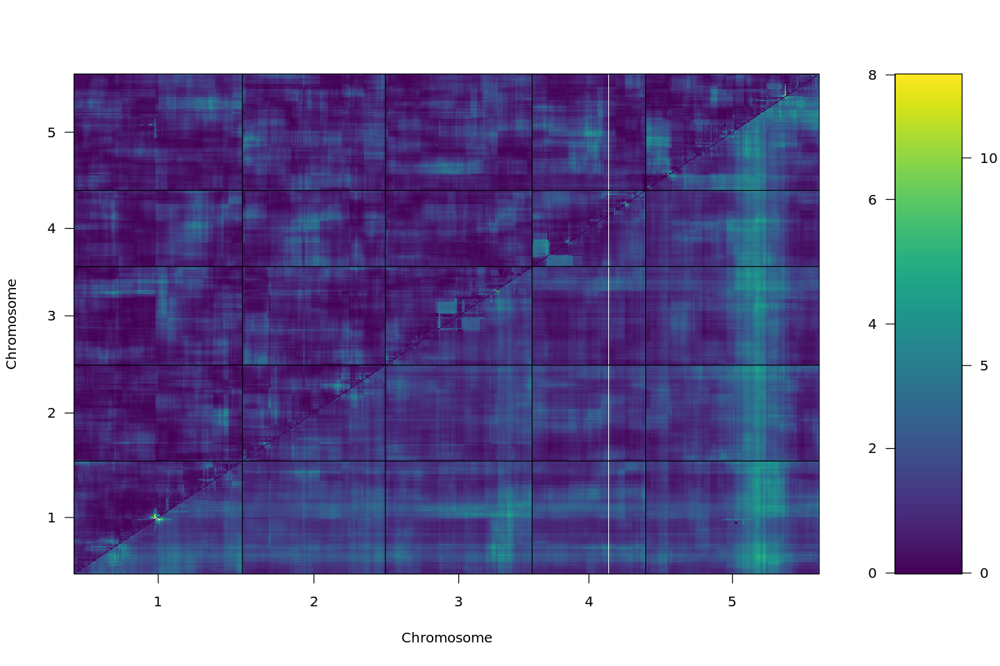

In [128]:
plot(m, zlim = c(12, 8))

In [ ]:
cross = cross_genotypes[["2020.d1"]]# mqmaugment(cross_genotypes[["2020.d1.t16"]], minprob=0.001)
cross = subset(cross, chr = c(1))


cross$pheno = cross$pheno[,13:ncol(cross$pheno)]

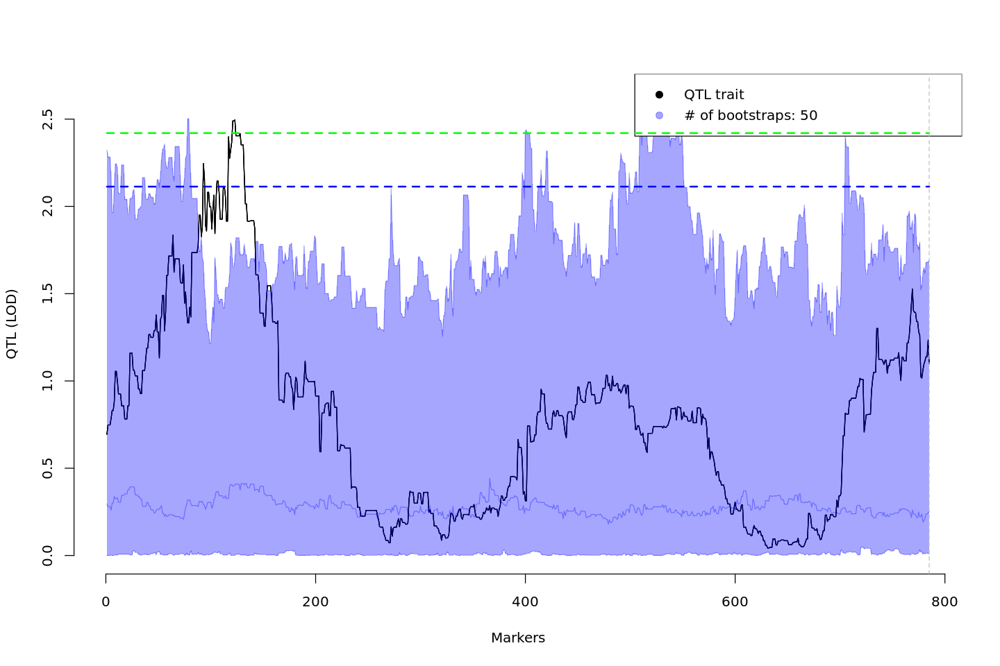

In [134]:
perm = mqmpermutation(cross, pheno.col = 'avg_gains', plot = T, n.perm = 50)

Warning message in scanfunction(cross = all.data, pheno.col = x, ...):
“First running calc.genoprob.”


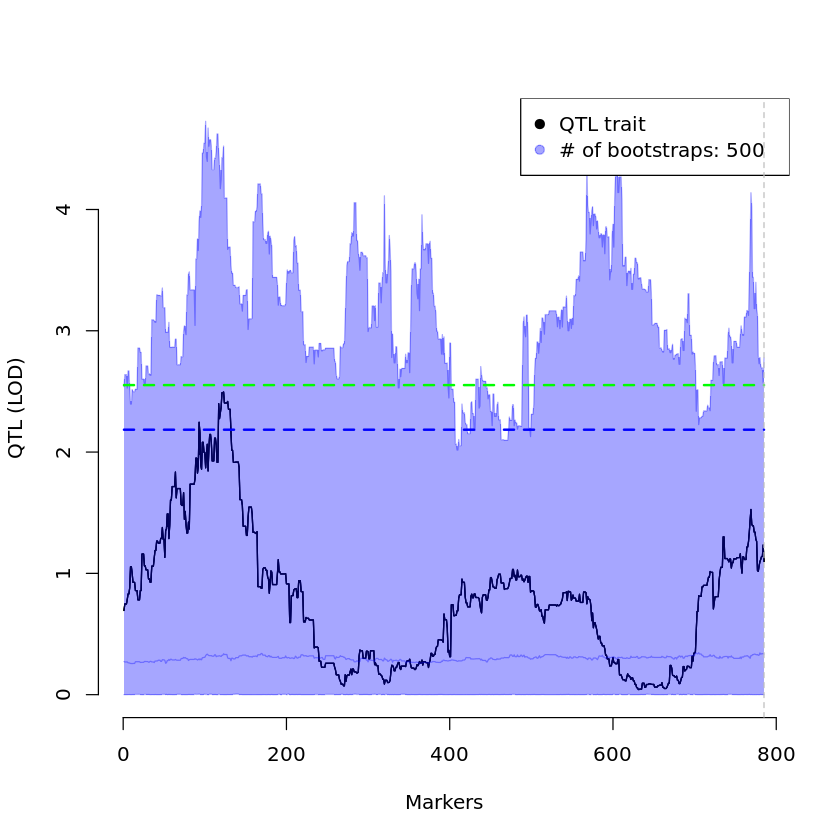

In [26]:
perm = mqmpermutation(cross, pheno.col = 'avg_gains', plot = T, n.perm = 500, n.cluster = 5)

In [135]:
f2perm <- mqmprocesspermutation(perm)

In [137]:
summary(f2perm)

LOD thresholds (50 permutations)
     lod
5%  2.42
10% 2.11

## Mapping conversion rate?



In [ ]:
ef_conv_rate = read_csv("cache_data/temp.sample_conv_rate.csv")

# ef_conv_rate = create_rqtl_phenos(cross_genotypes[["2020.d1"]], ef_conv_rate %>% column_to_rownames("X1") %>% rownames_to_column("id") )
cross_genotypes[['2020.d1']]$pheno = left_join(cross_genotypes[['2020.d1']]$pheno[1:12],  ef_conv_rate %>% column_to_rownames("X1") %>% rownames_to_column("id"), by = "id")

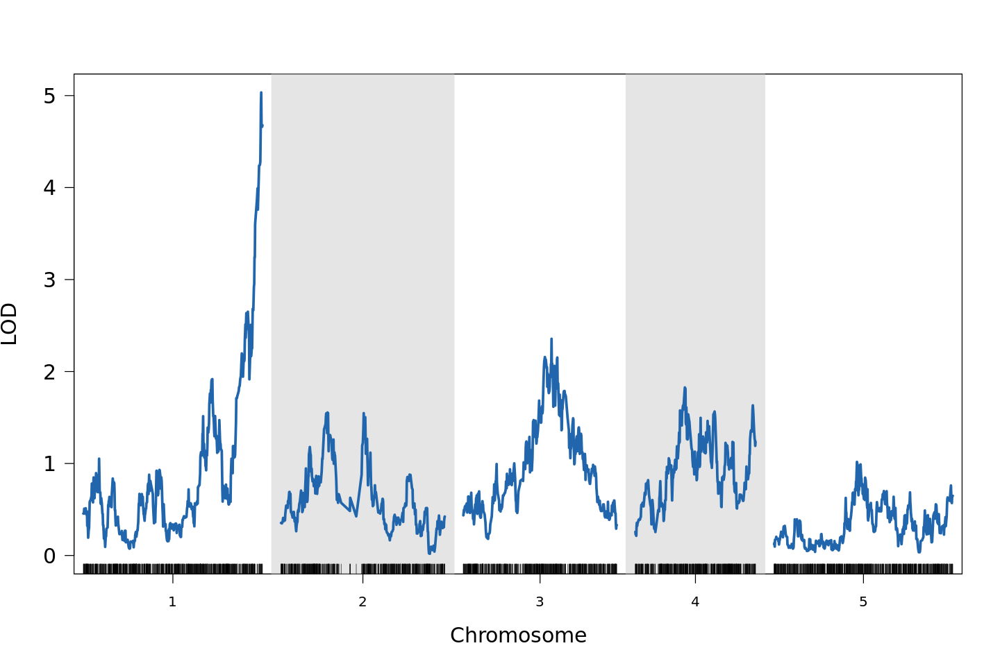

In [14]:
t_model = scanone(cross_genotypes[["2020.d1"]], pheno.col = "cobs_chrc", intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp)  )

plot_qtl_map(t_model )


In [15]:
summary(t_model)

,chr,pos,lod
,<fct>,<dbl>,<dbl>
Chr1:29974305,1,95.59971,5.033921
Chr2:6548322,2,25.18338,1.554611
Chr3:11460783,3,47.39552,2.355855
Chr4:6582815,4,26.60040,1.826706
Chr5:10778954,5,44.49559,1.017778


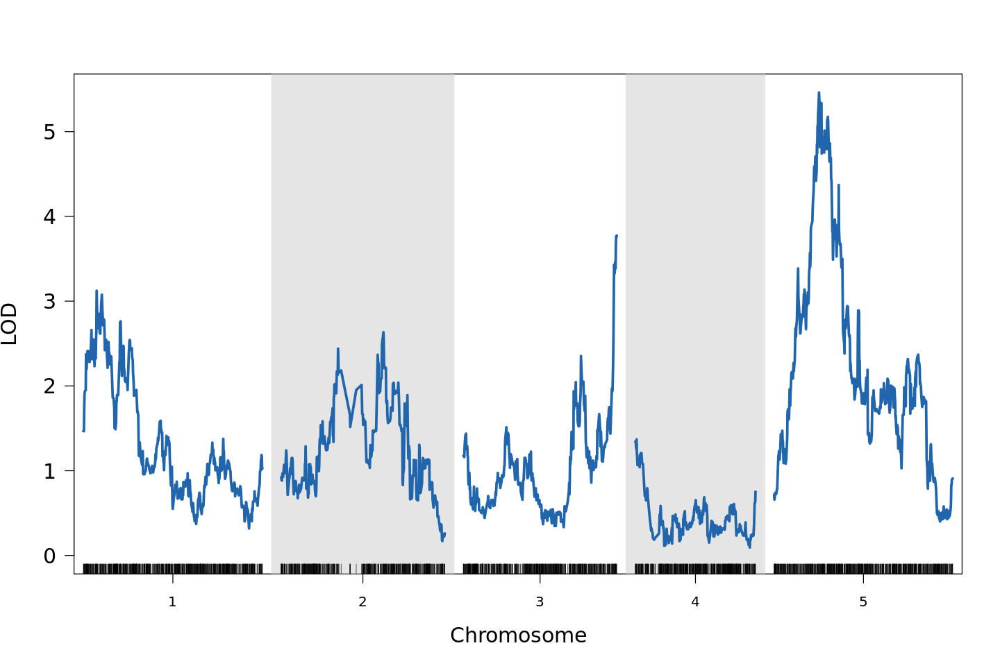

In [16]:
t_model = scanone(cross_genotypes[["2020.d1"]], pheno.col = "cnv_chrc", intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp))


plot_qtl_map( t_model )

In [17]:
summary(t_model)

,chr,pos,lod
,<fct>,<dbl>,<dbl>
Chr1:2991340,1,7.1666179,3.122596
Chr2:10274260,2,55.2931088,2.633459
Chr3:23075201,3,82.4382323,3.773999
Chr4:148872,4,0.6557437,1.370274
Chr5:6262735,5,24.1255556,5.461568


## Mapping epimutations at gene clusters

CG gbM gain and loss averaged over 8 gene clusters from Jamge _et al._ 2022




In [22]:
ef_rates = read_csv( "cache_data/epimutation_rates_gene_cls.csv" )
ef_rates = create_rqtl_phenos(cross_genotypes[["2020.d1"]], ef_rates %>% column_to_rownames("X1") %>% rownames_to_column("id") )

cross_genotypes[['2020.d1']]$pheno = left_join(cross_genotypes[['2020.d1']]$pheno[1:12],  ef_rates, by = "id")


── Column specification ────────────────────────────────────────────────────────
cols(
  .default = col_double(),
  X1 = col_character()
)
ℹ Use `spec()` for the full column specifications.




In [30]:
tic()
qtl_output_file = "/groups/nordborg/projects/epiclines/005.manu.crosses.2020/004.design_resolved/epimutation_rates/qtl_maps_deviations_gene_cls.csv"

write_multi_qtl = function(qtl_result, output_file, ...){
    qtl_result = t(qtl_result)[3:dim(qtl_result)[2],]
    write.table(as.data.frame(qtl_result), output_file, sep = "\t", quote = F, row.names = T, col.names = F, ...)
    
}
### Mapping Gains
t_gains_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_0_nonpoly")))) < 80))


qtl_results[['gain_cls_intT']] = scanone(cross_genotypes[["2020.d1"]], pheno.col = t_gains_phenos, intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
colnames(qtl_results[['gain_cls_intT']]) = c("chr", "pos", str_c( str_remove(colnames(qtl_results[['gain_cls_intT']])[3:ncol(qtl_results[['gain_cls_intT']])], "deviation_0_nonpoly:"), ".deviation_0_nonpoly_intT" ))
# 

t_losses_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_1_nonpoly")))) < 80))


qtl_results[['loss_cls_intT']] = scanone(cross_genotypes[["2020.d1"]], pheno.col = t_losses_phenos, intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
colnames(qtl_results[['loss_cls_intT']] ) = c("chr", "pos", str_c( str_remove(colnames(qtl_results[['loss_cls_intT']] )[3:ncol(qtl_results[['loss_cls_intT']] )], "deviation_1_nonpoly:"), ".deviation_1_nonpoly_intT" ))


toc()

33.291 sec elapsed


In [31]:
write_multi_qtl(qtl_results[['gain_cls_intT']], qtl_output_file, append = F )
write_multi_qtl(qtl_results[['loss_cls_intT']], qtl_output_file, append = T )


## Mapping epimutations in 500kb windows

In [68]:
# tic()
# qtl_output_file = "/groups/nordborg/projects/epiclines/005.manu.crosses.2020/004.design_resolved/epimutation_rates/qtl_maps_deviations_500Kb_rep2.csv"

# write_multi_qtl = function(qtl_result, output_file, ...){
#     qtl_result = t(qtl_result)[3:dim(qtl_result)[2],]
#     write.table(as.data.frame(qtl_result), output_file, sep = "\t", quote = F, row.names = T, col.names = F, ...)
    
# }
# ### Mapping Gains
# t_gains_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_0_nonpoly")))) < 200))


# t_qtl_results = scanone(cross_genotypes[["2020.d1"]], pheno.col = t_gains_phenos, intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
# colnames(t_qtl_results) = c("chr", "pos", str_c( str_remove(colnames(t_qtl_results)[3:ncol(t_qtl_results)], "deviation_0_nonpoly:"), ".deviation_0_nonpoly_intT" ))
# write_multi_qtl(t_qtl_results, qtl_output_file, append = F  )


# t_qtl_results = scanone(cross_genotypes[["2020.d1"]], pheno.col = t_gains_phenos, addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
# colnames(t_qtl_results) = c("chr", "pos", str_c( str_remove(colnames(t_qtl_results)[3:ncol(t_qtl_results)], "deviation_0_nonpoly:"), ".deviation_0_nonpoly_addT" ))
# write_multi_qtl(t_qtl_results, qtl_output_file, append = T  )


# t_qtl_results = scanone(cross_genotypes[["2020.d1"]], pheno.col = t_gains_phenos )
# colnames(t_qtl_results) = c("chr", "pos", str_c( str_remove(colnames(t_qtl_results)[3:ncol(t_qtl_results)], "deviation_0_nonpoly:"), ".deviation_0_nonpoly" ))
# write_multi_qtl(t_qtl_results, qtl_output_file, append = T  )



# # ### Mapping Losses
# t_losses_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_1_nonpoly")))) < 200))


# t_qtl_results = scanone(cross_genotypes[["2020.d1"]], pheno.col = t_losses_phenos, intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
# colnames(t_qtl_results) = c("chr", "pos", str_c( str_remove(colnames(t_qtl_results)[3:ncol(t_qtl_results)], "deviation_1_nonpoly:"), ".deviation_1_nonpoly_intT" ))
# write_multi_qtl(t_qtl_results, qtl_output_file, append = T  )


# t_qtl_results = scanone(cross_genotypes[["2020.d1"]], pheno.col = t_losses_phenos, addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
# colnames(t_qtl_results) = c("chr", "pos", str_c( str_remove(colnames(t_qtl_results)[3:ncol(t_qtl_results)], "deviation_1_nonpoly:"), ".deviation_1_nonpoly_addT" ))
# write_multi_qtl(t_qtl_results, qtl_output_file, append = T  )


# t_qtl_results = scanone(cross_genotypes[["2020.d1"]], pheno.col = t_losses_phenos )
# colnames(t_qtl_results) = c("chr", "pos", str_c( str_remove(colnames(t_qtl_results)[3:ncol(t_qtl_results)], "deviation_1_nonpoly:"), ".deviation_1_nonpoly" ))
# write_multi_qtl(t_qtl_results, qtl_output_file, append = T  )



# toc()

In [65]:
tic()

cross_geno = cross_genotypes[['2020.d2']]
t_phenos = names(which(colSums(is.na(cross_geno$pheno %>% dplyr::select(starts_with("deviation_0_nonpoly")))) < 200))

t_phenos = str_remove(t_phenos, "deviation_0_nonpoly:")

cl <- makeCluster(20, type="SOCK")

registerDoSNOW(cl)

finalMatrix <- foreach(ef_pheno_id=t_phenos, .combine=rbind, .packages=c("qtl", "tidyverse")) %dopar% {
    t_gain_models = tryCatch( list(
        scanone(cross_geno, pheno.col = paste0("deviation_0_nonpoly:", ef_pheno_id), intcovar = as.numeric(cross_geno$pheno$temp) ),
        scanone(cross_geno, pheno.col = paste0("deviation_0_nonpoly:", ef_pheno_id), addcovar = as.numeric(cross_geno$pheno$temp) ),
        scanone(cross_geno, pheno.col = paste0("deviation_0_nonpoly:", ef_pheno_id) ),
        cim(cross_geno, pheno.col = paste0("deviation_0_nonpoly:", ef_pheno_id) )
    ), error = function(e) paste("error" ) )
    
    t_loss_models = tryCatch( list(
        scanone(cross_geno, pheno.col = paste0("deviation_1_nonpoly:", ef_pheno_id), intcovar = as.numeric(cross_geno$pheno$temp) ),
        scanone(cross_geno, pheno.col = paste0("deviation_1_nonpoly:", ef_pheno_id), addcovar = as.numeric(cross_geno$pheno$temp) ),
        scanone(cross_geno, pheno.col = paste0("deviation_1_nonpoly:", ef_pheno_id) ),
        cim(cross_geno, pheno.col = paste0("deviation_1_nonpoly:", ef_pheno_id) )
    ), error = function(e) paste("error" ) )
                             
    results = c()


    if (t_gain_models != "error"){
        results = rbind(results, c(paste0(ef_pheno_id, ".deviation_0_nonpoly_intT"), t_gain_models[[1]][markernames(cross_geno),"lod"]) )
        results = rbind(results, c(paste0(ef_pheno_id, ".deviation_0_nonpoly_addT"), t_gain_models[[2]][markernames(cross_geno),"lod"]) )
        results = rbind(results, c(paste0(ef_pheno_id, ".deviation_0_nonpoly"), t_gain_models[[3]][markernames(cross_geno),"lod"]) )
        results = rbind(results, c(paste0(ef_pheno_id, ".deviation_0_nonpoly_cim"), t_gain_models[[4]][markernames(cross_geno),"lod"]) )
    }
                             
    if (t_loss_models != "error"){
        results = rbind(results, c(paste0(ef_pheno_id, ".deviation_1_nonpoly_intT"), t_loss_models[[1]][markernames(cross_geno),"lod"]) )
        results = rbind(results, c(paste0(ef_pheno_id, ".deviation_1_nonpoly_addT"), t_loss_models[[2]][markernames(cross_geno),"lod"]) )
        results = rbind(results, c(paste0(ef_pheno_id, ".deviation_1_nonpoly"), t_loss_models[[3]][markernames(cross_geno),"lod"]) )
        results = rbind(results, c(paste0(ef_pheno_id, ".deviation_1_nonpoly_cim"), t_loss_models[[4]][markernames(cross_geno),"lod"]) )
    }
                             
    results

}     
finalMatrix = as.data.frame(finalMatrix)
                     
# colnames(finalMatrix) = c("gene", markernames(cross_genotypes[["2020.d1"]] ) )

# finalMatrix = finalMatrix %>% drop_na() %>% `row.names<-`(., NULL) %>% column_to_rownames("gene") %>% mutate_all(as.character) %>% mutate_all(as.numeric)        
toc()


528.825 sec elapsed


In [66]:
qtl_output_file = "/groups/nordborg/projects/epiclines/005.manu.crosses.2020/004.design_resolved/epimutation_rates/qtl_maps_deviations_500Kb_d2_rep3.csv"

write.table(finalMatrix, qtl_output_file, sep = "\t", quote = F, row.names = F, col.names = F, append = F)

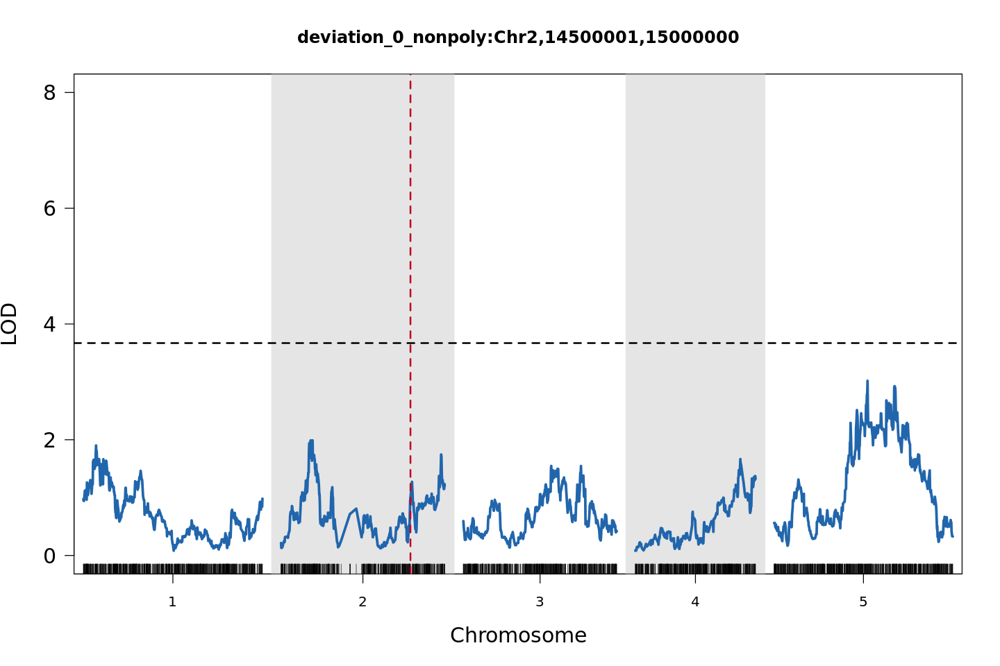

In [104]:
t_ix = 89
# t_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_1_nonpoly")))) < 200))
t_phenos = names(which(colSums(is.na(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_0_nonpoly")))) < 200))

t_model = scanone( cross_genotypes[['2020.d1']], pheno.col = t_phenos[t_ix], intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )

plot_qtl_map(t_model, ylim = c(0, 8), gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], str_split_fixed(t_phenos[t_ix], ":", n = 2)[,2]), main = t_phenos[t_ix]  )
# ef_model_1 = scanone( cross_genotypes[['2020.d1']], pheno.col = t_phenos[t_ix], intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
# # ef_model_2 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("site_deviation_0:", ef_bed_str), addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
# ef_model_2 = scanone( cross_genotypes[['2020.d1']], pheno.col = t_phenos[t_ix] )
# plot_qtl_map(x = ef_model_1, x2 = ef_model_2, ylim = c(0, 8), col = c("#e41a1c", "#377eb8"), lwd = 2.5, gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], ef_bed_str), main = paste("QTL mapping at ", t_phenos[t_ix]) )
# legend("topleft", legend=c("avg. sites gain x T", "avg. sites gain"), col=c("#e41a1c", "#377eb8", "#4daf4a"), lty = 1, lwd = 3, cex=1, box.lty=0, bg=NA)

abline( h = 3.67, lwd = 2, lty = 2 )

In [54]:
qtls_gain = c("Chr1:5038757", "Chr5:15932197")
qtls_loss = c("Chr1:21740818", "Chr4:5929511", "Chr5:16445720")


In [105]:
epistasis.qtl.gain = scantwo(subset(cross_genotypes[['2020.d1']], chr = c(1, 5)  ), pheno.col = t_phenos[t_ix], method="hk", intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )

 --Running scanone
 --Running scantwo
 (1,1)
 (1,5)
 (5,5)


In [107]:
summary( scantwo(subset(cross_genotypes[['2020.d1']], chr = c(1, 5)  ), pheno.col = t_phenos[t_ix], method="hk", intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp), n.perm = 10 ) )

Permutation 1 
Permutation 2 
Permutation 3 
Permutation 4 
Permutation 5 
Permutation 6 
Permutation 7 
Permutation 8 
Permutation 9 
Permutation 10 


,"deviation_0_nonpoly:Chr2,14500001,15000000"
5%,13.13768
10%,12.94334
,"deviation_0_nonpoly:Chr2,14500001,15000000"
5%,10.78588
10%,10.15038
,"deviation_0_nonpoly:Chr2,14500001,15000000"
5%,5.750223
10%,5.607428
,"deviation_0_nonpoly:Chr2,14500001,15000000"
5%,9.654063


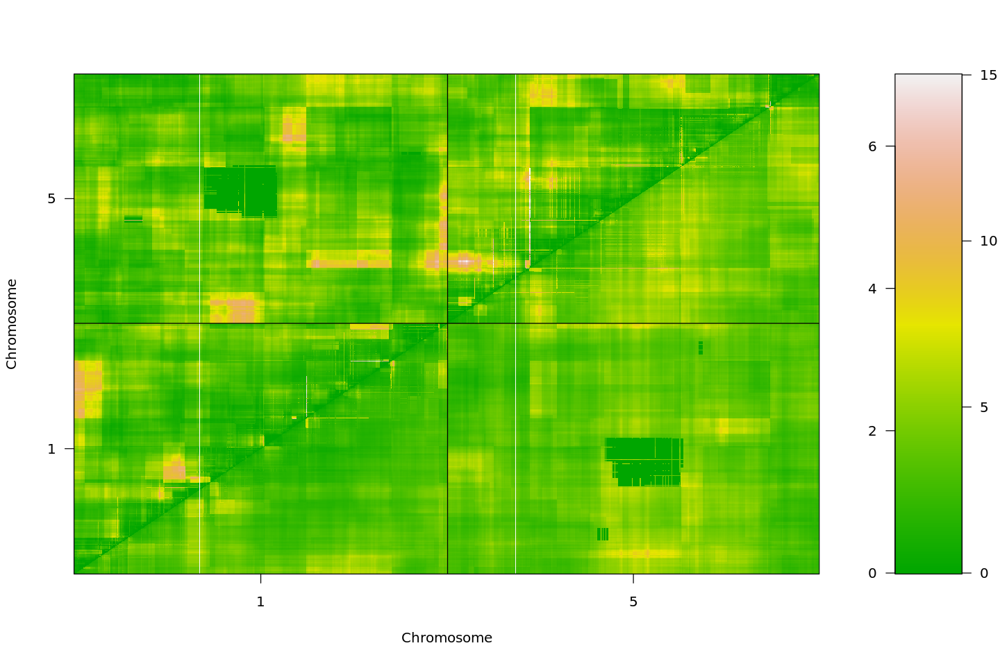

In [118]:
# pdf("epistasis.gains.pdf")
plot( epistasis.qtl.gain, zlim = c(15,7),   col.scheme = "terrain", lower = "full", upper = "int" )

# dev.off()

In [65]:
epistasis.qtl.loss = scantwo(subset(cross_genotypes[['2020.d1']], chr = c(1, 4, 5)  ), pheno.col = t_phenos[t_ix], method="hk")

 --Running scanone
 --Running scantwo
 (1,1)
 (1,4)
 (1,5)
 (4,4)
 (4,5)
 (5,5)


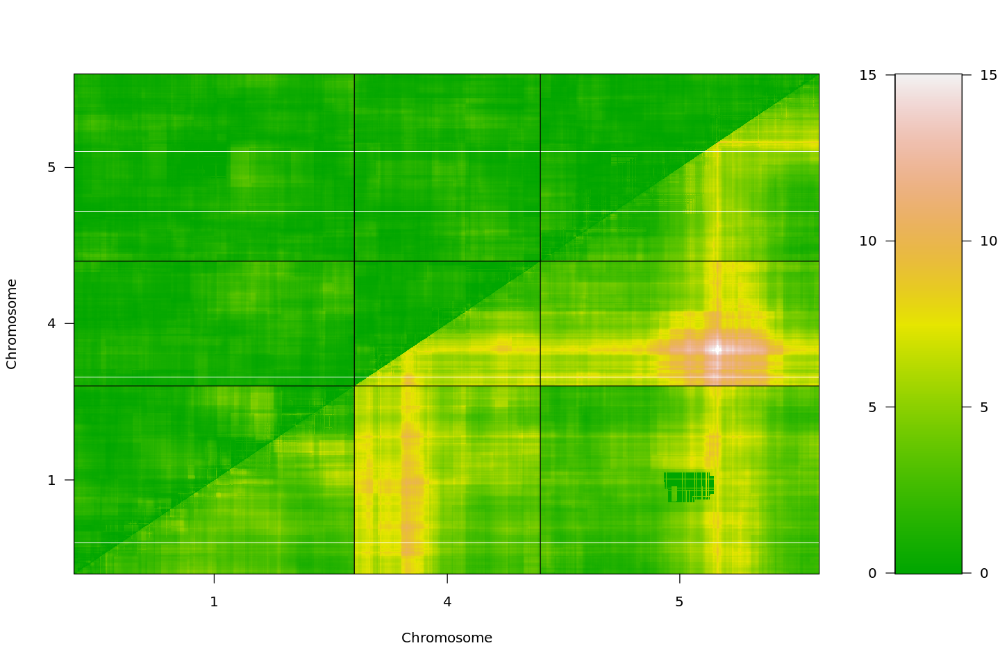

In [120]:
# pdf("epistasis.loss.pdf")
plot(epistasis.qtl.loss, zlim = c(15, 15), col.scheme = "terrain", cex = 2, cex.lab = 2 )

# dev.off()
 # cex = 1.2

In [45]:
scantwo( cross_genotypes[['2020.d1']], pheno.col = t_phenos[t_ix], intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )

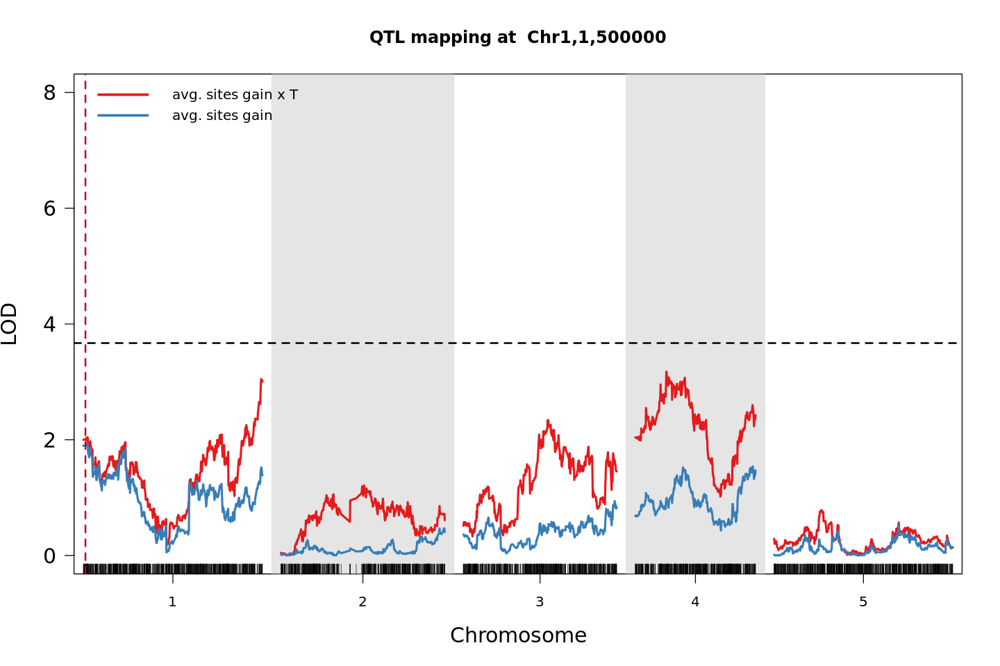

In [13]:
ef_bed_str = "Chr1,1,500000"
# ef_bed_str = "Chr1,500001,1000000"
# ef_bed_str = str_replace(colnames(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_0")))[17], "deviation_0:", "")


ef_model_1 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("deviation_0:", ef_bed_str), intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
# ef_model_2 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("site_deviation_0:", ef_bed_str), addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
ef_model_2 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("deviation_0:", ef_bed_str) )



plot_qtl_map(x = ef_model_1, x2 = ef_model_2, ylim = c(0, 8), col = c("#e41a1c", "#377eb8"), lwd = 2.5, gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], ef_bed_str), main = paste("QTL mapping at ", ef_bed_str) )
legend("topleft", legend=c("avg. sites gain x T", "avg. sites gain"), col=c("#e41a1c", "#377eb8", "#4daf4a"), lty = 1, lwd = 3, cex=1, box.lty=0, bg=NA)

abline( h = 3.67, lwd = 2, lty = 2 )

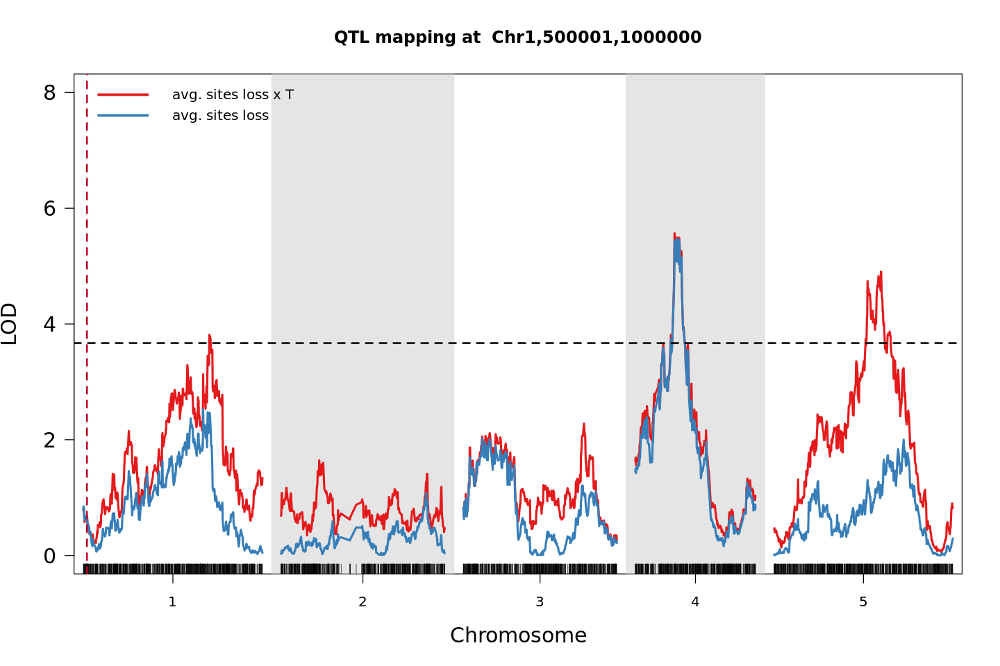

In [14]:
# ef_bed_str = "Chr1,1,500000"
ef_bed_str = "Chr1,500001,1000000"


ef_model_1 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("deviation_1:", ef_bed_str), intcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
# ef_model_2 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("site_deviation_1:", ef_bed_str), addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
ef_model_2 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("deviation_1:", ef_bed_str) )



plot_qtl_map(x = ef_model_1, x2 = ef_model_2, ylim = c(0, 8), col = c("#e41a1c", "#377eb8"), lwd = 2.5, gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], ef_bed_str), main = paste("QTL mapping at ", ef_bed_str) )
legend("topleft", legend=c("avg. sites loss x T", "avg. sites loss"), col=c("#e41a1c", "#377eb8", "#4daf4a"), lty = 1, lwd = 3, cex=1, box.lty=0, bg=NA)

abline( h = 3.67, lwd = 2, lty = 2 )

In [292]:

find_qtls_from_scanoutput( cross_genotypes[['2020.all']], ef_model_2, qtl_thres = 3 )


GRanges object with 2 ranges and 5 metadata columns:
      seqnames            ranges strand |        marker            l_lod
         <Rle>         <IRanges>  <Rle> |   <character>        <numeric>
  [1]     Chr4    803416-7160943      * |  Chr4:6235315 4.42146140457533
  [2]     Chr5 15591737-19871408      * | Chr5:16752338 1.83009755130865
                   lod            r_lod     width
             <numeric>        <numeric> <integer>
  [1] 6.20451473709147 4.50074085398234   6357528
  [2] 3.45926629951185 1.91666928341346   4279672
  -------
  seqinfo: 5 sequences from an unspecified genome; no seqlengths

In [289]:

find_qtls_from_scanoutput( cross_genotypes[['2020.d1']], ef_model_2, qtl_thres = 3 )


GRanges object with 2 ranges and 5 metadata columns:
      seqnames            ranges strand |        marker            l_lod
         <Rle>         <IRanges>  <Rle> |   <character>        <numeric>
  [1]     Chr4    139505-6525625      * |  Chr4:5436563 5.00895706318454
  [2]     Chr5 10261698-19142548      * | Chr5:16452761 1.75886469024294
                   lod            r_lod     width
             <numeric>        <numeric> <integer>
  [1] 6.35577586946272 4.87125623469365   6386121
  [2] 3.43421947762181 1.71108857987213   8880851
  -------
  seqinfo: 5 sequences from an unspecified genome; no seqlengths

## ANOVA for determining G, E and GxE 

In [47]:
# 
data_phenos = cross_genotypes[['2020.d1']]$pheno
data_phenos_ids = str_remove(names(which(colSums(is.na(data_phenos %>% dplyr::select(starts_with("deviation_0_nonpoly:")))) < 80)), "deviation_0_nonpoly:")
# data_phenos_ids = data_phenos_ids[str_detect(data_phenos_ids, "Chr2")]

## QTLs for CG gain 
qtls = c("Chr1:5038757", "Chr5:15932197")

qtls = as.data.frame( genotype_at_marker( cross_genotypes[['2020.d1']], qtls) )
data_phenos = left_join(data_phenos, qtls %>% rename_with( ~paste0("qtl_gains_", .x) ) %>% mutate(id = data_phenos$id ), by = "id" )

# ## QTLs for CG losses
qtls = c("Chr1:21740818", "Chr4:5929511", "Chr5:16445720")


qtls = as.data.frame( genotype_at_marker( cross_genotypes[['2020.d1']], qtls) )
data_phenos = left_join(data_phenos, qtls %>% rename_with( ~paste0("qtl_losses_", .x) ) %>% mutate(id = data_phenos$id ), by = "id" )

In [21]:
data_phenos_d1 = data_phenos

In [22]:
# reciprocal cross 
data_phenos = cross_genotypes[['2020.d2']]$pheno
data_phenos_ids = str_remove(names(which(colSums(is.na(data_phenos %>% dplyr::select(starts_with("deviation_0_nonpoly:")))) < 80)), "deviation_0_nonpoly:")
# data_phenos_ids = data_phenos_ids[str_detect(data_phenos_ids, "Chr2")]

## QTLs for CG gain 
qtls = c( "Chr2:11740264", "Chr5:8811039" )

qtls = as.data.frame( genotype_at_marker( cross_genotypes[['2020.d2']], qtls) )
data_phenos = left_join(data_phenos, qtls %>% rename_with( ~paste0("qtl_gains_", .x) ) %>% mutate(id = data_phenos$id ), by = "id" )

# ## QTLs for CG losses
# c("Chr1:9931617", "Chr4:5363439", 'Chr5:15585328')  ### QTLs for D2
qtls = c("Chr1:21740818",  "Chr4:5365727", 'Chr5:16445720')
qtls = as.data.frame( genotype_at_marker( cross_genotypes[['2020.d2']], qtls) )
data_phenos = left_join(data_phenos, qtls %>% rename_with( ~paste0("qtl_losses_", .x) ) %>% mutate(id = data_phenos$id ), by = "id" )

In [23]:
data_phenos = rbind(data_phenos_d1, data_phenos)

In [108]:
find.markerpos(cross_genotypes[['2020.d2']], c("Chr1:9931617",  "Chr4:5365727", 'Chr5:16445720'))

,chr,pos
,<chr>,<dbl>
Chr1:9931617,1,38.2327
Chr4:5365727,4,18.4181
Chr5:16445720,5,59.2358


In [80]:
find.markerpos(cross_genotypes[['2020.d1']], c("Chr1:5038757", "Chr5:15932197"))

,chr,pos
,<chr>,<dbl>
Chr1:5038757,1,16.13393
Chr5:15932197,5,57.36564


In [81]:
find.markerpos(cross_genotypes[['2020.d1']], c("Chr1:21740818", "Chr4:5929511", "Chr5:16445720"))

,chr,pos
,<chr>,<dbl>
Chr1:21740818,1,64.38145
Chr4:5929511,4,23.50346
Chr5:16445720,5,60.95324


In [83]:
transform_boxcox = function(y, x){
    t_box = boxcox( y ~ x, plotit = F)
    lambda <- t_box$x[which.max(t_box$y)]
    return( (y^lambda-1)/lambda )
}


In [48]:
get_gain_estimates = function(cross_geno, pheno_id){
    t_pheno = as.numeric(cross_geno$pheno[,paste0("deviation_0_nonpoly:", pheno_id)])
    # t_pheno = transform_boxcox(t_pheno)
    t_cis = get_closest_marker(cross_geno, pheno_id)
    qtl = makeqtl( cross_geno, chr = c( t_cis$chr, 1, 5), pos = c(t_cis$pos, 16.13, 57.37) )
    temp_cof = cbind(temp = as.numeric(cross_geno$pheno[,'temp']) - 1)
    print(class(temp_cof[,1]))
    mod = fitqtl(cross_geno, pheno.col = t_pheno, covar = temp_cof, qtl = qtl, formula = 'y ~ 1 + Q1 + Q2 + Q3 + temp +  Q1:temp + Q2:temp + Q3:temp + 1', get.ests = T)
    # mod = fitqtl(cross_geno, pheno.col = t_pheno, covar = cbind(temp = cross_geno$pheno[,'temp']), qtl = qtl, formula = 'y ~ 1 + Q1 + Q2 + Q3', get.ests = T)
    t_val = c(as.numeric(mod$result.full[,'%var'])[1]) ## Full var exp
    t_val = c(t_val, as.numeric(mod$result.drop[,'%var']) ) ### Var exp by factors
    t_val = c(t_val, as.numeric(mod$ests$ests)[c(1,2,3,4,5,6,7,8)]) ### Effect sizes
    return(mod)
}

get_loss_estimates = function(cross_geno, pheno_id){
    t_pheno = as.numeric(cross_geno$pheno[,paste0("deviation_1_nonpoly:", pheno_id)])
    t_cis = get_closest_marker(cross_geno, pheno_id)
    # qtl = makeqtl( cross_geno, chr = c( t_cis$chr, 1, 4, 5), pos = c(t_cis$pos, 64.38, 23.5, 60.95) )  ## d1
    qtl = makeqtl( cross_geno, chr = c( t_cis$chr, 1, 4, 5), pos = c(t_cis$pos, 38.2, 18.4, 59.2) )   ## d2
    mod = fitqtl(cross_geno, pheno.col = t_pheno, covar = cbind(temp = cross_geno$pheno[,'temp']), qtl = qtl, formula = 'y ~ Q1 + Q2 + Q3 + Q4 + temp +  Q1:temp + Q2:temp + Q3:temp + Q4:temp + 1', get.ests = T)
    t_val = c(as.numeric(mod$result.full[,'%var'])[1]) ## Full var exp
    t_val = c(t_val, as.numeric(mod$result.drop[,'%var']) ) ### Var exp by factors
    t_val = c(t_val, as.numeric(mod$ests$ests)[c(1,2,3,4,5,6,7,8,9,10)]) ### Effect sizes
    return(mod)
}

get_aov_estimates = function(data, pheno_id ){
    # t_cis = get_closest_marker(cross_geno, pheno_id)
    ef_pheno =  data %>% dplyr::select(c(paste0("deviation_0_nonpoly:", pheno_id), paste0("deviation_1_nonpoly:", pheno_id), "temp", paste0("subpop:", pheno_id), colnames(data_phenos)[str_detect(colnames(data_phenos), "qtl_")] ))
    colnames(ef_pheno)[1:4] = c("gains", 'losses', "temp", "cis")
    ef_pheno = ef_pheno %>% mutate_at(c("temp", "cis"),  as.factor) %>% mutate_at(vars(starts_with("qtl")),  as.factor)
    ef_pheno = ef_pheno %>% mutate(gains = scale(gains)) %>% mutate(losses = scale(losses))
    # # ef_pheno = ef_pheno %>% filter(gains > 0 ) %>%  filter(losses > 0) 
    # # # %>%  mutate( gains = transform_boxcox(gains, temp) ) %>% mutate( losses = transform_boxcox(losses, temp) )
    # # # ef_pheno = ef_pheno %>% filter(geno %in% c('AA', 'BB'))
    
    ### Fit a simple ANOVA
    # t_gain_aov = aov( as.formula("gains ~ 1 + cis + qtl_gains_V1 + qtl_gains_V2 + temp + temp:cis + temp:qtl_gains_V1 + temp:qtl_gains_V2"), data = ef_pheno, contrasts=list(geno=contr.sum, temp=contr.sum) )
    # t_gain_mod = Anova(t_gain_aov, type=3)
    # t_loss_aov = aov( as.formula("losses ~ 1 + temp + cis + qtl_losses_V1 + qtl_losses_V2 + qtl_losses_V3 + temp:cis + temp:qtl_losses_V1 + temp:qtl_losses_V2 + temp:qtl_losses_V3"), data = ef_pheno, contrasts=list(geno=contr.sum, temp=contr.sum) )
    # t_loss_mod = Anova(t_loss_aov, type=3)
    # # t_anova = Anova(t_model, type=3)
    # # t_tukey = TukeyHSD(t_model)
    
    ### Fit lmer, mixed model with random effects
    mod_g = lmer( gains ~ 1 + (1|temp) + (1|cis) + (1|qtl_gains_V1) + (1|qtl_gains_V2) + (1|temp:cis) + (1|temp:qtl_gains_V1) + (1|temp:qtl_gains_V2), data = ef_pheno  )
    vcov_g = (as.data.frame(VarCorr(mod_g)) %>% column_to_rownames('grp'))
    reff_g = ranef(mod_g)
    
    mod_l = lmer( losses ~ 1 + (1|temp) + (1|cis) + (1|qtl_losses_V1) + (1|qtl_losses_V2) + (1|qtl_losses_V3) + (1|temp:cis) + (1|temp:qtl_losses_V1) + (1|temp:qtl_losses_V2)  + (1|temp:qtl_losses_V3), data = ef_pheno  )
    vcov_l = (as.data.frame(VarCorr(mod_l)) %>% column_to_rownames('grp'))
    reff_l = ranef(mod_l)
    
    t_val = c(summary(mod_g)[[6]][1]) ### log lik.
    t_val = c(t_val, vcov_g[c('temp', 'cis', 'qtl_gains_V1', 'qtl_gains_V2', 'temp:cis', 'temp:qtl_gains_V1', 'temp:qtl_gains_V2', 'Residual'),'vcov'] )
    t_val = c(t_val, reff_g$cis['AA',1] - reff_g$cis['BB',1] )  ### Mean difference between AA and BB
    t_val = c(t_val, reff_g$qtl_gains_V1[1,1] - reff_g$qtl_gains_V1[3,1] )
    t_val = c(t_val, reff_g$qtl_gains_V2[1,1] - reff_g$qtl_gains_V2[3,1] )
    t_val = c(t_val, as.numeric(predict(mod_g, expand.grid(temp=c(1,2), cis="AA", qtl_gains_V1=1, qtl_gains_V2=1 ))) )
    t_val = c(t_val, as.numeric(predict(mod_g, expand.grid(temp=c(1,2), cis="BB", qtl_gains_V1=3, qtl_gains_V2=3 ))) )
    
    
    t_val = c(t_val, summary(mod_l)[[6]][1]  )
    t_val = c(t_val, vcov_l[c('temp', 'cis', 'qtl_losses_V1', 'qtl_losses_V2', 'qtl_losses_V3', 'temp:cis', 'temp:qtl_losses_V1', 'temp:qtl_losses_V2', 'temp:qtl_losses_V3', 'Residual'),'vcov'] )
    t_val = c(t_val, reff_l$cis['AA',1] - reff_l$cis['BB',1] )  ### Mean difference between AA and BB
    t_val = c(t_val, reff_l$qtl_losses_V1[1,1] - reff_l$qtl_losses_V1[3,1] )
    t_val = c(t_val, reff_l$qtl_losses_V2[1,1] - reff_l$qtl_losses_V2[3,1] )
    t_val = c(t_val, reff_l$qtl_losses_V3[1,1] - reff_l$qtl_losses_V3[3,1] )
    t_val = c(t_val, as.numeric(predict(mod_l, expand.grid(temp=c(1,2), cis="AA", qtl_losses_V1=1, qtl_losses_V2=1,qtl_losses_V3 = 1 ))) )
    t_val = c(t_val, as.numeric(predict(mod_l, expand.grid(temp=c(1,2), cis="BB", qtl_losses_V1=1, qtl_losses_V2=1,qtl_losses_V3 = 1 ))) )
    
    return(t_val)
}

In [112]:
cross_genotypes[['2020.d1']] = sim.geno(cross_genotypes[['2020.d1']])
cross_genotypes[['2020.d2']] = sim.geno(cross_genotypes[['2020.d2']])

# cross_genotypes[['2020.d1']]$pheno = cross_genotypes[['2020.d1']]$pheno %>% mutate(temp = as.numeric(temp))

In [49]:
tic()

cl <- makeCluster(12, type="SOCK")

registerDoSNOW(cl)

finalMatrix <- foreach(ef_pheno_id=data_phenos_ids, .combine=rbind, .packages=c("lme4", "tidyverse", "rtracklayer")) %dopar% {
    # devtools::load_all(path = paste0(home.fol,  "/mygit/epiRqtl/") )
    
    t_model = tryCatch( list( 
        # get_gain_estimates(cross_genotypes[['2020.d1']], ef_pheno_id),
        # get_loss_estimates(cross_genotypes[['2020.d1']], ef_pheno_id) 
        get_aov_estimates( data_phenos, ef_pheno_id )
    ), error = function(e) paste("error" ) )
    

    if (t_model != "error"){
        # t_model[[1]]
        # c( ef_pheno_id, t_model[[1]], t_model[[2]]  )
        c( ef_pheno_id, t_model[[1]] )
    }
    
}

## Colnames for Rqtl output
# cols = c("geneid", paste0("gain_var_", c("full", "cis", paste0("qtl_V", seq(2)), "temp", "tempxcis", "tempxqtlV1", 'tempxqtlV2')), paste0("gain_beta_", c('intercept', 'temp', 'cis_a', 'cis_d', 'qtl_V1_a', 'qtl_V1_d', 'qtl_V2_a', 'qtl_V2_d')) )
# cols = c(cols, c(paste0("loss_var_", c("full", "cis", paste0("qtl_V", seq(3)), "temp", "tempxcis", "tempxqtlV1", 'tempxqtlV2', 'tempxqtlV3')), paste0("loss_beta_", c('intercept', 'temp', 'cis_a', 'cis_d', 'qtl_V1_a', 'qtl_V1_d', 'qtl_V2_a', 'qtl_V2_d','qtl_V3_a', 'qtl_V3_d')) ) )

                       
cols = c("geneid", "gain_loglik", paste0("gain_var_", c('temp',"cis", paste0("qtl_V", seq(2)), "tempxcis", "tempxqtlV1", 'tempxqtlV2', 'resid')), paste0("gain_beta_", c('cis', 'qtl_V1', 'qtl_V2')), paste0("gain_pred_", c('AA_T4', 'AA_T16', 'BB_T4', 'BB_T16') ) )
cols = c(cols, "loss_loglik", paste0("loss_var_", c('temp',"cis", paste0("qtl_V", seq(3)), "tempxcis", "tempxqtlV1", 'tempxqtlV2', 'tempxqtlV3', 'resid')), paste0("loss_beta_", c('cis', 'qtl_V1', 'qtl_V2', 'qtl_V3')), paste0("loss_pred_", c('AA_T4', 'AA_T16', 'BB_T4', 'BB_T16') ) )

                       
# cols = c("geneid", "gain_loglik", paste0("gain_var_", c('temp','direction',"cis", paste0("qtl_V", seq(2)), "tempxcis", 'tempxdirection', "tempxqtlV1", 'tempxqtlV2', 'resid')), paste0("gain_beta_", c('cis', 'qtl_V1', 'qtl_V2')) )
# # paste0("gain_pred_", c('AA_T4', 'AA_T16', 'BB_T4', 'BB_T16')
# cols = c(cols, "loss_loglik", paste0("loss_var_", c('temp', 'direction',"cis", paste0("qtl_V", seq(3)), "tempxcis", 'tempxdirection', "tempxqtlV1", 'tempxqtlV2', 'tempxqtlV3', 'resid')), paste0("loss_beta_", c('cis', 'qtl_V1', 'qtl_V2', 'qtl_V3')) )
# paste0("loss_pred_", c('AA_T4', 'AA_T16', 'BB_T4', 'BB_T16') )


                       
colnames(finalMatrix) = cols
finalMatrix = as.data.frame(finalMatrix) %>% drop_na() %>% `row.names<-`(., NULL) %>% column_to_rownames("geneid")
finalMatrix = finalMatrix %>% mutate_all(as.character) %>% mutate_all(as.numeric)

toc()

48.868 sec elapsed


In [50]:
write.csv(finalMatrix, "cache_data/epimutation_rates_500Kb_rep2_boxcox_var_decomp_lme.csv")
# write.csv(finalMatrix, "cache_data/epimutation_rates_500Kb_rep2_all_lme.csv")

In [38]:
# tic()

# cl <- makeCluster(20, type="SOCK")

# registerDoSNOW(cl)

# finalMatrix <- foreach(ef_pheno_id=data_phenos_ids, .combine=rbind, .packages=c("qtl", "MASS", "tidyverse", "car")) %dopar% {
    
#     ef_pheno = data_phenos %>% dplyr::select(c("temp_direction", paste0("subpop:", ef_pheno_id), paste0("deviation_0_nonpoly:", ef_pheno_id), paste0("deviation_1_nonpoly:", ef_pheno_id), colnames(data_phenos)[str_detect(colnames(data_phenos), "qtl_")] ) ) %>% drop_na()
# colnames(ef_pheno)[1:4] = c("temp", "geno", "gains", "losses")
#     ef_pheno = ef_pheno %>% mutate_at(c("temp", "geno"),  as.factor) %>% mutate_at(vars(starts_with("qtl")),  as.factor)
#     if (nrow(ef_pheno) < 10){
#         NA
#     } else {
#     ef_pheno = ef_pheno %>% filter(gains > 0 ) %>% filter(losses > 0) 
#     if (nrow(ef_pheno) <= 30){
#         return(NA)
#     }
#     ef_pheno = ef_pheno %>%  mutate( gains = transform_boxcox(gains, temp) ) %>% mutate( losses = transform_boxcox(losses, temp) )
        
#     t_aov_model = tryCatch( list(
#         aov( as.formula("gains ~ temp + geno + temp:geno + qtl_gains_V1 + qtl_gains_V2 + temp:qtl_gains_V1 + temp:qtl_gains_V2"), data = ef_pheno, contrasts=list(geno=contr.sum, temp=contr.sum) ),
#         aov( as.formula("losses ~ temp + geno + temp:geno + qtl_losses_V1 + qtl_losses_V2 + qtl_losses_V3 + temp:qtl_losses_V1 + temp:qtl_losses_V2 + temp:qtl_losses_V3"), data = ef_pheno, contrasts=list(geno=contr.sum, temp=contr.sum) )
#         ), error = function(e) paste("error" ) )

#     # t_model = tryCatch( list(lmer("gains ~ 1 + (1 | temp) + (1 | geno) + (1 | temp:geno)", ef_pheno )), error = function(e) paste("error" ) )
#     # t_model_loss = tryCatch( list(lmer("losses ~ 1 + (1 | temp) + (1 | geno) + (1 | temp:geno)", ef_pheno )), error = function(e) paste("error" ) )

#     if (t_aov_model != "error"){
#         t_model = tryCatch( list(
#             Anova(t_aov_model[[1]], type = 3),
#             Anova(t_aov_model[[2]], type = 3)
#         ), error = function(e) paste("error" ) )
#     if (t_model != "error"){
        
#         # t_tukey = TukeyHSD(t_model)
#         ef_out = c(ef_pheno_id, t_model[[1]][c('temp', 'geno', 'temp:geno', paste0("qtl_gains_V", seq(2))), 'Pr(>F)']) ### Pvalue from Anova
#         ef_out = c(ef_out, t_model[[1]][c('Residuals','temp', 'geno', 'temp:geno', paste0("qtl_gains_V", seq(2))), 'Sum Sq'] ) ### SS from Anova
#         ef_out = c(ef_out, sum(t_model[[1]][paste0("temp:qtl_gains_V", seq(2)), 'Sum Sq'], na.rm=TRUE) )
        
#         ef_out = c(ef_out, t_model[[2]][c('temp', 'geno', 'temp:geno', paste0("qtl_losses_V", seq(3))), 'Pr(>F)']) ### Pvalue from Anova
#         ef_out = c(ef_out, t_model[[2]][c('Residuals','temp', 'geno', 'temp:geno', paste0("qtl_losses_V", seq(3))), 'Sum Sq'] ) ### SS from Anova
#         ef_out = c(ef_out, sum(t_model[[2]][paste0("temp:qtl_losses_V", seq(3)), 'Sum Sq'], na.rm=TRUE) )
        
#         ## Predict AA gains at two temperatures
#         ef_out = c(ef_out, as.numeric(predict(t_aov_model[[1]], expand.grid(temp=c("T16_D1","T4_D1"), geno="AA", qtl_gains_V1="1", qtl_gains_V2="1" ), interval="confidence")[,"fit"]) )
#         ## AA losses at two temps
#         ef_out = c(ef_out, as.numeric(predict(t_aov_model[[2]], expand.grid(temp=c("T16_D1","T4_D1"), geno="AA", qtl_losses_V1="1", qtl_losses_V2="1", qtl_losses_V3="1" ), interval="confidence")[,"fit"]) )
#         ## Predict BB gains at two temperatures
#         ef_out = c(ef_out, as.numeric(predict(t_aov_model[[1]], expand.grid(temp=c("T16_D1","T4_D1"), geno="BB", qtl_gains_V1="3", qtl_gains_V2="3" ), interval="confidence")[,"fit"]) )
#         ## BB losses at two temps
#         ef_out = c(ef_out, as.numeric(predict(t_aov_model[[2]], expand.grid(temp=c("T16_D1","T4_D1"), geno="BB", qtl_losses_V1="3", qtl_losses_V2="3", qtl_losses_V3="3" ), interval="confidence")[,"fit"]) )
        
        
#         # ef_out = c(ef_out, as.numeric(t_tukey$geno["BB-AA", c('diff', "p adj")]) ) ### Geno diff from Tukey test
#         # ef_out = c(ef_out, as.numeric(t_tukey$temp["T4_D1-T16_D1",c("diff", 'p adj')])  ) ## temp diff from tukey
#         # ef_out = c(ef_out, as.numeric(t_tukey[["temp:geno"]]["T4_D1:AA-T16_D1:AA", c("diff", "p adj")]) )
#         # ef_out = c(ef_out, as.numeric(t_tukey[["temp:geno"]]["T4_D1:BB-T16_D1:BB", c("diff", "p adj")]) )
# #         t_varcomp = VarCorr(t_model[[1]], sigma = 1, comp = c("Variance","Std.Dev."))
# #         t_varcomp = as.data.frame(t_varcomp) %>% column_to_rownames( "grp" )
        
# #         t_varcomp_loss = VarCorr(t_model_loss[[1]], sigma = 1, comp = c("Variance","Std.Dev."))
# #         t_varcomp_loss = as.data.frame(t_varcomp_loss) %>% column_to_rownames( "grp" )
        
# #         ef_out = c(ef_ix, t_varcomp[c("temp", "geno", "temp:geno"), "vcov"] )
# #         ef_out = c(ef_out, t_varcomp_loss[c("temp", "geno", "temp:geno"), "vcov"] )
        
#         ef_out
#         }
#     } }
# }

# stopCluster(cl) #stop cluster

# finalMatrix = as.data.frame(finalMatrix)

# # colnames(finalMatrix) = c("gene", paste0("pval_", c("temp", "geno", "tempxgeno")),  paste0("ss_", c("intercept", "temp", "geno", "temp:geno")), "diff_BB-AA", "pval_BB-AA", "diff_T4-T16", "pval_T4-T16", "diff_AA_T4-AA_T16", "pval_AA_T4-AA_T16", "diff_BB_T4-BB_T16", "pval_BB_T4-BB_T16")
# colnames(finalMatrix) = c("gene", paste0("gain_pval_", c("temp", "cis", "tempxcis", paste0("qtl_gains_V", seq(2)) )),  paste0("gain_ss_", c("residual", "temp", "cis", "tempxcis", paste0("qtl_gains_V", seq(2)), "tempxtrans" )), paste0("loss_pval_", c("temp", "cis", "tempxcis", paste0("qtl_losses_V", seq(3)) )),  paste0("loss_ss_", c("residual", "temp", "cis", "tempxcis", paste0("qtl_losses_V", seq(3)), "tempxtrans" )) , "pred_AA_gain_T16", "pred_AA_gain_T4", "pred_AA_loss_T16", "pred_AA_loss_T4",  "pred_BB_gain_T16", "pred_BB_gain_T4",  "pred_BB_loss_T16", "pred_BB_loss_T4" )

# # colnames(finalMatrix) = c("gene", paste0("gain_vcomp_", c("temp", "geno", "tempxgeno")),  paste0("loss_vcomp_", c("temp", "geno", "tempxgeno")))

# finalMatrix = finalMatrix %>% drop_na() %>% `row.names<-`(., NULL) %>% column_to_rownames("gene") %>% mutate_all(as.character) %>% mutate_all(as.numeric)

# toc()
                       
# write.csv(finalMatrix, "cache_data/epimutation_rates_500Kb_rep2_boxcox_var_decomp.csv")
# # write.csv(finalMatrix, "2021july.cross.d1.sim.genes.csv", row.names = F)

In [42]:
get_aov_estimates = function(data, pheno_id ){
    # t_cis = get_closest_marker(cross_geno, pheno_id)
    ef_pheno =  data %>% dplyr::select(c(paste0("deviation_0_nonpoly:", pheno_id), paste0("deviation_1_nonpoly:", pheno_id), "temp", paste0("subpop:", pheno_id), "direction", colnames(data)[str_detect(colnames(data), "qtl_")] ))
    colnames(ef_pheno)[1:4] = c("gains", 'losses', "temp", "cis")
    ef_pheno = ef_pheno %>% mutate_at(c("temp", "cis"),  as.factor) %>% mutate_at(vars(starts_with("qtl")),  as.factor)
    ef_pheno = ef_pheno %>% mutate(gains = scale(gains)) %>% mutate(losses = scale(losses))
    # # ef_pheno = ef_pheno %>% filter(gains > 0 ) %>%  filter(losses > 0) 
    # # # %>%  mutate( gains = transform_boxcox(gains, temp) ) %>% mutate( losses = transform_boxcox(losses, temp) )
    # # # ef_pheno = ef_pheno %>% filter(geno %in% c('AA', 'BB'))
    
    ### Fit a simple ANOVA
    # t_gain_aov = aov( as.formula("gains ~ 1 + cis + qtl_gains_V1 + qtl_gains_V2 + temp + temp:cis + temp:qtl_gains_V1 + temp:qtl_gains_V2"), data = ef_pheno, contrasts=list(geno=contr.sum, temp=contr.sum) )
    # t_gain_mod = Anova(t_gain_aov, type=3)
    # t_loss_aov = aov( as.formula("losses ~ 1 + temp + cis + qtl_losses_V1 + qtl_losses_V2 + qtl_losses_V3 + temp:cis + temp:qtl_losses_V1 + temp:qtl_losses_V2 + temp:qtl_losses_V3"), data = ef_pheno, contrasts=list(geno=contr.sum, temp=contr.sum) )
    # t_loss_mod = Anova(t_loss_aov, type=3)
    # # t_anova = Anova(t_model, type=3)
    # # t_tukey = TukeyHSD(t_model)
    
    ### Fit lmer, mixed model with random effects
    mod_g = lmer( gains ~ 1 + (1|temp) + (1|direction) + (1|cis) + (1|qtl_gains_V1) + (1|qtl_gains_V2) + (1|temp:cis) + (1|temp:direction) + (1|temp:qtl_gains_V1) + (1|temp:qtl_gains_V2), data = ef_pheno  )
    vcov_g = (as.data.frame(VarCorr(mod_g)) %>% column_to_rownames('grp'))
    reff_g = ranef(mod_g)
    
    
    mod_l = lmer( losses ~ 1 + (1|temp) + (1|direction) + (1|cis) + (1|qtl_losses_V1) + (1|qtl_losses_V2) + (1|qtl_losses_V3) + (1|temp:cis) + (1|temp:direction) + (1|temp:qtl_losses_V1) + (1|temp:qtl_losses_V2)  + (1|temp:qtl_losses_V3), data = ef_pheno)
    vcov_l = (as.data.frame(VarCorr(mod_l)) %>% column_to_rownames('grp'))
    reff_l = ranef(mod_l)
    
    t_val = c(summary(mod_g)[[6]][1]) ### log lik.
    t_val = c(t_val, vcov_g[c('temp', 'direction', 'cis', 'qtl_gains_V1', 'qtl_gains_V2', 'temp:cis', 'temp:direction', 'temp:qtl_gains_V1', 'temp:qtl_gains_V2', 'Residual'),'vcov'] )
    t_val = c(t_val, reff_g$cis['AA',1] - reff_g$cis['BB',1] )  ### Mean difference between AA and BB
    t_val = c(t_val, reff_g$qtl_gains_V1[1,1] - reff_g$qtl_gains_V1[3,1] )
    t_val = c(t_val, reff_g$qtl_gains_V2[1,1] - reff_g$qtl_gains_V2[3,1] )
    # t_val = c(t_val, as.numeric(predict(mod_g, expand.grid(temp=c(1,2), cis="AA", qtl_gains_V1=1, qtl_gains_V2=1 ))) )
    # t_val = c(t_val, as.numeric(predict(mod_g, expand.grid(temp=c(1,2), cis="BB", qtl_gains_V1=3, qtl_gains_V2=3 ))) )
    
    
    t_val = c(t_val, summary(mod_l)[[6]][1]  )
    t_val = c(t_val, vcov_l[c('temp', 'direction', 'cis', 'qtl_losses_V1', 'qtl_losses_V2', 'qtl_losses_V3', 'temp:cis', 'temp:direction', 'temp:qtl_losses_V1', 'temp:qtl_losses_V2', 'temp:qtl_losses_V3', 'Residual'),'vcov'] )
    t_val = c(t_val, reff_l$cis['AA',1] - reff_l$cis['BB',1] )  ### Mean difference between AA and BB
    t_val = c(t_val, reff_l$qtl_losses_V1[1,1] - reff_l$qtl_losses_V1[3,1] )
    t_val = c(t_val, reff_l$qtl_losses_V2[1,1] - reff_l$qtl_losses_V2[3,1] )
    t_val = c(t_val, reff_l$qtl_losses_V3[1,1] - reff_l$qtl_losses_V3[3,1] )
    # t_val = c(t_val, as.numeric(predict(mod_l, expand.grid(temp=c(1,2), cis="AA", qtl_losses_V1=1, qtl_losses_V2=1,qtl_losses_V3 = 1 ))) )
    # t_val = c(t_val, as.numeric(predict(mod_l, expand.grid(temp=c(1,2), cis="BB", qtl_losses_V1=1, qtl_losses_V2=1,qtl_losses_V3 = 1 ))) )
    
    return(t_val)
}

In [44]:
get_aov_estimates(data_phenos, "Chr1,24000001,24500000")

boundary (singular) fit: see ?isSingular

boundary (singular) fit: see ?isSingular



[1] -8.444057e+02  5.014517e-03  2.216040e-02  0.000000e+00  1.025970e-06
 [6]  1.069071e-02  0.000000e+00  3.341228e-03  9.909213e-08  2.054102e-02
[11]  9.932889e-01  0.000000e+00  1.069680e-05 -1.297438e-01 -8.063901e+02
[16]  9.761164e-02  3.388693e-03  1.007854e-08  1.000802e-07  1.379640e-01
[21]  8.367030e-02  5.304267e-08  8.872531e-03  0.000000e+00  4.743500e-09
[26]  6.717227e-09  8.601124e-01  1.217281e-07 -1.931083e-06 -7.282169e-01
[31]  5.581847e-01

In [38]:
summary(ef_mod)

Linear mixed model fit by REML ['lmerMod']
Formula: losses ~ 1 + (1 | temp) + (1 | direction) + (1 | temp:direction) +  
    (1 | cis) + (1 | qtl_losses_V1) + (1 | qtl_losses_V2) + (1 |  
    qtl_losses_V3) + (1 | temp:cis) + (1 | temp:qtl_losses_V1) +  
    (1 | temp:qtl_losses_V2) + (1 | temp:qtl_losses_V3)
   Data: ef_pheno

REML criterion at convergence: -3222.4

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.3862 -0.5903  0.0113  0.5657 11.3116 

Random effects:
 Groups             Name        Variance  Std.Dev. 
 temp:qtl_losses_V3 (Intercept) 0.000e+00 0.0000000
 temp:qtl_losses_V2 (Intercept) 0.000e+00 0.0000000
 temp:qtl_losses_V1 (Intercept) 0.000e+00 0.0000000
 temp:cis           (Intercept) 7.984e-07 0.0008935
 temp:direction     (Intercept) 2.274e-06 0.0015080
 qtl_losses_V3      (Intercept) 2.304e-05 0.0047996
 qtl_losses_V2      (Intercept) 3.670e-05 0.0060584
 qtl_losses_V1      (Intercept) 1.200e-05 0.0034644
 cis                (Intercept) 3.953e-06 0.

In [113]:
get_loss_estimates( cross_genotypes[['2020.d2']], "Chr1,24000001,24500000" )

$result.full
       df         SS           MS      LOD     %var Pvalue(Chi2)    Pvalue(F)
Model  17 0.01995131 0.0011736062 14.50271 19.60833 7.649489e-08 1.897297e-07
Error 288 0.08179781 0.0002840202       NA       NA           NA           NA
Total 305 0.10174912           NA       NA       NA           NA           NA

$result.drop
            df  Type III SS         LOD        %var     F value Pvalue(Chi2)
1@78.9       4 4.777331e-04 0.386949443 0.469520625 0.420509813 0.7757797077
1@38.2       4 5.199546e-03 4.094949422 5.110162927 4.576739643 0.0008380925
4@18.4       4 4.867887e-03 3.841149994 4.784205289 4.284807025 0.0014192110
5@59.2       4 1.678733e-03 1.349885312 1.649874931 1.477653083 0.1835561725
temp         9 7.575646e-03 5.885431856 7.445416915 2.963657171 0.0013447160
1@78.9:temp  2 1.800740e-04 0.146119286 0.176978470 0.317009219 0.7143001054
1@38.2:temp  2 4.310918e-04 0.349270480 0.423681091 0.758910458 0.4474345537
4@18.4:temp  2 2.671388e-04 0.216652057 0.262

In [106]:
finalMatrix %>% filter(loss_var_temp > 0.1)

,gain_loglik,gain_var_temp,gain_var_cis,gain_var_qtl_V1,gain_var_qtl_V2,gain_var_tempxcis,gain_var_tempxqtlV1,gain_var_tempxqtlV2,gain_var_resid,gain_beta_cis,⋯,loss_var_tempxqtlV3,loss_var_resid,loss_beta_cis,loss_beta_qtl_V1,loss_beta_qtl_V2,loss_beta_qtl_V3,loss_pred_AA_T4,loss_pred_AA_T16,loss_pred_BB_T4,loss_pred_BB_T16
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
"Chr1,24000001,24500000",-421.8556,0.000000e+00,0.000000e+00,4.481401e-04,3.139069e-02,0.000000e+00,1.376336e-02,1.702975e-09,1.0050448,0.000000e+00,⋯,0.000000e+00,0.8526877,4.659014e-07,-4.144456e-01,-0.5458940,0.23907913,-0.6259130,-0.13205814,-0.6259134,-0.132058611
"Chr1,24500001,25000000",-410.9380,8.424692e-08,1.767625e-02,2.452222e-02,2.493506e-02,0.000000e+00,3.283511e-02,1.053001e-06,0.9817658,-2.024390e-01,⋯,0.000000e+00,0.8292957,-2.056912e-01,-3.143870e-01,-0.6283566,0.29795460,-0.7896999,-0.20861451,-0.5840086,-0.002923161
"Chr2,6000001,6500000",-427.3373,0.000000e+00,0.000000e+00,1.186418e-02,2.328405e-03,7.197071e-08,3.287571e-02,0.000000e+00,0.9640532,0.000000e+00,⋯,0.000000e+00,0.8477041,-8.526094e-09,0.000000e+00,-0.1009740,0.21181280,-0.4188781,0.46048697,-0.3864967,0.445043092
"Chr2,18000001,18500000",-403.6453,3.136267e-02,0.000000e+00,1.010674e-06,2.222601e-05,2.160916e-02,3.980485e-02,5.605298e-02,0.9382168,0.000000e+00,⋯,0.000000e+00,0.8932276,1.795305e-03,-3.187772e-01,-0.3876126,0.06449878,-0.8684118,-0.14873456,-0.7811473,-0.250372080
"Chr3,8500001,9000000",-416.0645,0.000000e+00,0.000000e+00,2.750574e-08,7.805057e-06,0.000000e+00,1.842808e-02,3.411008e-02,0.9969177,0.000000e+00,⋯,4.412164e-09,0.8244715,-2.393732e-03,-2.845349e-01,-0.4226945,0.43697422,-0.3709607,0.17550126,-0.3685670,0.177894991
"Chr3,9500001,10000000",-380.0614,1.106471e-06,3.650846e-01,1.927282e-03,0.000000e+00,1.855155e-02,1.630482e-02,5.797938e-09,0.7476309,-1.159140e+00,⋯,0.000000e+00,0.8873853,3.514330e-03,-2.912317e-01,-0.5495194,0.06097056,-0.6829499,-0.22689311,-0.6864642,-0.230407452
"Chr3,11500001,12000000",-435.3146,1.263996e-09,6.796140e-03,7.594039e-03,2.074379e-09,0.000000e+00,8.909270e-10,2.058811e-03,0.9895254,9.419231e-02,⋯,0.000000e+00,0.8107534,-4.096595e-01,-4.256311e-01,-0.5655537,0.16506588,-1.0005724,-0.49030874,-0.5909147,-0.080645036
"Chr4,1000001,1500000",-424.4380,5.374600e-08,0.000000e+00,4.280222e-10,1.118540e-02,2.688890e-09,1.412232e-02,0.000000e+00,0.9976862,0.000000e+00,⋯,0.000000e+00,0.8536199,-1.637706e-07,-3.411031e-01,-0.6867523,0.23811109,-0.5735087,-0.13635129,-0.5735085,-0.136351123
"Chr4,5500001,6000000",-423.1981,2.375107e-10,4.454562e-03,5.830621e-09,1.885736e-02,0.000000e+00,3.470011e-03,0.000000e+00,1.0203581,6.626688e-02,⋯,1.509293e-03,0.8298508,0.000000e+00,-1.786386e-01,-0.4919719,0.05513695,-0.7147439,0.10856724,-0.7147439,0.108567242


Generated phenotypes version 2

Performing a binomial test for the cytosines to classify sites into inherit_0 and inherit_1




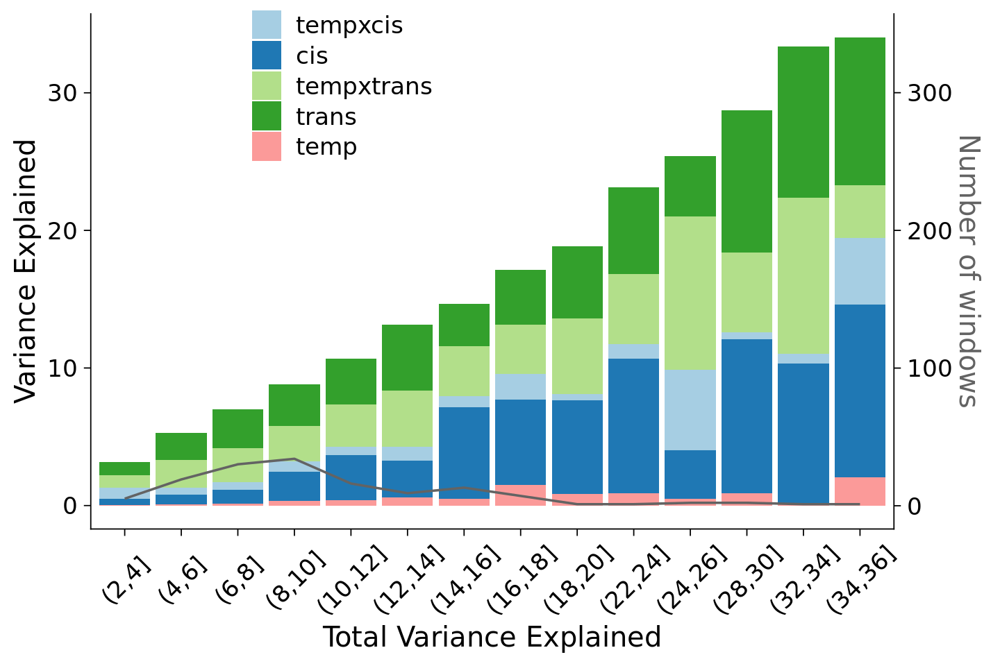

In [17]:
# %>% filter(grepl("Chr2", rownames(finalMatrix))) 
# 
ef_data = finalMatrix %>%  mutate(gain_ss_trans = dplyr::select(., starts_with("gain_ss_qtl_")) %>% reduce(`+`)) %>% dplyr::select(starts_with("gain_ss_")) %>% dplyr::select( !starts_with("gain_ss_qtl") ) %>% rename_all(~sub("gain_ss_", "", .)) %>% mutate(totalSS = select_if(., is.numeric) %>% reduce(`+`)) %>%  mutate_if(is.numeric, list(~ .*100/totalSS)) %>% dplyr::select(-totalSS) %>% mutate( VarExp = 100 - residual) %>% mutate( fVarExp = cut(VarExp, breaks = seq(0, 44, 2) ) )

t_data = ef_data %>% group_by( fVarExp  ) %>% summarise_all(mean) %>% pivot_longer(!fVarExp, names_to = "x", values_to = "VarExp") %>% filter(!(x %in% c("residual", "VarExp")))


p1 = ggplot( aes(x = fVarExp, group = 1), data = ef_data %>% count( fVarExp )) + geom_bar(aes(y = VarExp, fill = x ), data = t_data, position="stack", stat="identity") + geom_line( aes(x = fVarExp, y = n/10 ), data = ef_data %>% count( fVarExp ), size = 1, col = "#636363" ) + scale_y_continuous( name = "Variance Explained", sec.axis = sec_axis( ~.*10, name = "Number of windows" ) ) + xlab( "Total Variance Explained" ) + theme_cowplot(12, font_size = 24) + theme( axis.text.x = element_text(angle = 45, vjust = 0.5), axis.title.y.right = element_text(color = "#636363")) + theme(legend.position = c(0.2, 0.9)) + scale_fill_manual(name = "", breaks = c("tempxcis", "cis", "tempxtrans", "trans", "temp"), values = brewer.pal(5, "Paired") )

p1

ggsave(p1, filename = "var_exp.gains.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

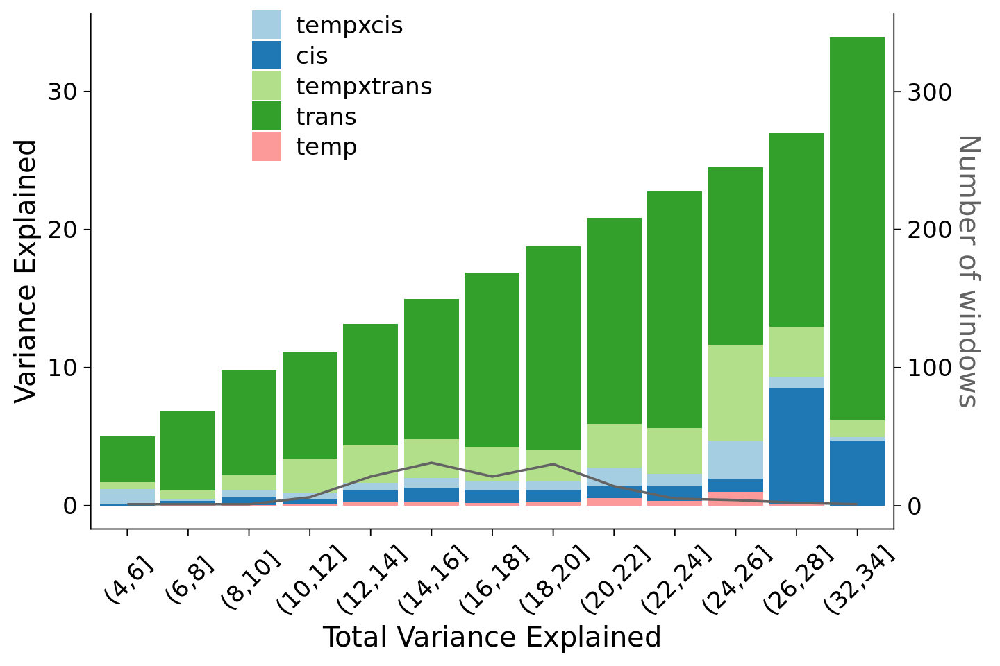

In [24]:
ef_data = finalMatrix %>%  mutate(loss_ss_trans = dplyr::select(., starts_with("loss_ss_qtl_")) %>% reduce(`+`)) %>% dplyr::select(starts_with("loss_ss_")) %>% dplyr::select( !starts_with("loss_ss_qtl") ) %>% rename_all(~sub("loss_ss_", "", .)) %>% mutate(totalSS = select_if(., is.numeric) %>% reduce(`+`)) %>%  mutate_if(is.numeric, list(~ .*100/totalSS)) %>% dplyr::select(-totalSS) %>% mutate( VarExp = 100 - residual) %>% mutate( fVarExp = cut(VarExp, breaks = seq(0, 40, 2) ) ) %>% filter(!is.na(fVarExp) )

t_data = ef_data %>% group_by( fVarExp  ) %>% summarise_all(mean) %>% pivot_longer(!fVarExp, names_to = "x", values_to = "VarExp") %>% filter(!(x %in% c("residual", "VarExp")))



p1 = ggplot( aes(x = fVarExp, group = 1), data = ef_data %>% count( fVarExp )) + geom_bar(aes(y = VarExp, fill = x ), data = t_data, position="stack", stat="identity") + geom_line( aes(x = fVarExp, y = n/10 ), data = ef_data %>% count( fVarExp ), size = 1, col = "#636363" ) + scale_y_continuous( name = "Variance Explained", sec.axis = sec_axis( ~.*10, name = "Number of windows" ) ) + xlab( "Total Variance Explained" ) + theme_cowplot(12, font_size = 24) + theme( axis.text.x = element_text(angle = 45, vjust = 0.5), axis.title.y.right = element_text(color = "#636363")) + theme(legend.position = c(0.2, 0.9)) + scale_fill_manual(name = "", breaks = c("tempxcis", "cis", "tempxtrans", "trans", "temp"), values = brewer.pal(5, "Paired") )

p1

ggsave(p1, filename = "var_exp.losses.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")


Generated phenotypes version 1



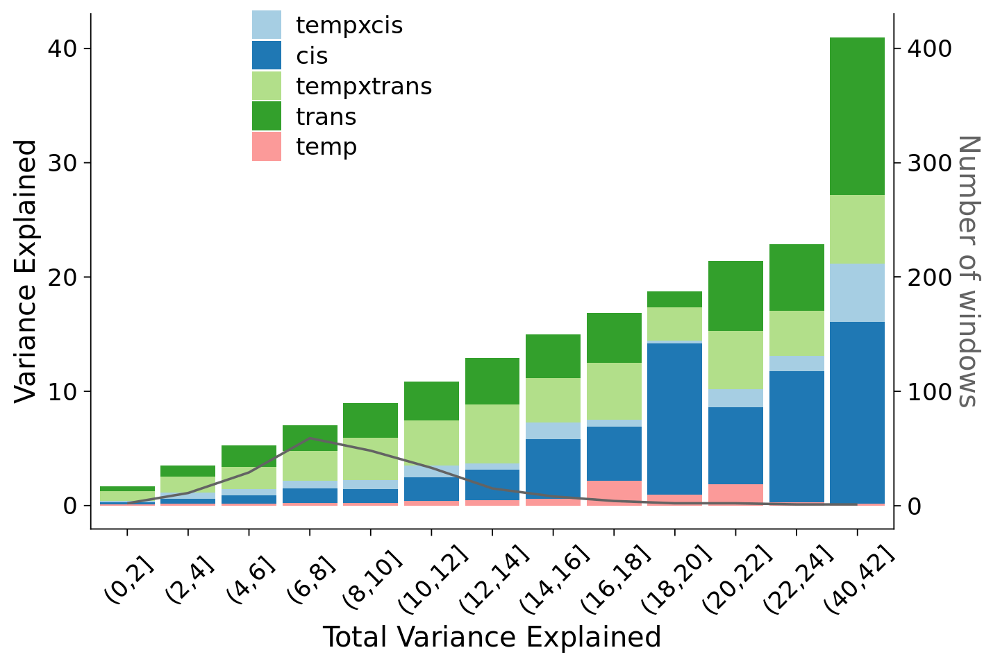

In [113]:
# %>% filter(grepl("Chr2", rownames(finalMatrix))) 
# 
ef_data = finalMatrix %>%  mutate(gain_ss_trans = dplyr::select(., starts_with("gain_ss_qtl_")) %>% reduce(`+`)) %>% dplyr::select(starts_with("gain_ss_")) %>% dplyr::select( !starts_with("gain_ss_qtl") ) %>% rename_all(~sub("gain_ss_", "", .)) %>% mutate(totalSS = select_if(., is.numeric) %>% reduce(`+`)) %>%  mutate_if(is.numeric, list(~ .*100/totalSS)) %>% dplyr::select(-totalSS) %>% mutate( VarExp = 100 - residual) %>% mutate( fVarExp = cut(VarExp, breaks = seq(0, 44, 2) ) )

t_data = ef_data %>% group_by( fVarExp  ) %>% summarise_all(mean) %>% pivot_longer(!fVarExp, names_to = "x", values_to = "VarExp") %>% filter(!(x %in% c("residual", "VarExp")))


p1 = ggplot( aes(x = fVarExp, group = 1), data = ef_data %>% count( fVarExp )) + geom_bar(aes(y = VarExp, fill = x ), data = t_data, position="stack", stat="identity") + geom_line( aes(x = fVarExp, y = n/10 ), data = ef_data %>% count( fVarExp ), size = 1, col = "#636363" ) + scale_y_continuous( name = "Variance Explained", sec.axis = sec_axis( ~.*10, name = "Number of windows" ) ) + xlab( "Total Variance Explained" ) + theme_cowplot(12, font_size = 24) + theme( axis.text.x = element_text(angle = 45, vjust = 0.5), axis.title.y.right = element_text(color = "#636363")) + theme(legend.position = c(0.2, 0.9)) + scale_fill_manual(name = "", breaks = c("tempxcis", "cis", "tempxtrans", "trans", "temp"), values = brewer.pal(5, "Paired") )

p1

# # # ggsave(p1, filename = "var_exp.gene.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

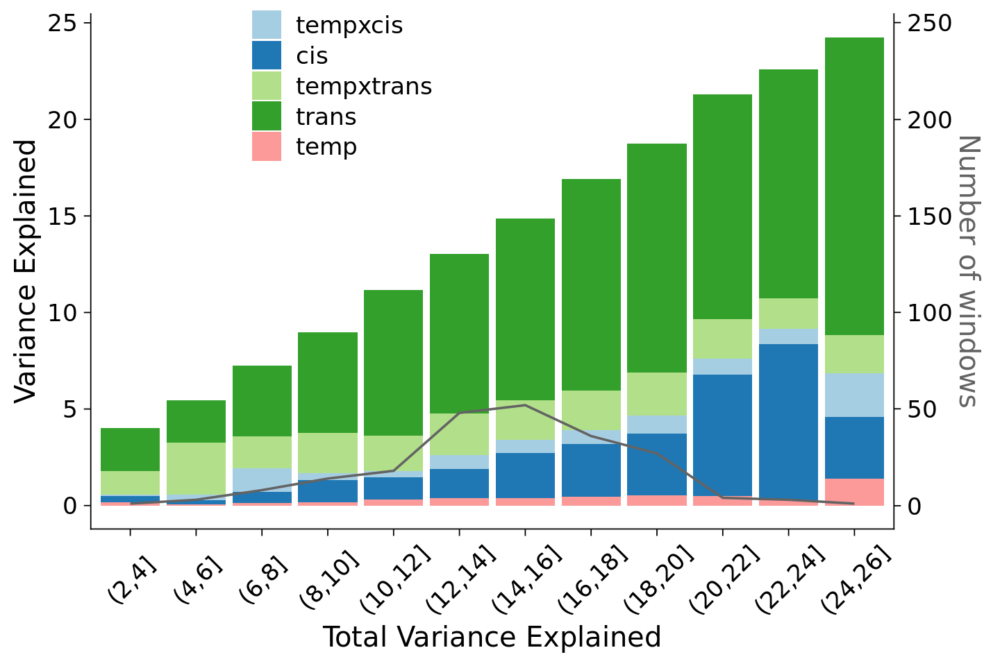

In [76]:
ef_data = finalMatrix %>%  mutate(loss_ss_trans = dplyr::select(., starts_with("loss_ss_qtl_")) %>% reduce(`+`)) %>% dplyr::select(starts_with("loss_ss_")) %>% dplyr::select( !starts_with("loss_ss_qtl") ) %>% rename_all(~sub("loss_ss_", "", .)) %>% mutate(totalSS = select_if(., is.numeric) %>% reduce(`+`)) %>%  mutate_if(is.numeric, list(~ .*100/totalSS)) %>% dplyr::select(-totalSS) %>% mutate( VarExp = 100 - residual) %>% mutate( fVarExp = cut(VarExp, breaks = seq(0, 40, 2) ) )

t_data = ef_data %>% group_by( fVarExp  ) %>% summarise_all(mean) %>% pivot_longer(!fVarExp, names_to = "x", values_to = "VarExp") %>% filter(!(x %in% c("residual", "VarExp")))



p1 = ggplot( aes(x = fVarExp, group = 1), data = ef_data %>% count( fVarExp )) + geom_bar(aes(y = VarExp, fill = x ), data = t_data, position="stack", stat="identity") + geom_line( aes(x = fVarExp, y = n/10 ), data = ef_data %>% count( fVarExp ), size = 1, col = "#636363" ) + scale_y_continuous( name = "Variance Explained", sec.axis = sec_axis( ~.*10, name = "Number of windows" ) ) + xlab( "Total Variance Explained" ) + theme_cowplot(12, font_size = 24) + theme( axis.text.x = element_text(angle = 45, vjust = 0.5), axis.title.y.right = element_text(color = "#636363")) + theme(legend.position = c(0.2, 0.9)) + scale_fill_manual(name = "", breaks = c("tempxcis", "cis", "tempxtrans", "trans", "temp"), values = brewer.pal(5, "Paired") )

p1

# # # ggsave(p1, filename = "var_exp.gene.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

What happens if you do the transformation of the phenotypes

Tried boxcox 

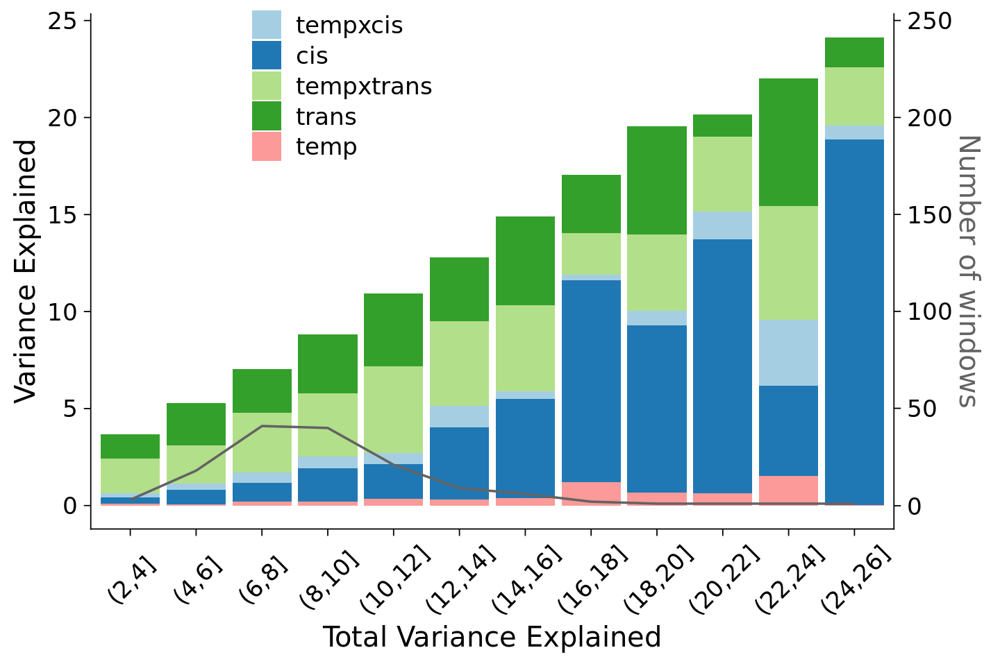

In [109]:
# %>% filter(grepl("Chr2", rownames(finalMatrix))) 
# 
ef_data = finalMatrix %>%  mutate(gain_ss_trans = dplyr::select(., starts_with("gain_ss_qtl_")) %>% reduce(`+`)) %>% dplyr::select(starts_with("gain_ss_")) %>% dplyr::select( !starts_with("gain_ss_qtl") ) %>% rename_all(~sub("gain_ss_", "", .)) %>% mutate(totalSS = select_if(., is.numeric) %>% reduce(`+`)) %>%  mutate_if(is.numeric, list(~ .*100/totalSS)) %>% dplyr::select(-totalSS) %>% mutate( VarExp = 100 - residual) %>% mutate( fVarExp = cut(VarExp, breaks = seq(0, 44, 2) ) )

t_data = ef_data %>% group_by( fVarExp  ) %>% summarise_all(mean) %>% pivot_longer(!fVarExp, names_to = "x", values_to = "VarExp") %>% filter(!(x %in% c("residual", "VarExp")))


p1 = ggplot( aes(x = fVarExp, group = 1), data = ef_data %>% count( fVarExp )) + geom_bar(aes(y = VarExp, fill = x ), data = t_data, position="stack", stat="identity") + geom_line( aes(x = fVarExp, y = n/10 ), data = ef_data %>% count( fVarExp ), size = 1, col = "#636363" ) + scale_y_continuous( name = "Variance Explained", sec.axis = sec_axis( ~.*10, name = "Number of windows" ) ) + xlab( "Total Variance Explained" ) + theme_cowplot(12, font_size = 24) + theme( axis.text.x = element_text(angle = 45, vjust = 0.5), axis.title.y.right = element_text(color = "#636363")) + theme(legend.position = c(0.2, 0.9)) + scale_fill_manual(name = "", breaks = c("tempxcis", "cis", "tempxtrans", "trans", "temp"), values = brewer.pal(5, "Paired") )

p1

# # # ggsave(p1, filename = "var_exp.gene.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

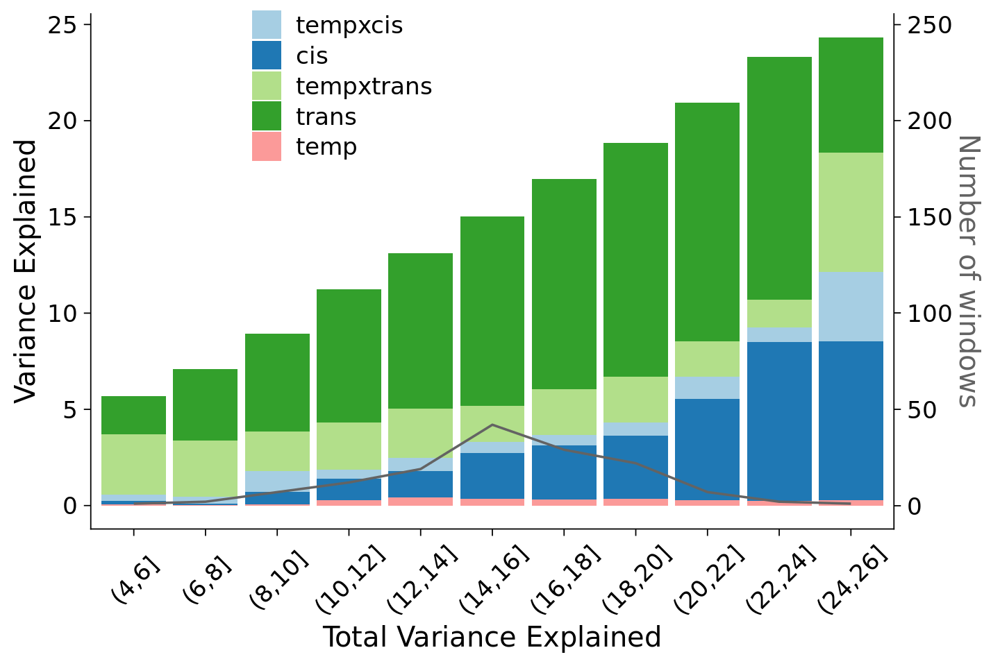

In [110]:
ef_data = finalMatrix %>%  mutate(loss_ss_trans = dplyr::select(., starts_with("loss_ss_qtl_")) %>% reduce(`+`)) %>% dplyr::select(starts_with("loss_ss_")) %>% dplyr::select( !starts_with("loss_ss_qtl") ) %>% rename_all(~sub("loss_ss_", "", .)) %>% mutate(totalSS = select_if(., is.numeric) %>% reduce(`+`)) %>%  mutate_if(is.numeric, list(~ .*100/totalSS)) %>% dplyr::select(-totalSS) %>% mutate( VarExp = 100 - residual) %>% mutate( fVarExp = cut(VarExp, breaks = seq(0, 40, 2) ) )

t_data = ef_data %>% group_by( fVarExp  ) %>% summarise_all(mean) %>% pivot_longer(!fVarExp, names_to = "x", values_to = "VarExp") %>% filter(!(x %in% c("residual", "VarExp")))



p1 = ggplot( aes(x = fVarExp, group = 1), data = ef_data %>% count( fVarExp )) + geom_bar(aes(y = VarExp, fill = x ), data = t_data, position="stack", stat="identity") + geom_line( aes(x = fVarExp, y = n/10 ), data = ef_data %>% count( fVarExp ), size = 1, col = "#636363" ) + scale_y_continuous( name = "Variance Explained", sec.axis = sec_axis( ~.*10, name = "Number of windows" ) ) + xlab( "Total Variance Explained" ) + theme_cowplot(12, font_size = 24) + theme( axis.text.x = element_text(angle = 45, vjust = 0.5), axis.title.y.right = element_text(color = "#636363")) + theme(legend.position = c(0.2, 0.9)) + scale_fill_manual(name = "", breaks = c("tempxcis", "cis", "tempxtrans", "trans", "temp"), values = brewer.pal(5, "Paired") )

p1

# # # ggsave(p1, filename = "var_exp.gene.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

## QTL effect size

In [86]:
library(qtl2)
library(rTASSEL)
library(sommer)
rTASSEL::startLogger(fullPath = "/scratch-cbe/users/rahul.pisupati/tempFiles/", fileName = "log.rtassel.txt")

TASSEL logging file created at: /scratch-cbe/users/rahul.pisupati/tempFiles//log.rtassel.txt



In [24]:
cross_genotypes[['2020.d1']] = sim.geno(cross_genotypes[['2020.d1']], step=2, n.draws=128, err=0.001)

In [99]:
# read.csv("/groups/nordborg/projects/epiclines///005.manu.crosses.2020/004.design_resolved//snps_bcftools/genotyper_final_D1_tassel.hmp.txt", sep = "\t")

In [101]:
# Load hapmap data
# convert2Plink( cross_genotypes[['2020.d1']], output_path = file.path(cross_genotypes[['2020.d1.fol']], "cross1_6191x6046.plink") )
# convert2HMP( cross_genotypes[['2020.d1']], output_path = file.path(cross_genotypes[['2020.d1.fol']], "snps_bcftools/genotyper_final_D1_tassel") )

tasFile = file.path(cross_genotypes[['2020.d1.fol']], "snps_bcftools/genotyper_final_D1_tassel.hmp.txt")
tasGenoHMP <- rTASSEL::readGenotypeTableFromPath(path =  tasFile)
# tasGenoHMPkin = rTASSEL::kinshipToRMatrix(rTASSEL::kinshipMatrix(tasObj = tasGenoHMP))

ERROR: Error in .jcall("RJavaTools", "Ljava/lang/Object;", "invokeMethod", cl, : java.lang.IllegalStateException: ImportUtils: read: nothing was loaded for: /groups/nordborg/projects/epiclines///005.manu.crosses.2020/004.design_resolved//snps_bcftools/genotyper_final_D1_tassel.hmp.txt


In [102]:

# qtls = find.markerpos(cross_genotypes[['2020.d1']], c("Chr1:5038757", "Chr5:15932197") )

qtls = find.markerpos(cross_genotypes[['2020.d1']], c("Chr1:21740818", "Chr4:5929511", "Chr5:16492132") )
# Chr5:16445720
# Chr5:16426615



In [78]:
pheno.col = "deviation_1_nonpoly:Chr5,26500001,26975502"
covar = cbind(cross_genotypes[['2020.d1']]$pheno[,c('temp')])
qtl = makeqtl( cross_genotypes[['2020.d1']], chr = qtls$chr, pos = qtls$pos  )
# qtl = refineqtl(cross_genotypes[['2020.d1']], qtl=qtl, pheno.col = pheno.col, formula=y~Q1+Q2+Q3, verbose=FALSE)
out.fq = fitqtl(cross_genotypes[['2020.d1']], qtl =  qtl, pheno.col = pheno.col , formula = y~Q1+Q2+Q3, covar = covar )

print(summary(out.fq))

print(addint(cross_genotypes[['2020.d1']], pheno.col = pheno.col, qtl=qtl, formula=y~Q1+Q2+Q3, covar = covar  ))

# 

# out.fq = fitqtl(cross_genotypes[['2020.d1']], qtl =  qtl, pheno.col = "deviation_0_nonpoly:Chr5,26500001,26975502", formula = y~Q1+Q2+Q1*Q2 )


		fitqtl summary

Method: multiple imputation 
Model:  normal phenotype
Number of observations : 308 

Full model result
----------------------------------  
Model formula: y ~ Q1 + Q2 + Q3 

       df          SS           MS      LOD     %var Pvalue(Chi2)   Pvalue(F)
Model   6 0.008032608 0.0013387680 5.762741 8.255592 0.0001766672 0.000212746
Error 301 0.089266386 0.0002965661                                           
Total 307 0.097298995                                                        


Drop one QTL at a time ANOVA table: 
----------------------------------  
       df Type III SS    LOD   %var F value Pvalue(Chi2) Pvalue(F)    
1@64.4  2   0.0005733 0.4282 0.5892  0.9666        0.373  0.381563    
4@23.5  2   0.0055008 3.9994 5.6535  9.2741        0.000  0.000123 ***
5@61.3  2   0.0018880 1.3998 1.9404  3.1831        0.040  0.042858 *  
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Method: multiple imputation 
Model:  normal phenotype
Model formula

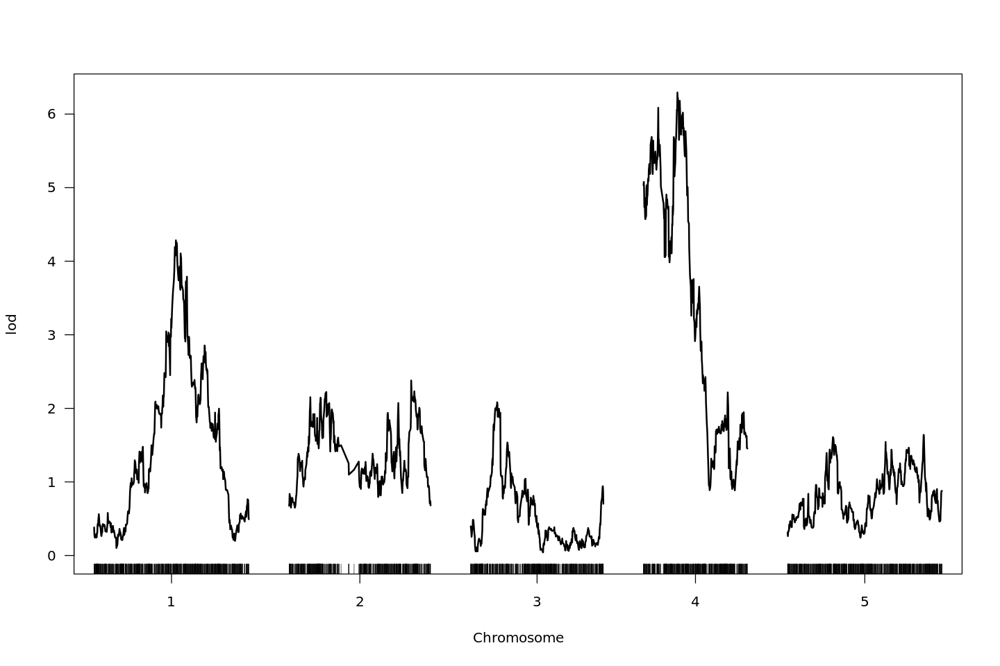

In [79]:
plot(scanone(cross_genotypes[['2020.d1']], pheno.col = pheno.col, intcovar = covar ) )

In [80]:
summary(addqtl(cross_genotypes[['2020.d1']], pheno.col = pheno.col, qtl=qtl, formula = y ~Q1+Q2+Q3  ))

,chr,pos,lod
,<fct>,<dbl>,<dbl>
Chr1:17553868,1,53.79174,1.442382
Chr2:18583041,2,83.00950,1.419945
Chr3:9051455,3,33.71323,1.430109
Chr4:14680054,4,52.35578,1.476129
Chr5:16426615,5,60.62695,4.699644


In [103]:
library(qtlbim)

In [105]:
t.cross = qb.genoprob(cross_genotypes[['2020.d1']], step = 2)

In [107]:
plot(qb.mcmc(t.cross, pheno.col = pheno.col ))

qb.mcmc is running 60,600 iterations. The current iterations are saved: 
200
400
600
800
1000
1200
1400
1600
1800
2000
2200
2400
2600
2800
3000
MCMC sample has been saved to: ./deviation_1_nonpoly:Chr5,26500001,26975502_Jul-29-173220.
Bayesian MCMC took 0.74 minutes. 


ERROR: Error in UseMethod("clean"): no applicable method for 'clean' applied to an object of class "c('f2', 'cross')"


In [83]:
stepwiseqtl(cross_genotypes[['2020.d1']], pheno.col = pheno.col, covar = covar, additive.only=TRUE, max.qtl=6, verbose=FALSE)

  QTL object containing imputed genotypes, with 128 imputations. 

     name chr    pos n.gen
Q1 4@21.1   4 21.059     3

  Formula: y ~ V1 + Q1 

  pLOD:  1.818 

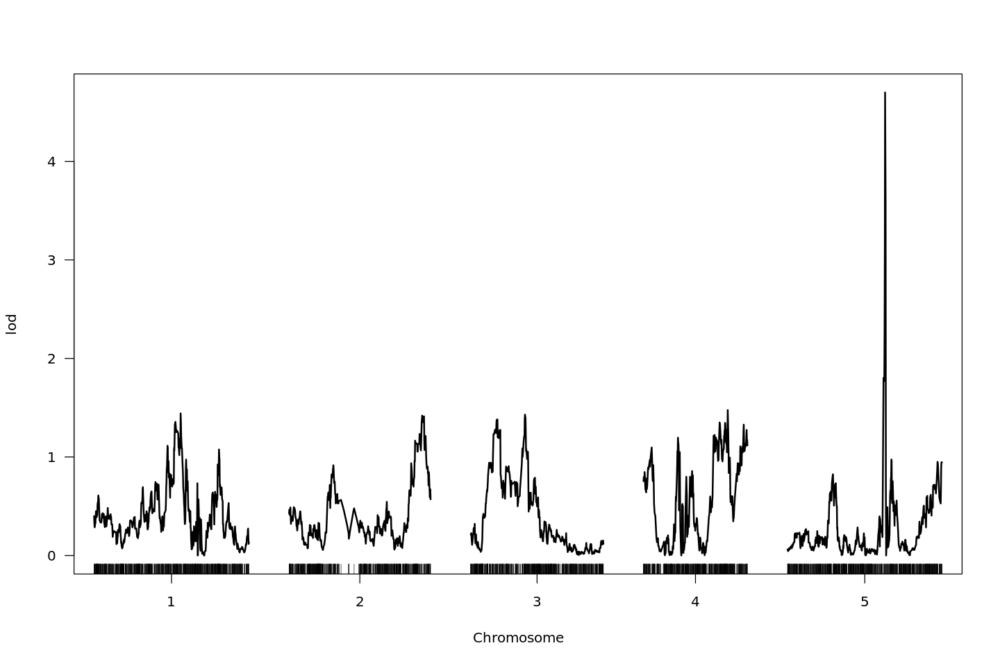

In [81]:
plot( addqtl(cross_genotypes[['2020.d1']], pheno.col = pheno.col, qtl=qtl, formula = y ~Q1+Q2+Q3  ) )

In [34]:
summary(out.fqfq)


		fitqtl summary

Method: multiple imputation 
Model:  normal phenotype
Number of observations : 308 

Full model result
----------------------------------  
Model formula: y ~ Q1 + Q2 + Q1:Q2 

       df           SS           MS      LOD     %var Pvalue(Chi2) Pvalue(F)
Model   8 5.444827e-06 6.806033e-07 2.872856 4.204503    0.1041776 0.1128359
Error 299 1.240550e-04 4.148998e-07                                         
Total 307 1.294999e-04                                                      


Drop one QTL at a time ANOVA table: 
----------------------------------  
              df Type III SS   LOD  %var F value Pvalue(Chi2) Pvalue(F)  
1@16.1         6   4.842e-06 2.561 3.739   1.945        0.067    0.0734 .
5@57.4         6   4.248e-06 2.252 3.280   1.706        0.110    0.1191  
1@16.1:5@57.4  4   3.345e-06 1.780 2.583   2.016        0.085    0.0922 .
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


## Mapping deviations from hemi-methylated cytosines

In [69]:
ef_rates = read_csv( "cache_data/epimutation_rates_hemimeths_chr3_2mb.csv" )
ef_rates = create_rqtl_phenos(cross_genotypes[["2020.d1"]], ef_rates %>% column_to_rownames("X1") %>% rownames_to_column("id") )


── Column specification ────────────────────────────────────────────────────────
cols(
  X1 = col_character(),
  subpop = col_character(),
  deviation_0 = col_double(),
  deviation_1 = col_double(),
  mc_total_0 = col_double(),
  mc_total_1 = col_double(),
  cell_deviation_0 = col_double(),
  cell_deviation_1 = col_double(),
  read_total_0 = col_double(),
  read_total_1 = col_double(),
  deviation_hemi = col_double(),
  conv_rate = col_double(),
  resid_hemi = col_double()
)




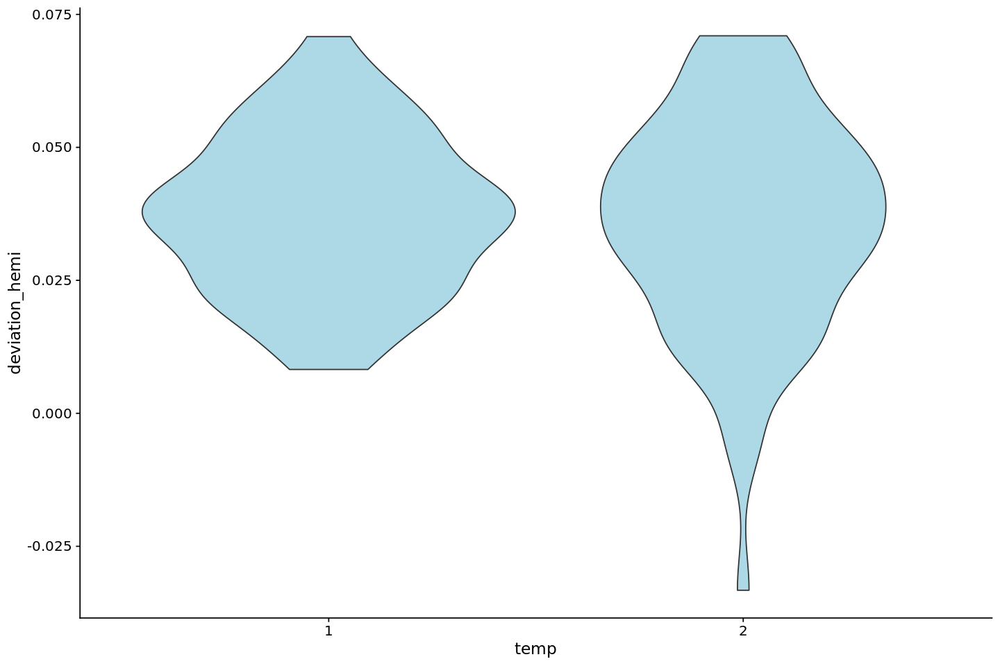

In [81]:
left_join(cross_genotypes[['2020.d1']]$pheno, ef_rates, by = "id") %>% ggplot( aes(x = temp, y = deviation_hemi ) ) + geom_violin(fill = "lightblue") + theme_cowplot()

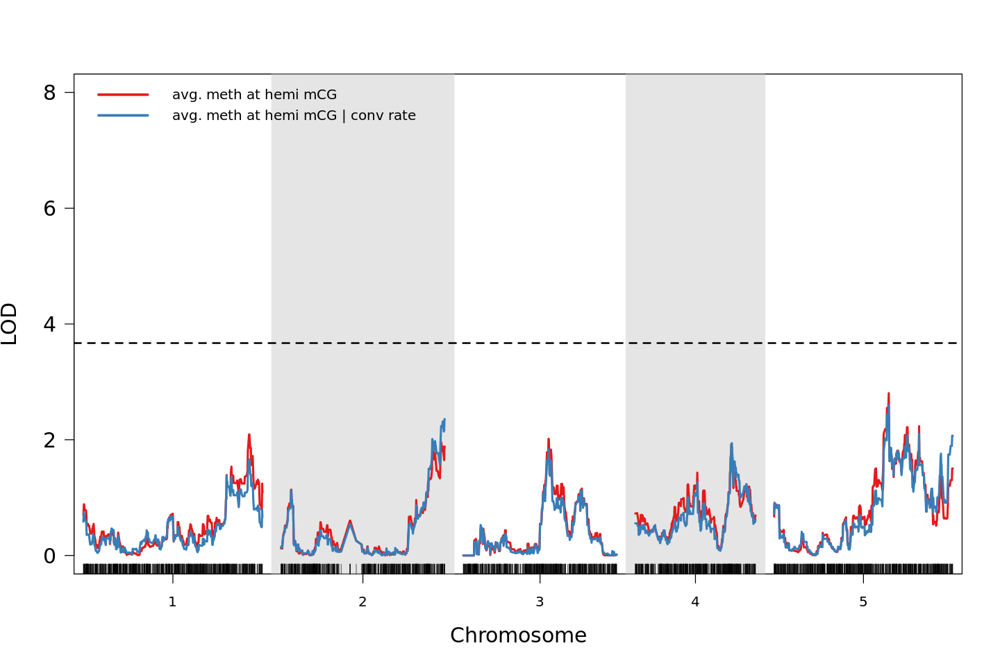

In [71]:
ef_model_1 = scanone( cross_genotypes[['2020.d1']], pheno.col = ef_rates$deviation_hemi, addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
ef_model_2 = scanone( cross_genotypes[['2020.d1']], pheno.col = ef_rates$resid_hemi, addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )

plot_qtl_map(x = ef_model_1, x2 = ef_model_2, ylim = c(0, 8), main = paste(""), col = c("#e41a1c", "#377eb8"), lwd = 2.5   )
legend("topleft", legend=c("avg. meth at hemi mCG", "avg. meth at hemi mCG | conv rate"), col=c("#e41a1c", "#377eb8"), lty = 1, lwd = 3, cex=1, box.lty=0, bg=NA)

abline( h = 3.67, lwd = 2, lty = 2 )

### Genome wide mapping for epimutation rates

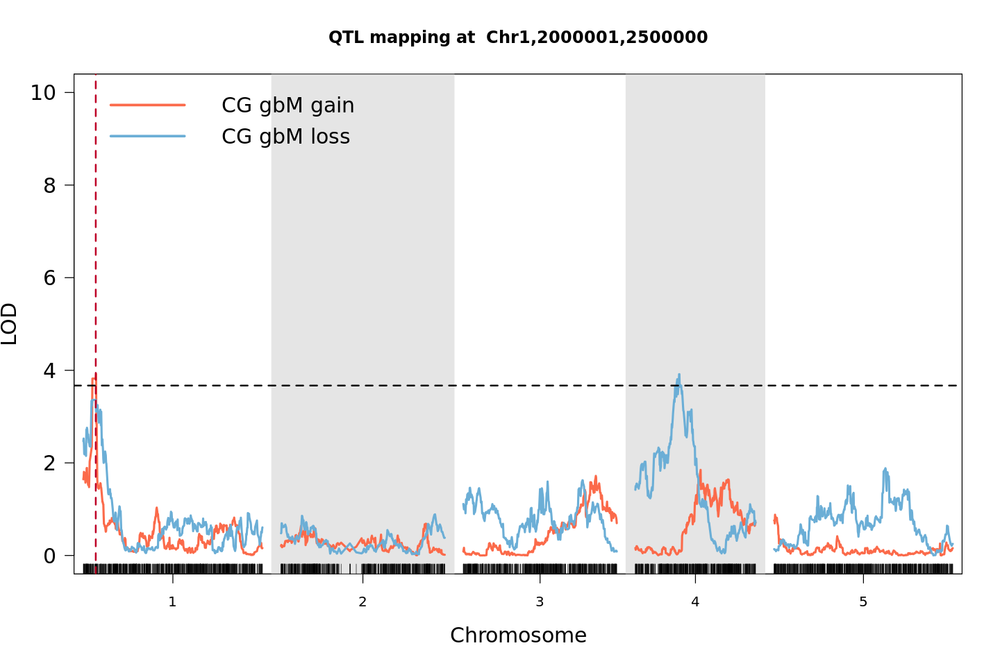

In [16]:
ef_ix = 5
ef_bed_str = str_replace(colnames(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("deviation_0")))[ef_ix], "deviation_0:", "")

ef_model_1 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("deviation_0:", ef_bed_str), addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
ef_model_2 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("deviation_1:", ef_bed_str), addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )


# ef_cis_model = lm(pull(cross_genotypes[['2020.d1']]$pheno, paste0("cell_deviation_0:", ef_bed_str)) ~  cbind(as.numeric(genotype_at_gene_str(cross_genotypes[['2020.d1']], ef_bed_str) == 1), genotype_at_gene_str(cross_genotypes[['2020.d1']], ef_bed_str) == 2, genotype_at_gene_str(cross_genotypes[['2020.d1']], ef_bed_str) == 3) , na.action=na.exclude  )
# ef_cis_resid = rep(NA, dim(cross_genotypes[['2020.d1']]$pheno)[1])
# ef_cis_resid[as.numeric(names(ef_cis_model$residuals))] = as.numeric(ef_cis_model$residuals)
# ef_model_3 = scanone( cross_genotypes[['2020.d1']], pheno.col = ef_cis_resid, addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )

# plot_qtl_map(x = ef_model_1, x2 = ef_model_2, x3 = ef_model_3, ylim = c(0, 10), gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], ef_bed_str), main = paste("QTL mapping at ", ef_bed_str), col = c(brewer.pal(4, "Reds")[3], brewer.pal(4, "Blues")[3], "#bdbdbd"), lwd = 2.5 )



plot_qtl_map(x = ef_model_1, x2 = ef_model_2, ylim = c(0, 10), gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], ef_bed_str), main = paste("QTL mapping at ", ef_bed_str), col = c(brewer.pal(4, "Reds")[3], brewer.pal(4, "Blues")[3]), lwd = 2.5 )
abline( h = 3.67, lwd = 2, lty = 2 )
legend("topleft", legend = c("CG gbM gain", "CG gbM loss"), col = c(brewer.pal(4, "Reds")[3], brewer.pal(4, "Blues")[3]), lty = 1, lwd = 3, cex=1.5, box.lty=0, bg=NA )

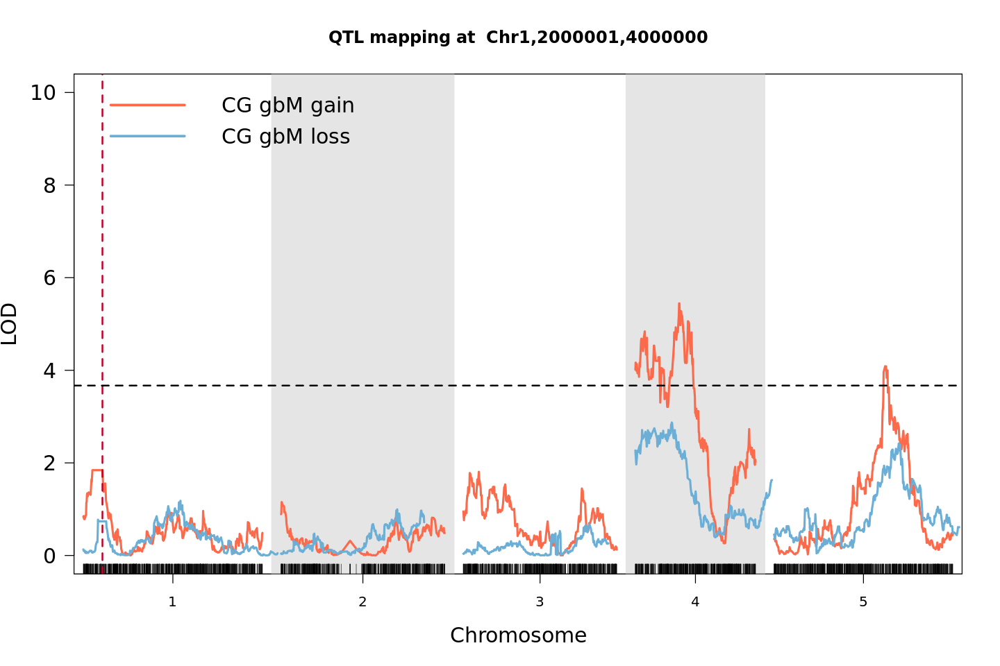

In [276]:
ef_ix = 2
ef_bed_str = str_replace(colnames(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("cell_deviation_0")))[ef_ix], "cell_deviation_0:", "")

ef_model_1 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("cell_deviation_1:", ef_bed_str), addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
ef_model_2 = scanone( cross_genotypes[['2020.d2']], pheno.col = paste0("cell_deviation_1:", ef_bed_str), addcovar = as.numeric(cross_genotypes[['2020.d2']]$pheno$temp) )


# ef_cis_model = lm(pull(cross_genotypes[['2020.d1']]$pheno, paste0("cell_deviation_0:", ef_bed_str)) ~  cbind(as.numeric(genotype_at_gene_str(cross_genotypes[['2020.d1']], ef_bed_str) == 1), genotype_at_gene_str(cross_genotypes[['2020.d1']], ef_bed_str) == 2, genotype_at_gene_str(cross_genotypes[['2020.d1']], ef_bed_str) == 3) , na.action=na.exclude  )
# ef_cis_resid = rep(NA, dim(cross_genotypes[['2020.d1']]$pheno)[1])
# ef_cis_resid[as.numeric(names(ef_cis_model$residuals))] = as.numeric(ef_cis_model$residuals)
# ef_model_3 = scanone( cross_genotypes[['2020.d1']], pheno.col = ef_cis_resid, addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )

# plot_qtl_map(x = ef_model_1, x2 = ef_model_2, x3 = ef_model_3, ylim = c(0, 10), gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], ef_bed_str), main = paste("QTL mapping at ", ef_bed_str), col = c(brewer.pal(4, "Reds")[3], brewer.pal(4, "Blues")[3], "#bdbdbd"), lwd = 2.5 )



plot_qtl_map(x = ef_model_1, x2 = ef_model_2, ylim = c(0, 10), gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], ef_bed_str), main = paste("QTL mapping at ", ef_bed_str), col = c(brewer.pal(4, "Reds")[3], brewer.pal(4, "Blues")[3]), lwd = 2.5 )
abline( h = 3.67, lwd = 2, lty = 2 )
legend("topleft", legend = c("CG gbM gain", "CG gbM loss"), col = c(brewer.pal(4, "Reds")[3], brewer.pal(4, "Blues")[3]), lty = 1, lwd = 3, cex=1.5, box.lty=0, bg=NA )

In [270]:
summary(scanone(cross_genotypes[['2020.d1']], pheno.col = paste0("cell_deviation_0:", ef_bed_str), n.perm = 100 ) , alpha=0.05)

Permutation 5 
Permutation 10 
Permutation 15 
Permutation 20 
Permutation 25 
Permutation 30 
Permutation 35 
Permutation 40 
Permutation 45 
Permutation 50 
Permutation 55 
Permutation 60 
Permutation 65 
Permutation 70 
Permutation 75 
Permutation 80 
Permutation 85 
Permutation 90 
Permutation 95 
Permutation 100 


LOD thresholds (100 permutations)
    lod
5% 3.57

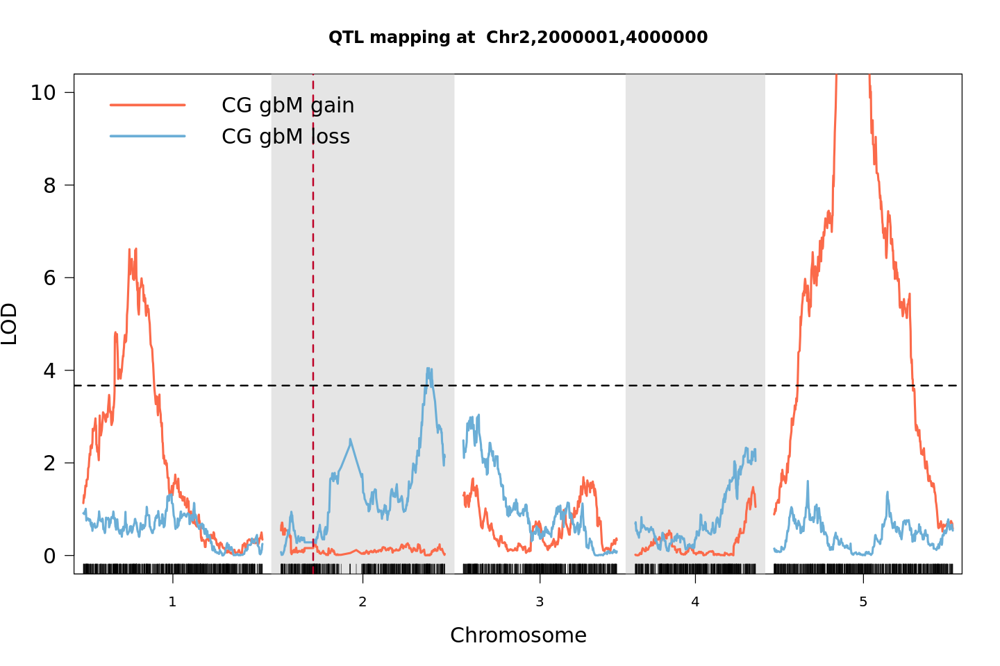

In [269]:
ef_ix = 17
ef_bed_str = str_replace(colnames(cross_genotypes[['2020.d1']]$pheno %>% dplyr::select(starts_with("cell_deviation_0")))[ef_ix], "cell_deviation_0:", "")

ef_model_1 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("cell_deviation_0:", ef_bed_str), addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
ef_model_2 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("cell_deviation_1:", ef_bed_str), addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )
# ef_model_3 = scanone( cross_genotypes[['2020.d1']], pheno.col = paste0("cell_deviation_0:", ef_bed_str) )#, addcovar = as.numeric(cross_genotypes[['2020.d1']]$pheno$temp) )


plot_qtl_map(x = ef_model_1, x2 = ef_model_2, ylim = c(0, 10), gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], ef_bed_str), main = paste("QTL mapping at ", ef_bed_str), col = c(brewer.pal(4, "Reds")[3], brewer.pal(4, "Blues")[3]), lwd = 2.5 )
# plot_qtl_map(x = ef_model_1, x2 = ef_model_2, x3 = ef_model_3, ylim = c(0, 10), gene_str_marker = get_closest_marker(cross_genotypes[['2020.d1']], ef_bed_str), main = paste("QTL mapping at ", ef_bed_str), col = c(brewer.pal(4, "Reds")[3], brewer.pal(4, "Blues")[3], "green"), lwd = 2.5 )
abline( h = 3.67, lwd = 2, lty = 2 )
legend("topleft", legend = c("CG gbM gain", "CG gbM loss"), col = c(brewer.pal(4, "Reds")[3], brewer.pal(4, "Blues")[3]), lty = 1, lwd = 3, cex=1.5, box.lty=0, bg=NA )

In [31]:
epiRqtl::find_qtls_from_scanoutput( geno_unified = cross_genotypes[['2020.d1']], qtl_result = model_demeth )

GRanges object with 2 ranges and 5 metadata columns:
      seqnames            ranges strand |        marker            l_lod
         <Rle>         <IRanges>  <Rle> |   <character>        <numeric>
  [1]     Chr4   5143186-7077276      * |  Chr4:6013202 4.34383681968524
  [2]     Chr5 15554043-19175842      * | Chr5:16445720 2.58746092104184
                   lod            r_lod     width
             <numeric>        <numeric> <integer>
  [1] 6.12961359672215  4.2828490646728   1934091
  [2]  4.3898305420995 2.67031153542945   3621800
  -------
  seqinfo: 5 sequences from an unspecified genome; no seqlengths

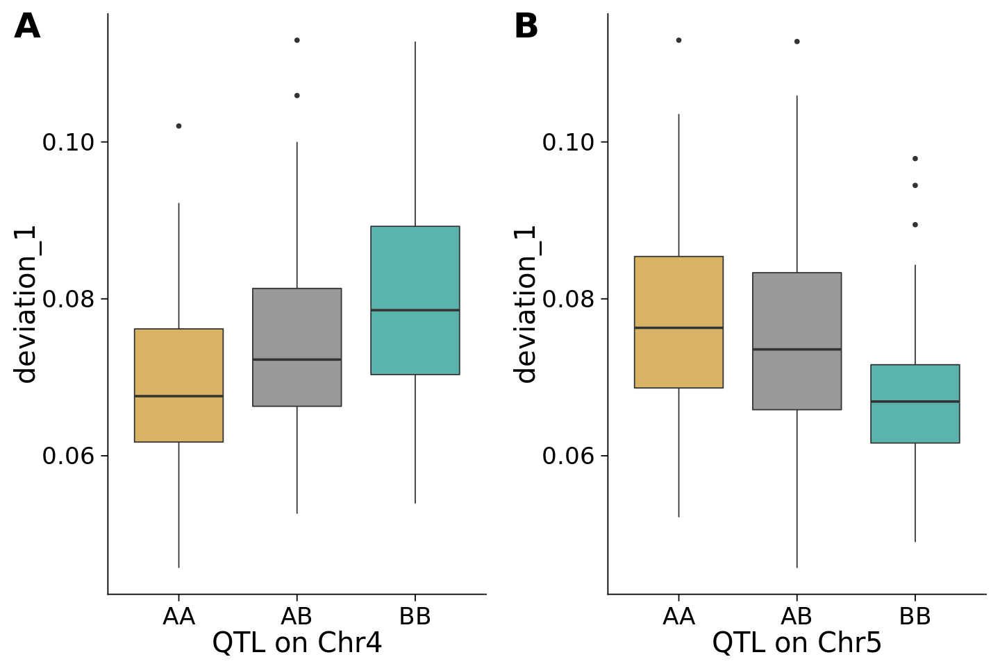

In [129]:
p1 = epimutation_rates %>% mutate("qtl_4" = genotype_at_gene_str(geno_unified = cross_genotypes[['2020.d1']], "Chr4,6013202")) %>% mutate("qtl_4" = factor(qtl_4,labels = c("AA","AB","BB") )) %>% ggplot( aes(x = qtl_4, y = deviation_1, fill = qtl_4 ) ) + geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(name = "QTL_4", values = c("AA" = colors.f2.alleles[1], "AB" = colors.f2.alleles[2], "BB" = colors.f2.alleles[3]) ) +  theme(legend.position = "none") + xlab("QTL on Chr4")


p2 = epimutation_rates %>% mutate("qtl_5" = genotype_at_gene_str(geno_unified = cross_genotypes[['2020.d1']], "Chr5,16445720")) %>% mutate("qtl_5" = factor(qtl_5,labels = c("AA","AB","BB") )) %>% ggplot( aes(x = qtl_5, y = deviation_1, fill = qtl_5 ) ) + geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(name = "QTL_5", values = c("AA" = colors.f2.alleles[1], "AB" = colors.f2.alleles[2], "BB" = colors.f2.alleles[3]) ) +  theme(legend.position = "none") + xlab("QTL on Chr5")


# p3 <- ~effectplot(cross = cross_genotypes[['2020.d1']], pheno.col = epimutation_rates, mname1 = 'Chr4:6013202', mname2 = 'Chr5:16445720' )


p4 = plot_grid(p1, p2, labels = c("A", "B"), nrow = 1, label_size = 30)

# ggsave(p3, filename = "var_exp.gene.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

p4
# dev.off()

## mC vs batch effects?

How stable is gbM?


As shown by Dubin _et al._ 2015, mCG (gbM) is not much affected by temperature.

(need a citation/literature on direction effecing gbM)

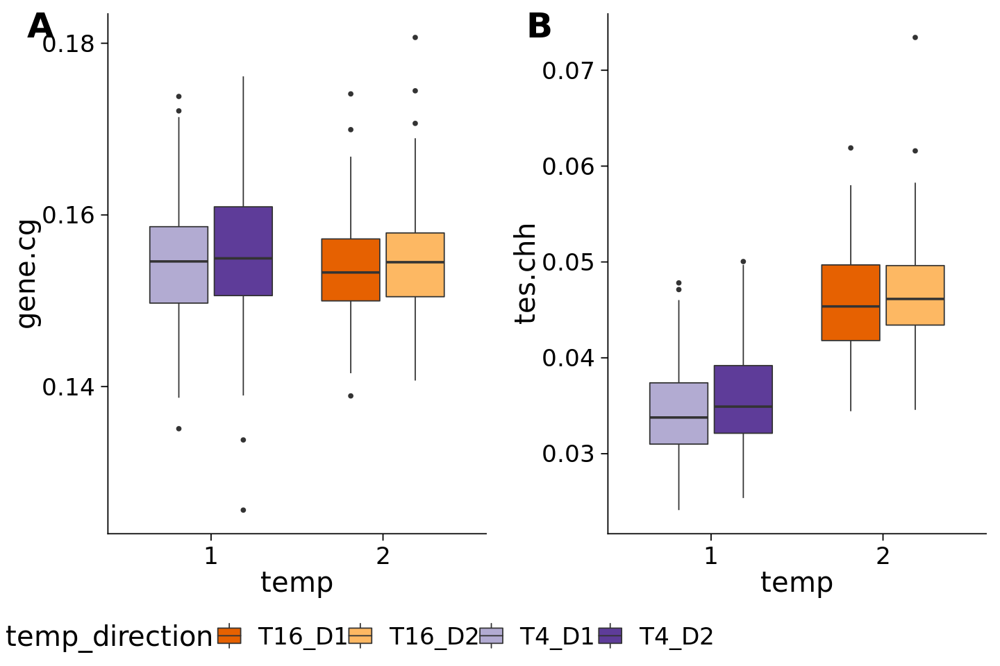

In [58]:
p1 = cross_genotypes[['pheno']] %>% mutate_at("gene.cg", invLogit) %>% mutate_at("temp", as.factor) %>% mutate(temp_direction = fct_relevel(temp_direction, c("T16_D1", "T16_D2", "T4_D1", "T4_D2"))) %>% ggplot(aes(x = temp, y = gene.cg, fill = temp_direction)) +  geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(values= brewer.pal(4, "PuOr") )

legend <- get_legend(
  # create some space to the left of the legend
  p1 + guides(color = guide_legend(nrow = 2)) + theme(legend.position = "bottom", legend.box.margin = margin(0, 0, 0, 5)) 
#     
) 

p2 = cross_genotypes[['pheno']] %>% mutate_at("tes.chh", invLogit) %>% mutate_at("temp", as.factor) %>% mutate(temp_direction = fct_relevel(temp_direction, c("T16_D1", "T16_D2", "T4_D1", "T4_D2"))) %>% ggplot(aes(x = temp, y = tes.chh, fill = temp_direction)) +  geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(values= brewer.pal(4, "PuOr") )


prow <- plot_grid(
  p1 + theme(legend.position="none"),
  p2 + theme(legend.position="none"),
  align = 'vh',
  labels = c("A", "B"),
  label_size = 30,
  hjust = -1,
  nrow = 1
)


p_all = plot_grid(prow, legend, ncol = 1, rel_widths = c(1, 2), rel_heights = c(1, 0.1))

ggsave(p_all, filename = "plates_tempdirection.pdf", device = cairo_pdf, width = 12, height = 8, units = "in")
p_all

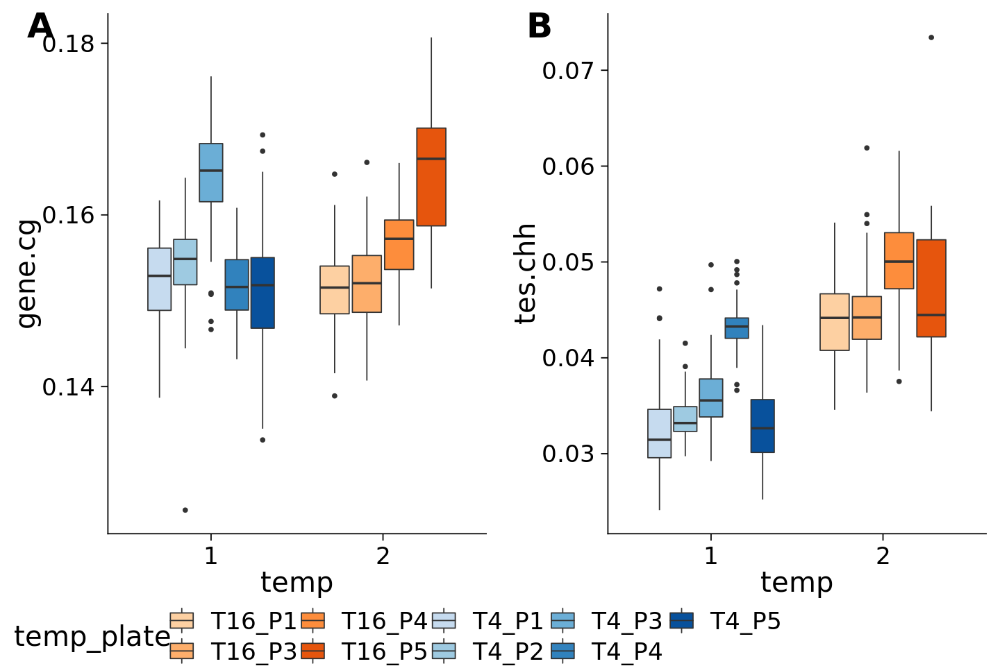

In [59]:
# png("plates_tempdirection.png", height = 800, width = 1600)

p1 = cross_genotypes[['pheno']] %>% mutate_at("gene.cg", invLogit) %>% mutate_at("temp", as.factor) %>% mutate(temp_direction = fct_relevel(temp_direction, c("T16_D1", "T16_D2", "T4_D1", "T4_D2"))) %>% ggplot(aes(x = temp, y = gene.cg, fill = temp_plate)) +  geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(values= c(brewer.pal(6, "Oranges")[2:5], brewer.pal(6, "Blues")[2:6] ) )

legend <- get_legend(
  # create some space to the left of the legend
  p1 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom", legend.box.margin = margin(0, 0, 0, 12)) 
#     
) 

p2 = cross_genotypes[['pheno']] %>% mutate_at("tes.chh", invLogit) %>% mutate_at("temp", as.factor) %>% mutate(temp_direction = fct_relevel(temp_direction, c("T16_D1", "T16_D2", "T4_D1", "T4_D2"))) %>% ggplot(aes(x = temp, y = tes.chh, fill = temp_plate)) +  geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(values= c(brewer.pal(6, "Oranges")[2:5], brewer.pal(6, "Blues")[2:6] ) )


prow <- plot_grid(
  p1 + theme(legend.position="none"),
  p2 + theme(legend.position="none"),
  align = 'vh',
  labels = c("A", "B"),
  label_size = 30,
  hjust = -1,
  nrow = 1
)


plot_grid(prow, legend, ncol = 1, rel_widths = c(1, 2), rel_heights = c(1, 0.1))

# dev.off()

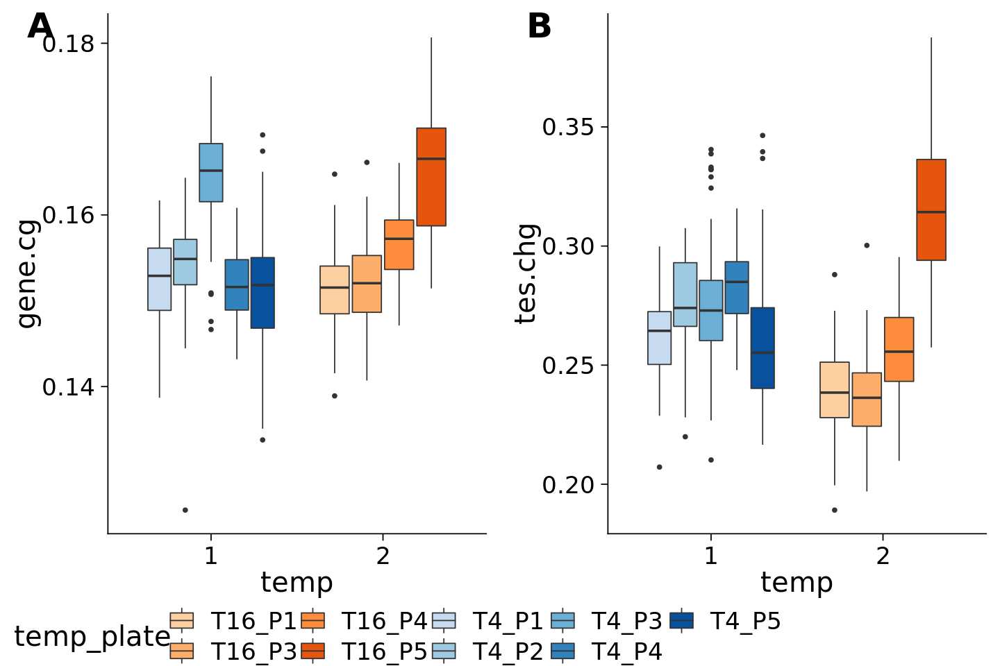

In [60]:
# png("plates_tempdirection.png", height = 800, width = 1600)

p1 = cross_genotypes[['pheno']] %>% mutate_at("gene.cg", invLogit) %>% mutate_at("temp", as.factor) %>% mutate(temp_direction = fct_relevel(temp_direction, c("T16_D1", "T16_D2", "T4_D1", "T4_D2"))) %>% ggplot(aes(x = temp, y = gene.cg, fill = temp_plate)) +  geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(values= c(brewer.pal(6, "Oranges")[2:5], brewer.pal(6, "Blues")[2:6] ) )

legend <- get_legend(
  # create some space to the left of the legend
  p1 + guides(color = guide_legend(nrow = 1)) + theme(legend.position = "bottom", legend.box.margin = margin(0, 0, 0, 12)) 
#     
) 

p2 = cross_genotypes[['pheno']] %>% mutate_at("tes.chg", invLogit) %>% mutate_at("temp", as.factor) %>% mutate(temp_direction = fct_relevel(temp_direction, c("T16_D1", "T16_D2", "T4_D1", "T4_D2"))) %>% ggplot(aes(x = temp, y = tes.chg, fill = temp_plate)) +  geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(values= c(brewer.pal(6, "Oranges")[2:5], brewer.pal(6, "Blues")[2:6] ) )


prow <- plot_grid(
  p1 + theme(legend.position="none"),
  p2 + theme(legend.position="none"),
  align = 'vh',
  labels = c("A", "B"),
  label_size = 30,
  hjust = -1,
  nrow = 1
)


plot_grid(prow, legend, ncol = 1, rel_widths = c(1, 2), rel_heights = c(1, 0.1))

# dev.off()

Very little direction effect and so we disregard this from here on .

Make plates are 1 till 6

## Effect of environment and epigenetic inheritance (_cis_) 


try to fit parental values

check 
GO
Chromosomal position
Chromatin state (or nonCG methylation)


$$ y = G_{cis} + T + P  + \epsilon $$

In [1]:
# Remove zeroes and ones for beta regression
transform_beta <- function(x, s=0.5){
  (x * (length(x)-1) + s) / length(x)
}

In [10]:
# tic()
# cl <- makeCluster(16, type="SOCK")
# registerDoSNOW(cl)
# finalMatrix <- foreach(ef_gene=req.gene.str, .combine=rbind, .packages = c("tidyverse", "car") ) %dopar% {
#     ef_cis_marker = paste0("marker", pull(req.gene.str.cis.marker %>% filter( gene_str == ef_gene ), "marker_ix") )
#     ef_pheno = pull(phenos_df, ef_gene)
#     ef_pheno_df = cross_genotypes[['pheno']] %>% dplyr::select( c(ef_cis_marker, "direction", "temp", "plate") ) %>% dplyr::rename(marker = ef_cis_marker) %>% mutate("ef_pheno" = logit(ef_pheno)) %>% filter( is.finite(ef_pheno) )
#     ef_sd = sd(ef_pheno_df[,'ef_pheno'], na.rm = T )

#     if(nrow(ef_pheno_df) >= 200 & ef_sd > 0.01){
#         ef_gene_stats = tryCatch({
#             ef_model = lm( "ef_pheno ~ marker * temp", data = ef_pheno_df %>% filter(direction == 1) )
#             ef_pheno_to_predict = ef_pheno_df %>% filter(direction == 2)
#             ef_err = as.numeric( predict( ef_model, ef_pheno_to_predict, type = "response" ) )
#             ef_model_anova = Anova(ef_model, type = "III" )
#             ef_rsquared = cor.test(pull(ef_pheno_to_predict, 'ef_pheno'), ef_err )
#             ef_factors = c("(Intercept)", 'markerAB', 'markerBB', "temp2")
#             ef_model_summary = as.data.frame(summary(ef_model)$coef)
#             ef_model_summary = TukeyHSD(aov(ef_model))
#         #     ef_cis_ci = as.data.frame(ef_model_summary$marker)[c("AB-AA", "BB-AB", "BB-AA"),"diff"]
#             ef_cis_ci = as.numeric(as.data.frame(ef_model_summary$marker)["BB-AA",c("lwr", "diff", "upr")])
#             ef_temp_ci = as.numeric(as.data.frame(ef_model_summary$temp)["2-1",c("lwr", "diff", "upr")])
#             ef_homo_temp = as.data.frame(ef_model_summary$`marker:temp`)[c("AA:2-AA:1", "BB:2-BB:1"), "diff"]
#             ef_anova_ss = ef_model_anova[c("marker", "temp", "marker:temp", "Residuals"),'Sum Sq']
#             ef_anova_ss = c(ef_anova_ss, ef_model_anova[c("marker", "temp", "marker:temp"),"Pr(>F)"])

#         }, error = function(cond) { "try-error"})
#         if ( ef_gene_stats != "try-error" ){
#             c(ef_gene, ef_cis_ci, ef_homo_temp, ef_temp_ci, ef_anova_ss, as.numeric(ef_rsquared$estimate), as.numeric(ef_rsquared$p.value) ) 
#         }
#     }
# }
# stopCluster(cl) #stop cluster
# toc()
# colnames(finalMatrix) = c("gene_str", paste0("eff_BB.AA_", c("lwr", "diff", "upr")), "eff_temp.AA_diff", "eff_temp.BB_diff", paste0("eff_temp_", c("lwr", "diff", "upr")), paste0("ss_", c("cis_geno", "temp", "cisxtemp", "residuals")), paste0("pval_", c("cis_geno", "temp", "cisxtemp")), "r2_predD2", "r2_pval_CorTest" )
# write.table(finalMatrix, "cache_data/araport.genes.temp.cis.effects.csv", col.names = T, row.names = F, sep = "\t", quote = F )


req.gene.env.effects = read.table( "cache_data/araport.genes.temp.cis.effects.csv", header = T, as.is = T )
# req.gene.env.effects = req.gene.env.effects %>% mutate_at(vars(starts_with("pval")), function(x){p.adjust(x, method = "bonferroni") } ) %>% mutate_at(vars(starts_with("pval")), function(x) {-log10(x)})
req.gene.env.effects = req.gene.env.effects %>% mutate_at(vars(starts_with("eff_")), function(x){ invLogit(0.5 + x) - invLogit(0.5) } )
req.gene.env.effects = req.gene.env.effects %>% mutate(totalSS = ss_temp + ss_cis_geno + ss_residuals ) %>% mutate( across(c("ss_temp", "ss_cis_geno", "ss_residuals"), .fns =  ~.*100/totalSS ))


genes.with.gbm.only = read.csv( "cache_data/araport.genes.onlygbM_crosses.csv", as.is = T)
req.gene.env.effects = req.gene.env.effects %>% filter(gene_str %in% genes.with.gbm.only[,1])

genes_h2az_chip = read.csv( "/groups/nordborg/projects/cegs//rahul/011.states.bhagyshree/003.CHIP/gene_avgs/Araport11_genes_h2az_chip_RY.bed", header = F, sep = "\t" )
genes_h2az_chip = genes_h2az_chip %>% mutate( gene_str = paste(V1, V2, V3, sep = ",") )
req.gene.env.effects = left_join(req.gene.env.effects, genes_h2az_chip %>% dplyr::rename(h2az_chip = V8) %>% dplyr::select( c("gene_str", h2az_chip) ), by = "gene_str"   )


cg_gbm_corr_lat = read.csv( "cache_data/genes.with.gbm.cline.1001g.csv", header = F )
req.gene.env.effects = left_join(req.gene.env.effects, cg_gbm_corr_lat %>% dplyr::rename(gene_str = V1, cline_corr = V2), by = "gene_str"  )


req.gene.env.effects = req.gene.env.effects %>% dplyr::mutate(DMR_Becker2011 = ifelse(gene_str %in% cg_dmrs[['becker2011.gene.str']], 1, 0) ) %>% dplyr::mutate(DMR_Schmitz2011 = ifelse(gene_str %in% cg_dmrs[['schmitz2011.gene.str']], 1, 0) ) 


req.gene.env.effects.chg = read.table( "cache_data/araport.chg.genes.temp.cis.effects.csv", header = T, as.is = T ) %>% mutate_at(vars(starts_with("eff_")), function(x){ invLogit(0.5 + x) - invLogit(0.5) } )
req.gene.env.effects.chh = read.table( "cache_data/araport.chh.genes.temp.cis.effects.csv", header = T, as.is = T ) %>% mutate_at(vars(starts_with("eff_")), function(x){ invLogit(0.5 + x) - invLogit(0.5) } )

In [11]:
#### ANOVA and model on the parental methylation levels

# tic()
# cl <- makeCluster(16, type="SOCK")
# registerDoSNOW(cl)
# finalMatrix <- foreach(ef_gene=req.gene.str, .combine=rbind, .packages = c("tidyverse", "car") ) %dopar% {
#     ef_pheno_df = parents_df %>% dplyr::select( c(ef_gene, "direction", "temp") ) %>% dplyr::rename(ef_pheno = names(.)[1]) %>% mutate(ef_pheno = logit(ef_pheno)) %>% filter( is.finite(ef_pheno) )
#     if(nrow(ef_pheno_df) >= 10 ){
#         ef_model = try( lm( "ef_pheno ~ direction * temp", data = ef_pheno_df ) )    
#     #         contrasts=list(marker = "contr.sum", temp = "contr.sum", direction = "contr.sum" )
#         if( !inherits(ef_model, "try-error") ){ 
#             ef_model_summary = TukeyHSD(aov(ef_model))
#             if( "direction:temp" %in% names(as.list(ef_model_summary)) ){
#                 ef_parent_eff = as.numeric(as.data.frame(ef_model_summary$direction)["P_6191-P_6046",c("diff", "p adj")])
#                 ef_temp_parent_eff = as.vector(unlist(t(as.data.frame(ef_model_summary$`direction:temp`)[c("P_6046:2-P_6046:1", "P_6191:2-P_6191:1"),c("lwr", "diff", "upr", "p adj")])))
#                 c(ef_gene, ef_parent_eff, ef_temp_parent_eff )
#         }
#         }
#     }
# }
# stopCluster(cl) #stop cluster
# toc()
# colnames(finalMatrix) = c("gene_str", "eff_6046.6191", "pval_6046.6191", "eff_temp.6046.lwr", "eff_temp.6046.diff", "eff_temp.6046.upr", "pval_temp.6046", "eff_temp.6191.lwr", "eff_temp.6191.diff", "eff_temp.6191.upr", "pval_temp.6191")
# write.table(finalMatrix, "cache_data/araport.genes.temp.effects.parents.csv", col.names = T, row.names = F, sep = "\t", quote = F )

req.gene.env.effects.parents = read.table( "cache_data/araport.genes.temp.effects.parents.csv", header = T, as.is = T )

req.gene.env.effects = left_join(req.gene.env.effects, req.gene.env.effects.parents, by = "gene_str")

In [99]:
# left_join(req.gene.env.effects, req.gene.env.effects.parents, by = "gene_str") %>% ggplot(aes(x = eff_temp_diff, eff_temp.6046.diff)) + geom_point()

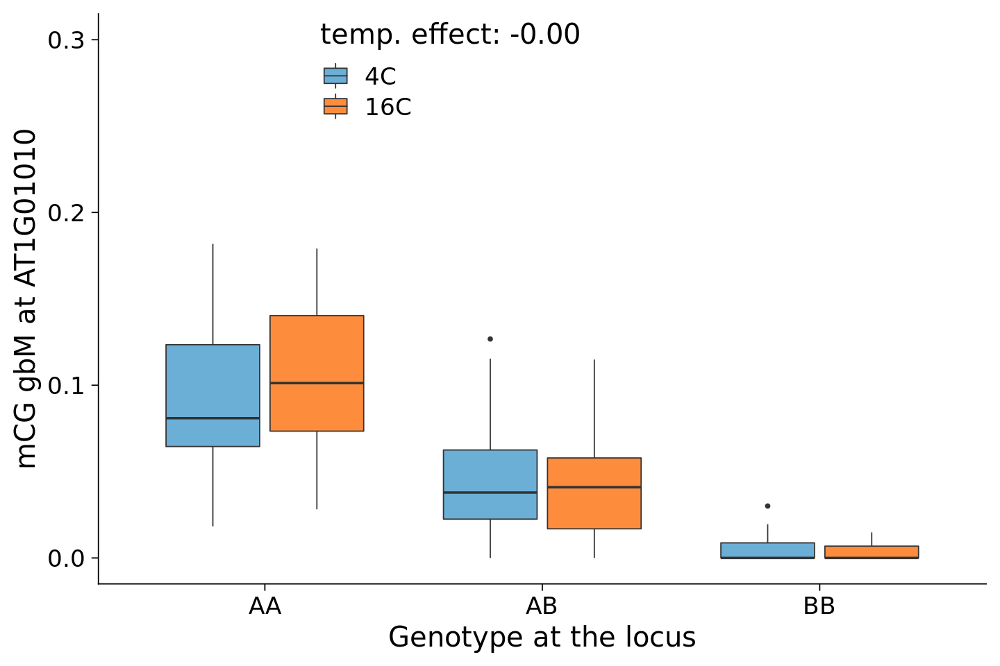

In [53]:
ef_gene_ix = which(req.gene.str == "Chr1,3631,5899") #"Chr1,112263,113947") #"Chr1,25889074,25889734"


ef_gene_cis_marker = paste0("marker", (req.gene.str.cis.marker %>% filter( gene_str == req.gene.str[ef_gene_ix] ))$marker_ix)
# cross_genotypes[['pheno']] %>% mutate( ef_pheno = pull(phenos_df, req.gene.str[ef_gene_ix]) ) %>% dplyr::filter(direction == 1) %>% ggplot( aes( x = get(ef_gene_cis_marker), y = ef_pheno, fill = temp  ) ) + geom_boxplot(  ) + theme_cowplot(12, font_size = 24) + scale_fill_manual(name = "no effect", values= c(brewer.pal(6, "Blues")[4], brewer.pal(6, "Oranges")[4]), labels = c("4C", "16C")) + theme(legend.position = c(0.23, 0.9)) + ylab( paste0( "mCG gbM at ", araport.gene[ef_gene_ix]$ID ) ) + xlab("Genotype at the locus") + annotate(geom="text", x=2, y=0.1, label=pull(req.gene.env.effects %>% filter( gene_str == req.gene.str[ef_gene_ix] ), "eff_temp_diff"))

ef_gene_effect = sprintf("%.2f", pull(req.gene.env.effects %>% filter( gene_str == req.gene.str[ef_gene_ix] ), "eff_temp_diff"))
cross_genotypes[['pheno']] %>% mutate( ef_pheno = pull(phenos_df, req.gene.str[ef_gene_ix]) ) %>% dplyr::filter(direction == 1) %>% ggplot( aes( x = get(ef_gene_cis_marker), y = ef_pheno, fill = temp  ) ) + geom_boxplot(  ) + theme_cowplot(12, font_size = 24) + scale_fill_manual(name = paste("temp. effect:", ef_gene_effect), values= c(brewer.pal(6, "Blues")[4], brewer.pal(6, "Oranges")[4]), labels = c("4C", "16C")) + theme(legend.position = c(0.25, 0.9)) + ylab( paste0( "mCG gbM at ", araport.gene[ef_gene_ix]$ID ) ) + xlab("Genotype at the locus") + ylim(c(0, 0.3))

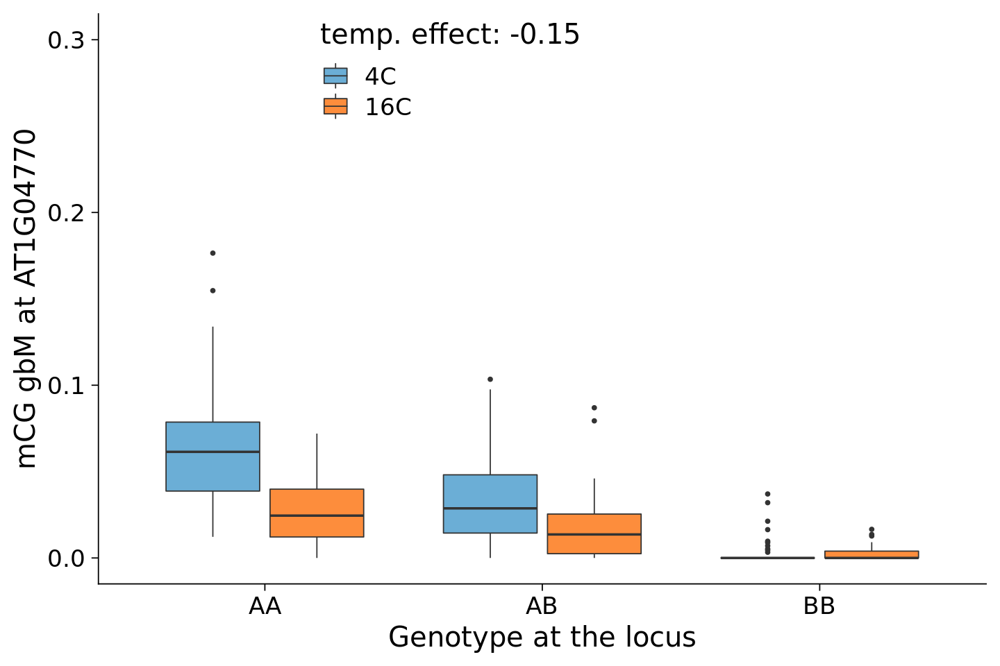

In [54]:
ef_gene_ix = which(req.gene.str == "Chr1,1336274,1337849")


ef_gene_cis_marker = paste0("marker", (req.gene.str.cis.marker %>% filter( gene_str == req.gene.str[ef_gene_ix] ))$marker_ix)

ef_gene_effect = sprintf("%.2f", pull(req.gene.env.effects %>% filter( gene_str == req.gene.str[ef_gene_ix] ), "eff_temp_diff"))
cross_genotypes[['pheno']] %>% mutate( ef_pheno = pull(phenos_df, req.gene.str[ef_gene_ix]) ) %>% dplyr::filter(direction == 1) %>% ggplot( aes( x = get(ef_gene_cis_marker), y = ef_pheno, fill = temp  ) ) + geom_boxplot(  ) + theme_cowplot(12, font_size = 24) + scale_fill_manual(name = paste("temp. effect:", ef_gene_effect), values= c(brewer.pal(6, "Blues")[4], brewer.pal(6, "Oranges")[4]), labels = c("4C", "16C")) + theme(legend.position = c(0.25, 0.9)) + ylab( paste0( "mCG gbM at ", araport.gene[ef_gene_ix]$ID ) ) + xlab("Genotype at the locus") + ylim(c(0, 0.3))

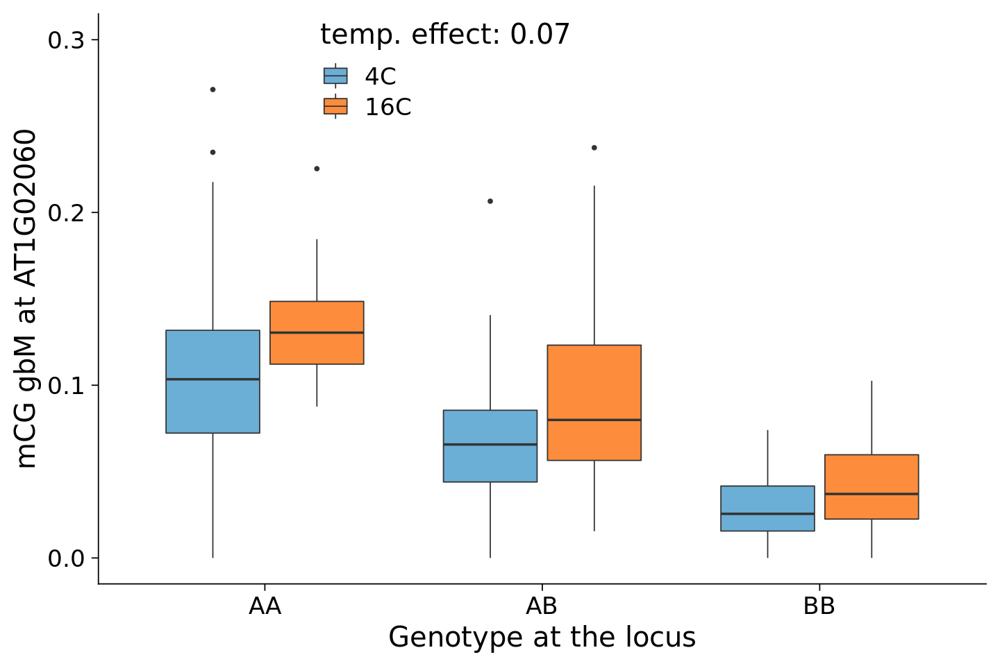

In [60]:
ef_gene_ix = which(req.gene.str == "Chr1,360918,363142" )# "Chr4,7401087,7401951")

ef_gene_cis_marker = paste0("marker", (req.gene.str.cis.marker %>% filter( gene_str == req.gene.str[ef_gene_ix] ))$marker_ix)
# cross_genotypes[['pheno']] %>% ggplot( aes( x = get(ef_gene_cis_marker), y = pull(phenos_df, req.gene.str[ef_gene_ix]), fill = temp  ) ) + geom_boxplot(  ) + theme_cowplot(12, font_size = 24) + scale_fill_manual(name = "positive effect", values= c(brewer.pal(6, "Blues")[4], brewer.pal(6, "Oranges")[4]), labels = c("4C", "16C")) + theme(legend.position = c(0.25, 0.9)) + ylab( paste0( "mCG gbM at ", araport.gene[ef_gene_ix]$ID ) ) + xlab("Genotype at the locus") + annotate(geom="text", x=3, y=0.05, label=pull(req.gene.env.effects %>% filter( gene_str == req.gene.str[ef_gene_ix] ), "eff_temp_diff"))

ef_gene_effect = sprintf("%.2f", pull(req.gene.env.effects %>% filter( gene_str == req.gene.str[ef_gene_ix] ), "eff_temp_diff"))
cross_genotypes[['pheno']] %>% mutate( ef_pheno = pull(phenos_df, req.gene.str[ef_gene_ix]) ) %>% dplyr::filter(direction == 1) %>% ggplot( aes( x = get(ef_gene_cis_marker), y = ef_pheno, fill = temp  ) ) + geom_boxplot(  ) + theme_cowplot(12, font_size = 24) + scale_fill_manual(name = paste("temp. effect:", ef_gene_effect), values= c(brewer.pal(6, "Blues")[4], brewer.pal(6, "Oranges")[4]), labels = c("4C", "16C")) + theme(legend.position = c(0.25, 0.9)) + ylab( paste0( "mCG gbM at ", araport.gene[ef_gene_ix]$ID ) ) + xlab("Genotype at the locus") + ylim(c(0, 0.3))

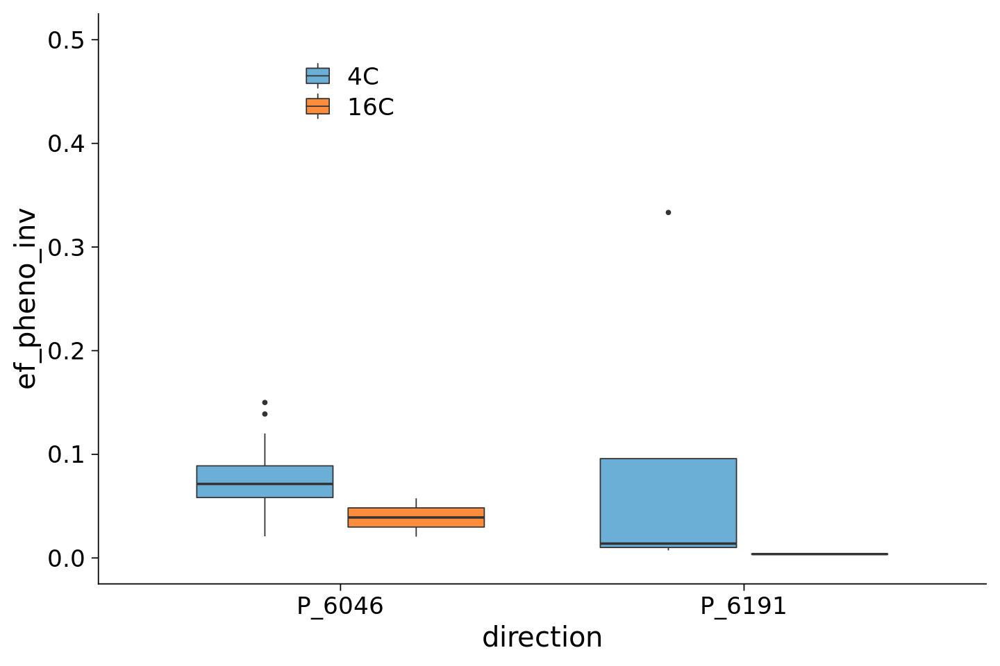

In [62]:
ef_gene = "Chr1,1336274,1337849"#"Chr4,7401087,7401951" #req.gene.str[2]

ef_pheno_df = parents_df %>% dplyr::select( c(ef_gene, "direction", "temp") ) %>% dplyr::rename(ef_pheno = names(.)[1]) %>% mutate(ef_pheno = logit(ef_pheno)) %>% filter( is.finite(ef_pheno) )

ef_pheno_df %>% mutate(ef_pheno_inv = invLogit(ef_pheno)) %>% ggplot( aes(x = direction, y = ef_pheno_inv, fill = temp )) + geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(name = "", values= c(brewer.pal(6, "Blues")[4], brewer.pal(6, "Oranges")[4]), labels = c("4C", "16C")) + theme(legend.position = c(0.23, 0.9)) + ylim(c(0, 0.5))

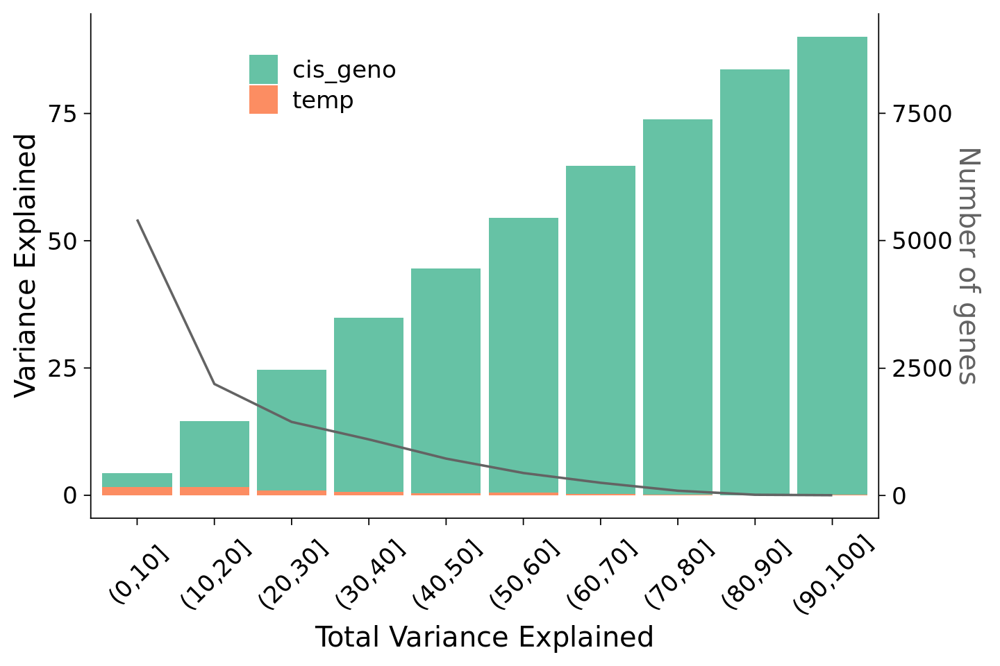

In [133]:
t_data = req.gene.env.effects %>% mutate( VarExp = 100 - ss_residuals) %>% mutate( fVarExp = cut(VarExp, breaks = seq(0, 100, 10) ) ) %>% group_by( fVarExp  ) %>% summarise_all(mean) %>% dplyr::select( c("fVarExp", "ss_temp", "ss_cis_geno") ) %>% rename_all( funs(sub("ss_", "", .)) ) %>% pivot_longer(!fVarExp, names_to = "x", values_to = "VarExp")
t_data_counts = req.gene.env.effects %>% mutate( VarExp = 100 - ss_residuals) %>% mutate( fVarExp = cut(VarExp, breaks = seq(0, 100, 10) ) ) %>% count( fVarExp )

p1 = ggplot( aes(x = fVarExp), data = t_data_counts) + geom_bar(aes(y = VarExp, fill = x ), data = t_data, position="stack", stat="identity") + scale_fill_manual(name = "", values = brewer.pal(4, "Set2") ) + geom_line( aes(x = as.numeric(fVarExp), y = n/100 ), data = t_data_counts, size = 1, col = "#636363" ) + scale_y_continuous( name = "Variance Explained", sec.axis = sec_axis( ~.*100, name = "Number of genes" ) ) + xlab( "Total Variance Explained" ) + theme_cowplot(12, font_size = 24) + theme( axis.text.x = element_text(angle = 45, vjust = 0.5), axis.title.y.right = element_text(color = "#636363")) + theme(legend.position = c(0.2, 0.9))

p1

ggsave(p1, filename = "var_exp.gene.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

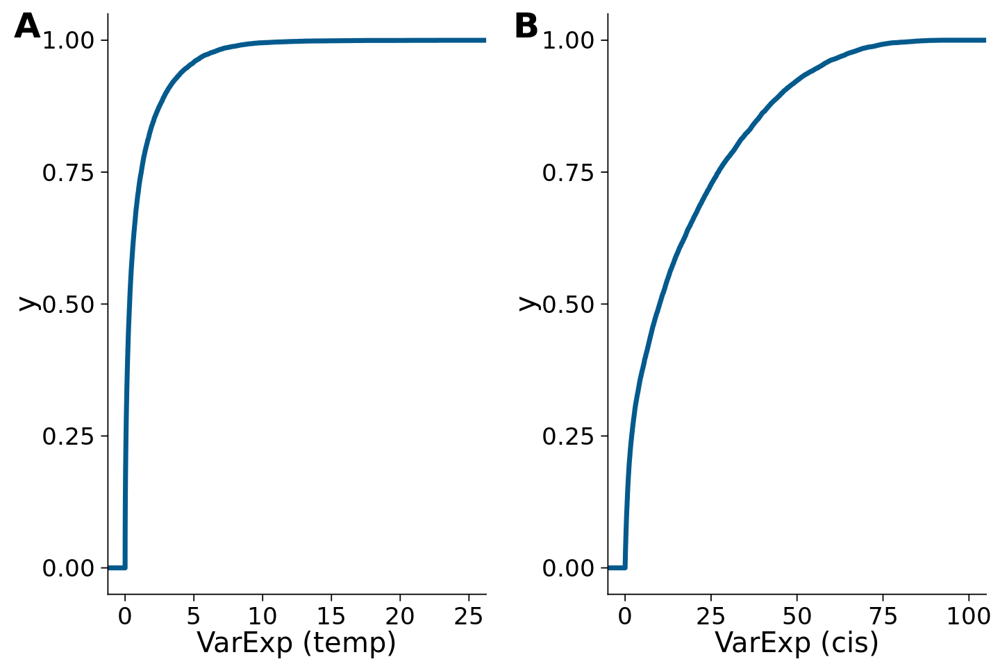

In [15]:
# png("plates_tempdirection.png", height = 800, width = 1600)

p1 = req.gene.env.effects %>% ggplot(aes( ss_temp )) + stat_ecdf(geom = "step", color = "#045a8d", size = 2) + coord_cartesian(xlim = c(0,25)) + theme_cowplot(12, font_size = 24) + xlab("VarExp (temp)") #+ geom_vline(xintercept = 1)

# p2 = req.gene.env.effects %>% ggplot(aes( ss_direction )) + stat_ecdf(geom = "step", color = "#045a8d", size = 2) + coord_cartesian(xlim = c(0,90)) + theme_cowplot(12, font_size = 24) + xlab("VarExp (direction)")

p2 = req.gene.env.effects %>% ggplot(aes( ss_cis_geno )) + stat_ecdf(geom = "step", color = "#045a8d", size = 2) + coord_cartesian(xlim = c(0,100)) + theme_cowplot(12, font_size = 24) + xlab("VarExp (cis)")



p3 = plot_grid(p1, p2, labels = c("A", "B"), nrow = 1, label_size = 30)

# ggsave(p3, filename = "var_exp.gene.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

# ggsave(p3, filename = "var_exp.gene.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

p3
# dev.off()



* Genes with temperature effect are the ones where you have H2A.Z over the gene bodies. It has been already shown that presence of H2AZ results in genes with lower transcriptional levels and higher variability in expression patterns across tissue types adn environmental conditions (Coleman-Derr et al. 2012, https://journals.plos.org/plosgenetics/article?id=10.1371/journal.pgen.1002988) 

* Genes without any cis-effect are genes where there is very little differential methylation between the parents to begin with.

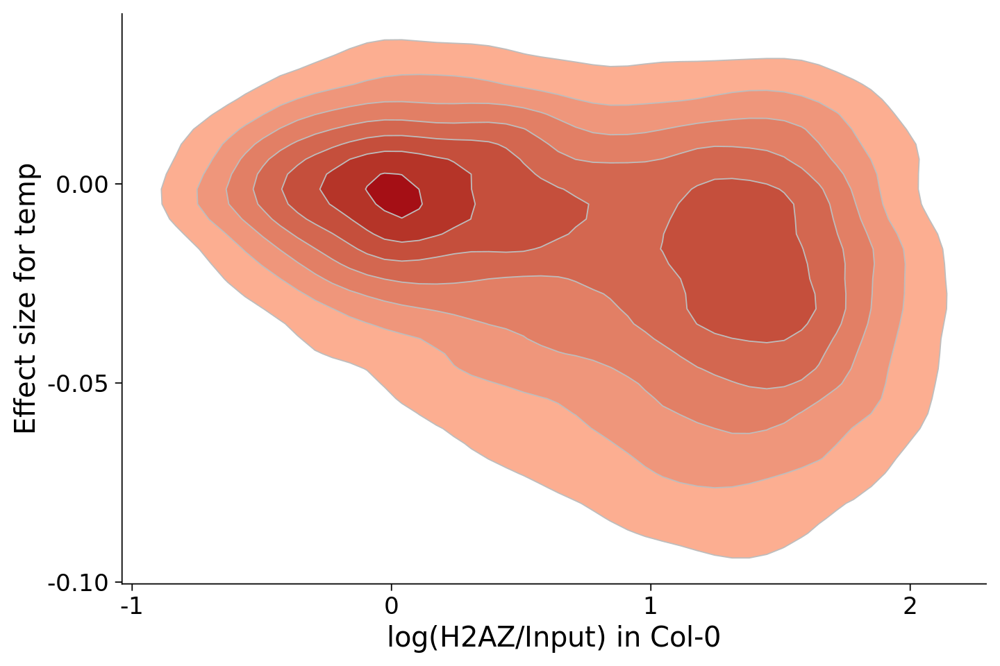

In [12]:
req.gene.env.effects %>% ggplot(aes(y = eff_temp_diff, x = h2az_chip)) + stat_density_2d(aes(fill = ..level..), geom = "polygon", colour="#bdbdbd", show.legend = FALSE) + theme_cowplot(12, font_size = 24) + xlab( "log(H2AZ/Input) in Col-0" ) + ylab( "Effect size for temp" ) + scale_fill_gradient(low = brewer.pal(5, "Reds")[2], high = brewer.pal(5, "Reds")[5], guide="none") + guides(alpha = F)

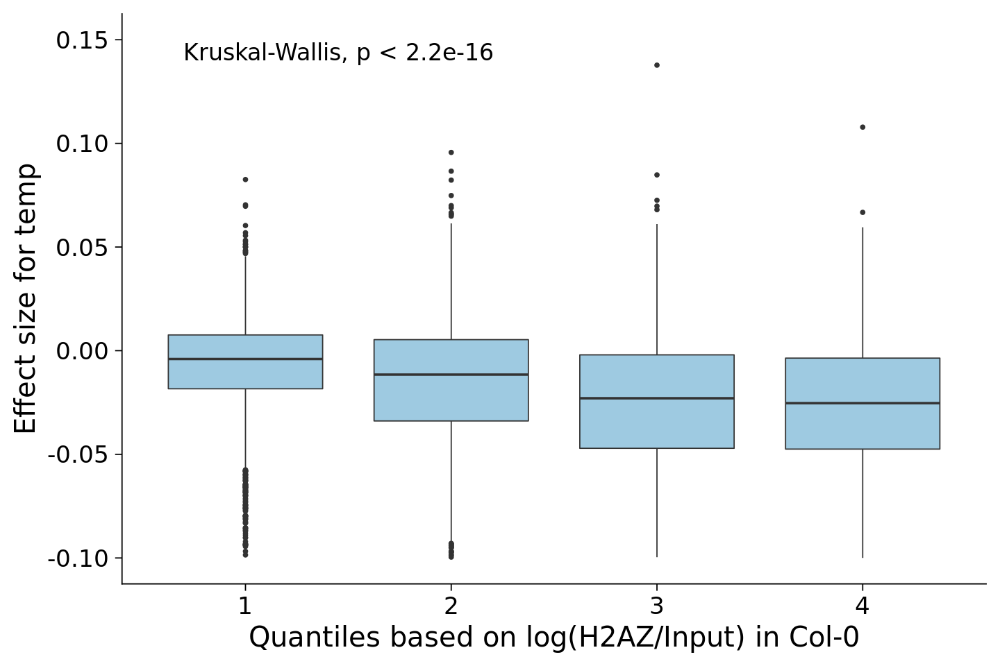

In [95]:
p1 = req.gene.env.effects %>% mutate( qq_h2az = as.factor(ntile(h2az_chip, 4) ) ) %>% ggplot(aes(y = eff_temp_diff, x = qq_h2az)) + geom_boxplot(fill = "#9ecae1") + theme_cowplot(12, font_size = 24) + ylim(c(-0.1, 0.15)) + xlab( "Quantiles based on log(H2AZ/Input) in Col-0" ) + ylab( "Effect size for temp" ) + stat_compare_means( label.y = 0.14, size = 7)


# ggsave(p1, filename = "var_exp.gene.pdf", device = cairo_pdf, width = 9, height = 7, units = "in")

p1

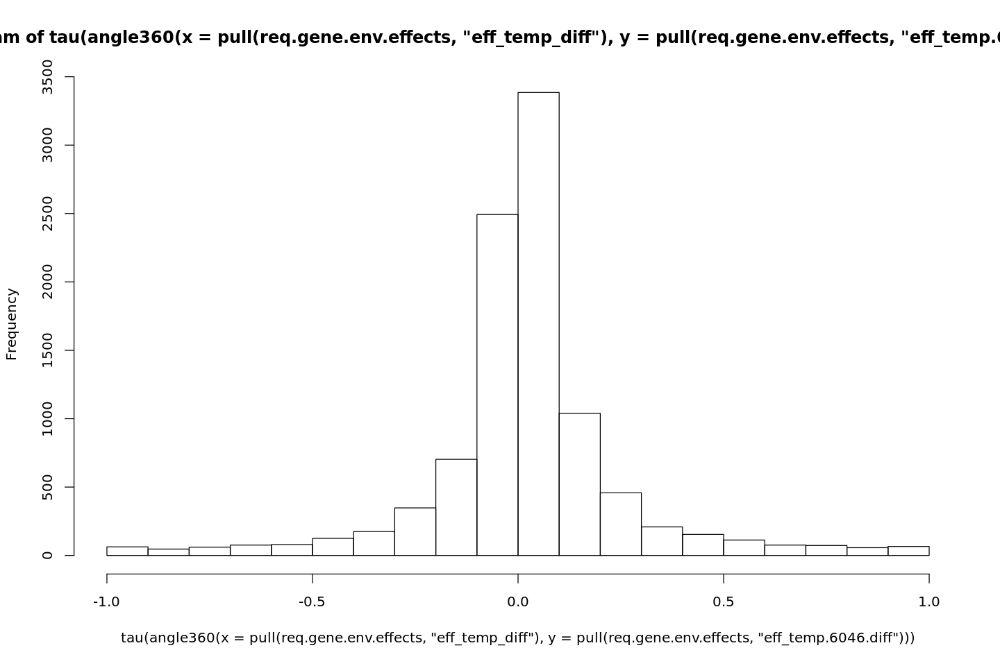

In [118]:
hist( tau(angle360(x = pull(req.gene.env.effects, "eff_temp_diff"), y = pull(req.gene.env.effects, "eff_temp.6046.diff") )) )

In [67]:
# write.csv(araport.gene$ID[match(pull(req.gene.env.effects %>% filter(pval_tempxplate >= 3  ), "gene"), paste(seqnames(araport.gene), start(araport.gene), end(araport.gene), sep = ","))], "cache_data/genes.with.env.effect.csv", row.names = F, col.names = F, )


# write.csv(req.gene.env.effects %>% mutate(araport.id = araport.gene$ID[match(pull(req.gene.env.effects, "gene"), paste(seqnames(araport.gene), start(araport.gene), end(araport.gene), sep = ","))]) %>% mutate( env_effect_bins = cut(pval_temp, breaks = c(0,1.301,2,3, 100), include.lowest = T, labels = c( "NoEffect", "0.05", "0.01", ">0.001" )) ) %>% dplyr::select(c("araport.id", "pval_temp", "env_effect_bins")), "cache_data/genes.with.env.effect.csv", row.names = F, col.names = F )

write.csv(req.gene.env.effects %>% mutate(araport.id = araport.gene$ID[match(pull(req.gene.env.effects, "gene"), paste(seqnames(araport.gene), start(araport.gene), end(araport.gene), sep = ","))]) %>% mutate(env_effect_bins = cut(pval_temp, breaks = c(0,1.301,100), include.lowest = T, labels = c( "NoTemp", "Temp") ) ) %>% mutate(cis_effect_bins = cut(pval_cis_geno, breaks = c(0,1.301,1000), include.lowest = T, labels = c( "NoCis", "Cis") ) ) %>% mutate( effs = str_c(cis_effect_bins, env_effect_bins, sep = "_" ) ) %>% dplyr::select(c("araport.id", "pval_temp", "effs")), "cache_data/genes.with.env.effect.csv", row.names = F, col.names = F )

### Dominance of the phenotype at each locus

Given parental phenotype, does methylation tend to change to hyper-methylated or hypo-methylated genome.

## Are there any trans regulators?

* Genome wide is tricky becuase of strong _cis_ 

* To determine a _trans_ QTL, we did QTL mapping on each individual gene/DMR. We do find many QTLs affecting the genes independently.

In [11]:
tic()
qtl_results["2020.d1.phenos.sim"] = list(scanone(cross_genotypes[["2020.d1"]], pheno.col = phenos_to_map, intcovar = cross_genotypes[["2020.d1"]]$pheno %>% mutate(temp = as.numeric(temp)) %>% dplyr::select("temp") ))
qtl_results["2020.d2.phenos.sim"] = list(scanone(cross_genotypes[["2020.d2"]], pheno.col = phenos_to_map, intcovar = cross_genotypes[["2020.d2"]]$pheno %>% mutate(temp = as.numeric(temp)) %>% dplyr::select("temp") ))

m_phenos_files = list.files(path = file.path(cross_genotypes[['2020.d1.fol']], "phenos"), pattern = "wma.genes.Chr.*CG.csv", full.names = T)
m_phenos_ids = character()
for (ef in m_phenos_files){
    t_ef_id = str_remove(str_remove(string = basename(ef), pattern = "wma."), ".CG.csv")
    m_phenos_ids = c(m_phenos_ids, t_ef_id)
    cross_genotypes[["2020.d1"]]$pheno = add_phenos_to_qtl(cross_genotypes[["2020.d1"]], str_remove(ef, ".CG.csv"), t_ef_id, transform_fn = logit)
    cross_genotypes[["2020.d2"]]$pheno = add_phenos_to_qtl(cross_genotypes[["2020.d2"]], str_remove(ef, ".CG.csv"), t_ef_id, transform_fn = logit)
}
# cross_genotypes[['pheno']] = left_join(cross_genotypes[['pheno']], bind_rows( cross_genotypes[['2020.d1']]$pheno, cross_genotypes[['2020.d2']]$pheno ))

qtl_results[paste0("2020.d1", ".genes.cg.perchr")] = list( scanone(cross_genotypes[["2020.d1"]], pheno.col = paste0(m_phenos_ids, ".cg"), intcovar = cross_genotypes[["2020.d1"]]$pheno %>% mutate(temp = as.numeric(temp)) %>% dplyr::select("temp") ) )
qtl_results[paste0("2020.d2", ".genes.cg.perchr")] = list( scanone(cross_genotypes[["2020.d2"]], pheno.col = paste0(m_phenos_ids, ".cg"), intcovar = cross_genotypes[["2020.d2"]]$pheno %>% mutate(temp = as.numeric(temp)) %>% dplyr::select("temp") ) )
qtl_results[["2020.d1.genes.cg.perchr"]] = qtl_results[["2020.d1.genes.cg.perchr"]][which( rownames(qtl_results[["2020.d1.genes.cg.perchr"]]) %in% markernames(cross_genotypes[["2020.d1"]]) ), ]
qtl_results[["2020.d2.genes.cg.perchr"]] = qtl_results[["2020.d2.genes.cg.perchr"]][which( rownames(qtl_results[["2020.d2.genes.cg.perchr"]]) %in% markernames(cross_genotypes[["2020.d2"]]) ), ]
toc()

# tic()

# cross_genotypes[["2020.d1.t16"]] = subset(cross_genotypes[["2020.d1"]], ind= str_which(getid(cross_genotypes[["2020.d1"]]), "T16"))
# cross_genotypes[["2020.d1.t4"]] = subset(cross_genotypes[["2020.d1"]], ind= str_which(getid(cross_genotypes[["2020.d1"]]), "T4"))

# qtl_results["2020.d1.t16.phenos.sim"] = list(scanone(cross_genotypes[["2020.d1.t16"]], pheno.col = phenos_to_map) )
# qtl_results["2020.d1.t4.phenos.sim"] = list(scanone(cross_genotypes[["2020.d1.t4"]], pheno.col = phenos_to_map) )


# qtl_results[["2020.d1.t4.phenos.sim"]]

# par(cex.axis = 1.5, cex.lab = 1.5)
# plot(qtl_results[["2020.d1.t16.phenos.sim"]], lodcolumn = which( phenos_to_map == "gene.cg" ), gap = 10, ylab="LOD score", col = brewer.pal(4, "Greens")[4], ylim = c(0, 10), lwd = 2.5, main = "gene.cg") 
# plot(qtl_results[["2020.d1.t4.phenos.sim"]], lodcolumn = which( phenos_to_map == "gene.cg" ), gap = 10, add = T, col = brewer.pal(4, "Reds")[3], lwd = 2) 

# legend("topright", c("t16.gene.cg", "t4.gene.cg"), fill = c(brewer.pal(4, "Greens")[4], brewer.pal(4, "Reds")[3]), border = NA, box.lty = 0, bg="transparent", cex = 1.2)
# toc()

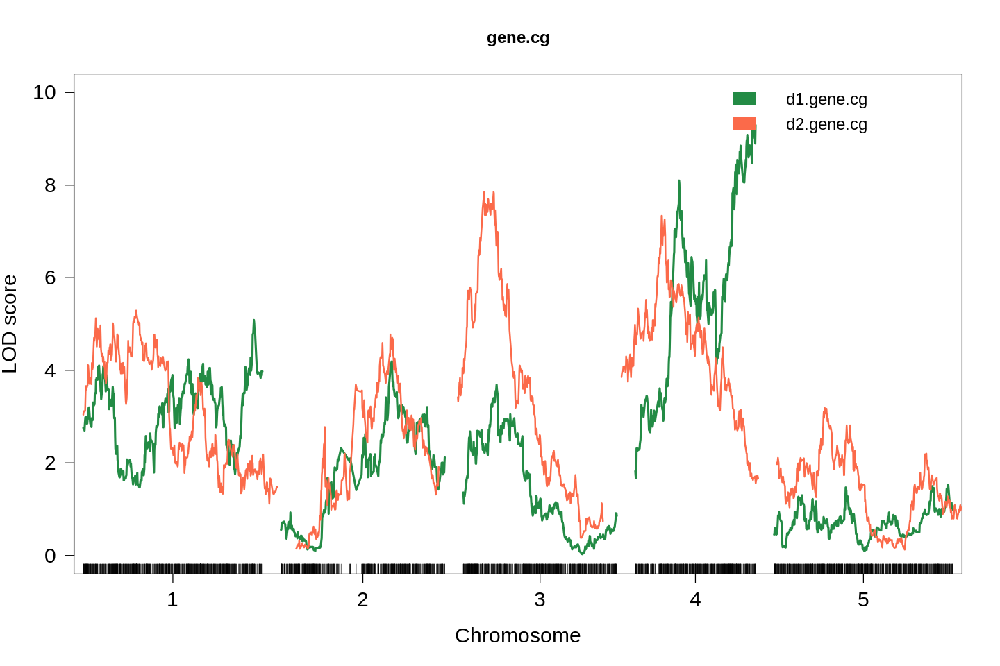

In [15]:
par(cex.axis = 1.5, cex.lab = 1.5)
plot(qtl_results[["2020.d1.phenos.sim"]], lodcolumn = which( phenos_to_map == "gene.cg" ), gap = 10, ylab="LOD score", col = brewer.pal(4, "Greens")[4], ylim = c(0, 10), lwd = 2.5, main = "gene.cg") 
plot(qtl_results[["2020.d2.phenos.sim"]], lodcolumn = which( phenos_to_map == "gene.cg" ), gap = 10, add = T, col = brewer.pal(4, "Reds")[3], lwd = 2) 

legend("topright", c("d1.gene.cg", "d2.gene.cg"), fill = c(brewer.pal(4, "Greens")[4], brewer.pal(4, "Reds")[3]), border = NA, box.lty = 0, bg="transparent", cex = 1.2)

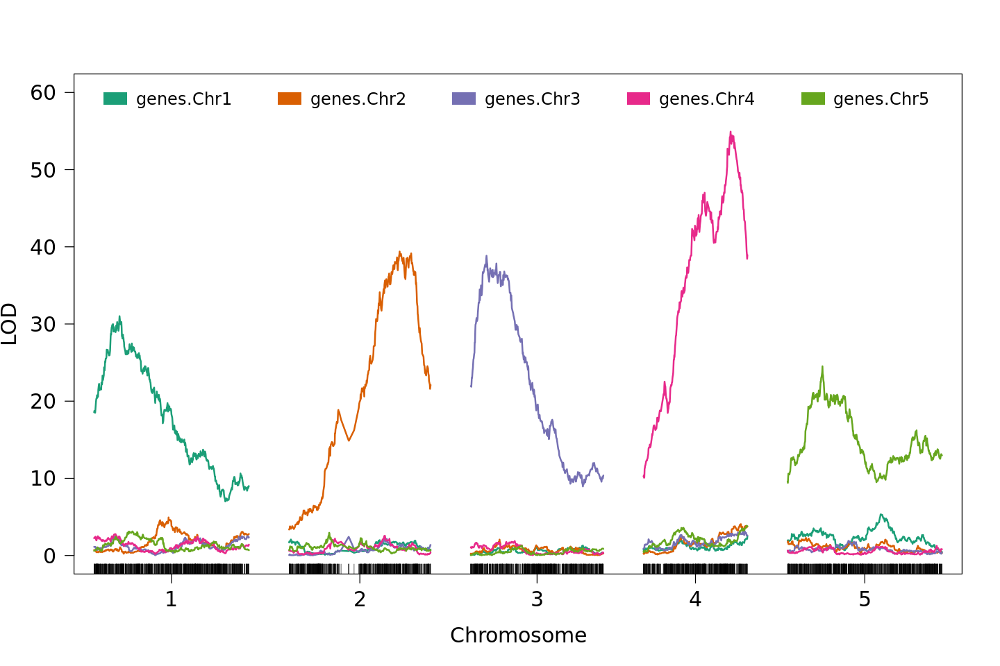

In [24]:
# png( "2020.d1.sim.genes.cg.perchr.png", height = 800, width = 1200)
# theme_set(theme_cowplot())
par(cex.axis = 1.5, cex.lab = 1.5)
plot(qtl_results[[paste0("2020.d1.genes.cg.perchr")]], lodcolumn=1, col=brewer.pal(5, "Dark2")[1], ylab = "LOD", ylim = c(0, 60) , lwd = 2)
plot(qtl_results[[paste0("2020.d1.genes.cg.perchr")]], lodcolumn=2, col=brewer.pal(5, "Dark2")[2], add = T, lwd = 2)
plot(qtl_results[[paste0("2020.d1.genes.cg.perchr")]], lodcolumn=3, col=brewer.pal(5, "Dark2")[3], add = T, lwd = 2)
plot(qtl_results[[paste0("2020.d1.genes.cg.perchr")]], lodcolumn=4, col=brewer.pal(5, "Dark2")[4], add = T, lwd = 2)
plot(qtl_results[[paste0("2020.d1.genes.cg.perchr")]], lodcolumn=5, col=brewer.pal(5, "Dark2")[5], add = T, lwd = 2)

legend("topleft", m_phenos_ids, fill = brewer.pal(5, "Dark2"), border = NA, box.lty = 0, bg="transparent", cex = 1.2, ncol = 5, x.intersp = 0.3, text.width = 70)

# dev.off()

We have also performed simple interval mapping for CG gbM on each gene.

$$ y = \epsilon $$

$$ y = G_i + \epsilon $$

$$ \hat{y} = \beta G_{cis} + \epsilon $$

$$ y - \hat{y} = G_i + \epsilon $$


<img src="cache_data/qtl.genes.cg.g.png" alt="Drawing" style="width: 600px;"/>


<img src="cache_data/qtl.genes.cg.g_cisgiven.png" alt="Drawing" style="width: 600px;"/>


<!-- Try to fit the model with parental phenotypes vs cis genotype.

- [ ] Do F1s fall in between 
- [ ] Why do you still see effect for model_2

is the the entire neighbourhood that has an effect rather than the gene itself.

is it the genotyping error? 
split the sample in three cohorts and then do the mapping.

try regressing the cis-genotype and then map the residuals

genes where is a strong 

 -->

clustering on the above plot

correlate with GWAS 

### Enrichment analysis

* You can see a strong _cis_ peak for CG gbM on each chromsome.
* To identify _trans_ regulators, we filtered the _cis_ signal. To do this, we calculated enrichment score for each SNP marker as below

    1. First, converted LOD scores to p-values (Lander and Botstein et al. 1989).
    2. Calculated enrichment score for each SNP marker using Fishers method (also used in Sasaki _et al._ 2020)

$$ X^2 = -2 \sum_{i}log(p_{i})  $$


<!-- X^2 = -2 \sum_{chri \neq chrj}log(p_{chri\_chrj}) 

So, for a SNP marker on chromosome 1, we summed up its effects for genes on chromosomes 2, 3, 4 and 5.

X^2 follows a chi-squared with _8_ degrees of freedom.
 -->
<!-- chri_j \in \{j is not present where x \notequal  on chromosome  \} -->


<!--  y_1 + y_2 + y_3 + y_4 + y_5 = \epsilon 
\sum{y_j} = G_{chrk_i} + \epsilon 
where j != k
 -->


In [47]:
tic()

qtls_aragenes = rhdf5::H5Fopen( paste0(cross_genotypes[['2020.d1.fol']], "/qtl_maps.aragenes.d1/aragenes.lods.hdf5" ), flags="H5F_ACC_RDONLY")
qtls_aragenes_filtered = t(qtls_aragenes$cis_given[,which(qtls_aragenes$genes %in% req.gene.str)])


toc()

3.507 sec elapsed


In [51]:
scanonevar( cross_genotypes[['2020.d1']], pheno.col = "gene.cg" )

In [145]:
qchisq(p = 0.8, df = 600, lower.tail = F )

[1] 570.668

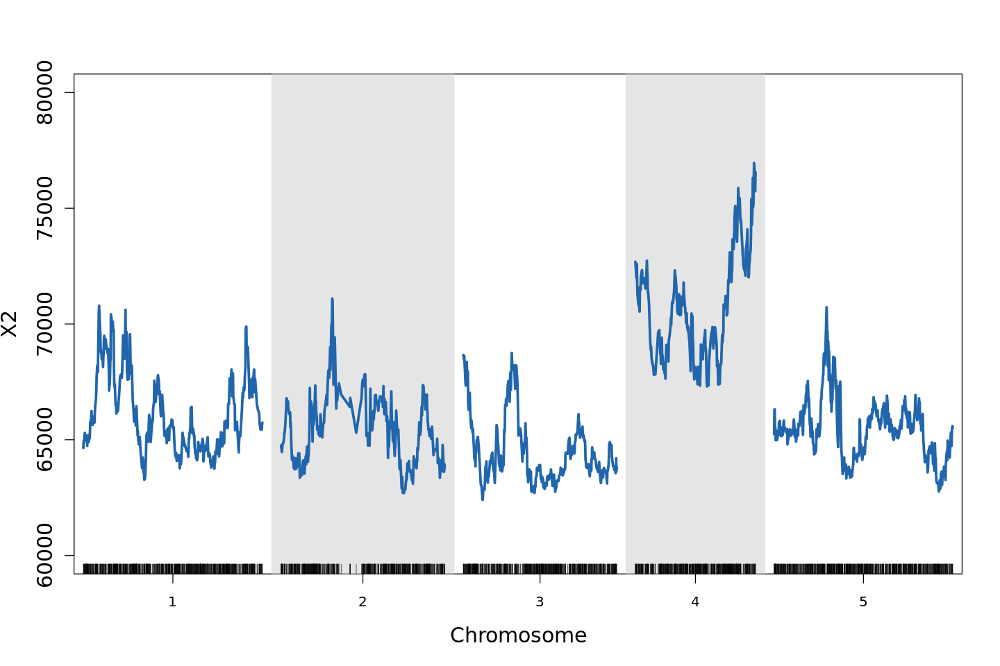

In [33]:
plot_qtl_map( qtl_results[["2020.d1.genes.cg.perchr"]] %>% mutate("all.genes" = -2 * colSums(qtls_aragenes_filtered) ) %>% dplyr::select( c("chr", "pos", "all.genes") ), ylim = c(60000, 80000), ylab = "X2", las =3 )

# abline(h = qchisq(p = 0.001, df = 2 * nrow(qtls_aragenes_filtered), lower.tail = F ), lty = 5, col = "red")

In [105]:
# plot_qtl_map( qtl_results[["2020.d1.genes.cg.perchr"]] %>% mutate("all.genes" = -2 * colSums(qtls_aragenes_filtered) ) %>% dplyr::select( c("chr", "pos", "all.genes") ), ylim = c(14000, 18000), ylab = "X2", las =3 )

# abline(h = qchisq(p = 0.001, df = 2 * nrow(qtls_aragenes_filtered), lower.tail = F ), lty = 5, col = "red")
# qtls_aragenes_filtered %>% 

In [10]:
# # 
# t_results = "2020.d1.genes.cg.perchr"
# qtl_results[[t_results]] = qtl_results[[t_results]][which(rownames( qtl_results[[t_results]] ) %in% markernames( cross_genotypes[['2020.d1']] ) ),]


# qtl_results[[t_results]] = qtl_results[[t_results]] %>% mutate(genes.chr = 0)

# for (ef_chr in chrnames( cross_genotypes[['2020.d1']] )){
#     qtl_results[[t_results]][ which(qtl_results[[t_results]]$chr == ef_chr), "genes.chr" ] = as.numeric( rowSums( qtl_results[[t_results]] %>% filter( chr == ef_chr ) %>% dplyr::select(!contains(paste0("Chr", ef_chr))) %>% dplyr::select(contains("gene")) %>% mutate_all( function(x) {log(lodToPval(x, nmar = 2800, p.adjust = T )) } ) ) )
# }
# qtl_results[["2020.d1.genes.cg.perchr"]] = qtl_results[["2020.d1.genes.cg.perchr"]] %>% mutate_at("genes.chr", function(x){ -2 * x } )


# plot_qtl_map( qtl_results[["2020.d1.genes.cg.perchr"]] %>% dplyr::select( c("chr", "pos", "genes.chr") ), ylab = "X2", ylim = c(10, 50))
# abline(h = qchisq(p = 0.0001, df = 8, lower.tail = F ), lty = 5, col = "red")

You do not any more recombination in the above plot.. why does the peak get narrower?

### Interaction of _trans_ regulators with temperature

We do not see any significant interaction with temperature

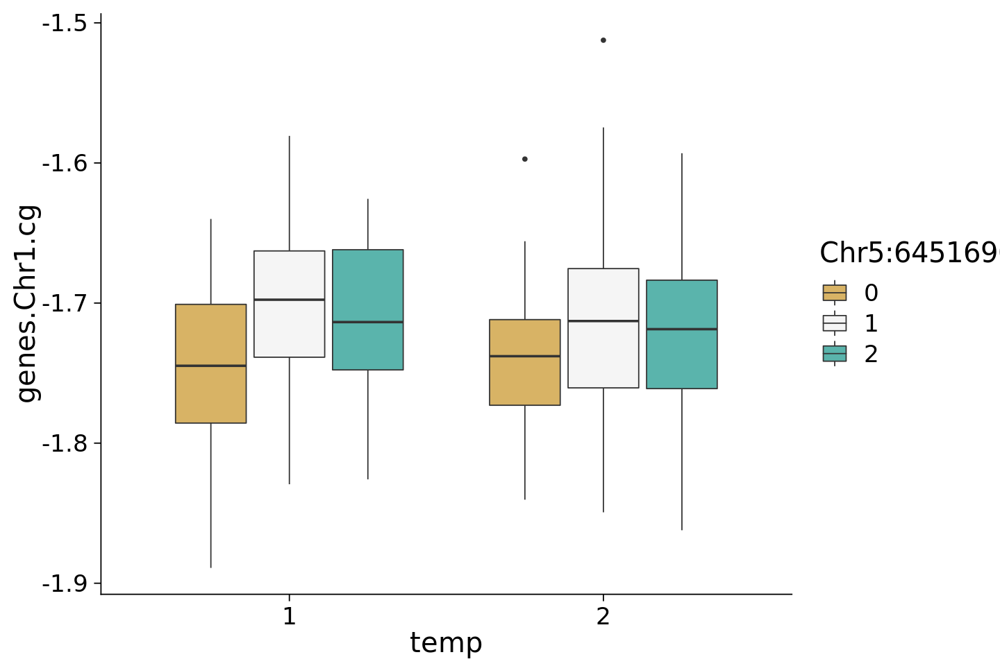

In [120]:
req.marker = "Chr5:6451690"
marker.to.check = paste0("marker", which( markernames(cross_genotypes[['2020.d1']]) == req.marker ))

p1 = cross_genotypes[["pheno"]] %>% filter(direction == 1) %>% mutate_at(c(marker.to.check, "temp"), as.factor) %>% ggplot(aes(x =  temp, y = genes.Chr1.cg, fill = get(marker.to.check))) +  geom_boxplot() + theme_cowplot(12, font_size = 24) + scale_fill_manual(name = req.marker, values= brewer.pal(3, "BrBG") )# + geom_rect( data = NULL, aes( xmin=2.5, xmax=4.5, ymin=-Inf, ymax=Inf), fill="darkgreen", alpha = 0.2)
# 

plot_grid(p1) #, p2, labels = c('A.', 'B.'), label_size = 30)

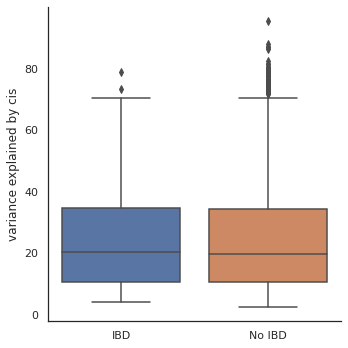

In [7]:
# cistrans_fitqtl['div_bins'] = pd.cut(cistrans_fitqtl['div'], pd.IntervalIndex.from_tuples([(0, 0.005), (0.005, 0.03), (0.03, 0.2)]), include_lowest=True )
cistrans_fitqtl['div_bins'] = pd.cut(cistrans_fitqtl['div'],[0, 0.005, 0.2], include_lowest=True, labels=["IBD", "No IBD"] )  
# cistrans_fitqtl['div_bins'] = pd.cut(cistrans_fitqtl['div'], bins=6)
cistrans_fitqtl['cis_corrected'] = cistrans_fitqtl['cis'] * cistrans_fitqtl['cis_var']


p = sns.catplot(x = 'div_bins', y= "cis_corrected", kind="box", data = cistrans_fitqtl.where(cistrans_fitqtl['cis'] == True))
# p = sns.scatterplot(x = 'div', y= "cis_corrected", data = cistrans_fitqtl.where(cistrans_fitqtl['cis'] == True), color= "#9e9ac8")
p.set_ylabels("variance explained by cis" )
p.set_xlabels("" )


# p = sns.catplot(x = "cis_corrected", y= 'div_bins', kind="box", data = cistrans_fitqtl)
# p.set_xlabels("cis associated?" )
# p.set_ylabels("pi between (P1 vs P2)" )

# plt.ylim((0, 0.25))

plt.tight_layout()
plt.savefig( "cisvsdivegence.pdf" )

plt.show()


# ARCHIVE


**Methods**

We grew ±250 F2 individuals along with selfed parent siblings at two different temperatures (16 and 4 degrees C). We performed whole-genome bisulfite sequencing on leaf tissue at 7-9 leave stage seadling. Further, we analyzed gbM on more than ~15000 genes in the F2 population.

**Results**

1. Clinal pattern for CG gbM.

    - As shown in Kawakatsu et al. and Dubin et al., there is higher CG gbM for the lines that are from North. 
    - This is true for most of the 

reaction norms for temperature in parents.


for the genes that there is gene duplicate -- what kind of pattern do they have on 1001genomes.
direction of change ?? PAI locus has higher methylation for gene duplicate.



1. _cis_ and E?

    - CG gbM **is** associated in _cis_ as expected due to epigenetic inheritance.
        - Genes that do not show any _cis_ association are those that show little to no differential methylation between parents. 
    - Contrary to previous results, there are genes (~2000) that do show significant changes with temperature. 
    - CG gbM on genes that have show an effect of temperature do have significant enrichment of H2A.Z over the gene bodies. It has been already shown that presence of H2AZ results in genes with lower transcriptional levels and higher variability in expression patterns across tissue types adn environmental conditions (Coleman-Derr et al. 2012)
    
<!--   - [ ] Comparing the genes in the regions of IBD, we can hypothesize much of the cis-association is indeed epigenetic. -->


2. trans?
    - Performed QTL mapping for gbM at each gene locus.
    - Apart from strong _cis_, there are 989 genes which show _trans_ association.
        - 242 of these genes are duplicated. and we find an association on the chromosome its gene duplicate is. 
<!-- This could either be PAI locus kinda of phenomena or    could either be PAI locus  -->
    - An enrichment analysis on the _trans_ associated genes resulted in a QTL on chromosome 4, affecting ~50 genes. 
    - [ ] GxE for trans acting loci? are these temperature sensitive?





In [49]:
#aragene_ix = 20
#araall_ix = which( araport.all$V4 == araport.genes$V4[aragene_ix])
#_____________________________________________
## Cis association for genes
# aragene_str = "Chr1,3631,5899"
# aragene_str = "Chr2,841246,843629"
# aragene_str =  "Chr1,11193625,11196397"
# aragene_str = "Chr4,9165201,9171064"
# aragene_str = "Chr4,17221885,17225088"
# aragene_str = "Chr4,7287803,7289225"
# aragene_str = "Chr1,1001116,1004410"
# aragene_str = "Chr1,23121,31227"
# aragene_str = "Chr5,26952341,26955543"
# aragene_str = "Chr1,121067,130577" 
# aragene_str = "Chr1,523536,529069"  ###Cis peak at a distance

# aragene_str = "Chr1,2426705,2429225" ### Good peaks for different models
# aragene_str = "Chr3,16468961,16470263"
# aragene_str = "Chr5,26617399,26620704"  ## expected result when putting parent in there


## Genes with a trans peaks
# aragene_str = "Chr1,4810115,4814724"
# aragene_str = "Chr5,25353018,25355535"
# aragene_str = "Chr1,5744484,5755468"
# aragene_str = "Chr4,12951109,12952952"   ### example gene with wierd peak on chromosome 5 for CIM.
# aragene_str = "Chr2,1535489,1536250"
# aragene_str = "Chr1,1287831,1289820"  ### Chromosome 5 peak 
# aragene_str = "Chr1,22285572,22290389"  ## Peak on chr4, TE mediated? I find a blast of TE upstream in there.
#aragene_str = "Chr1,259307,261667"   ## peak on chr 3


# No peaks at all
aragene_str = 'Chr1,11649,13714' #"Chr1,313101,316090"
# aragene_str = "Chr1,10029083,10031990"
# aragene_str = "Chr1,10010124,10012258"
# aragene_str = "Chr1,108946,111699"
# aragene_str = "Chr1,11649,13714" 
# aragene_str = "Chr1,192634,193670" ### No cis peaks

# aragene_str = "Chr5,25033471,25034404"
# aragene_str = "Chr5,15229810,15230243"
# aragene_str = "Chr5,15837178,15840678"

###Peaks all along the chromosome
# aragene_str = "Chr3,4275463,4276531" ## example detailed in notes
#aragene_str = "Chr3,10810579,10811197"  
#aragene_str = "Chr5,13225067,13225315"


### Genes overlapped with gene duplicate from benji
# aragene_str = 'Chr4,13505291,13507870'   ### Perfect example
# aragene_str = "Chr1,19667127,19668237"  ###Trans peak on chromosome 5
# aragene_str = "Chr2,4334959,4335909"
# aragene_str = "Chr1,24218470,24222794"   ## Only peak at cis and a small peak on chromosome 3 overlap with GWAS
#aragene_str = "Chr1,22699715,22701412"

qtl_phenos_to_map = list()
qtl_phenos_to_map[['cis_marker']] = get_closest_marker(cross_genotypes[['2020.d1.t16']], aragene_str)
qtl_phenos_to_map[['cis_marker_ix']] = paste0("marker", which(markernames(cross_genotypes[['2020.d1.t16']]) == qtl_phenos_to_map[['cis_marker']]$id ))
qtl_phenos_to_map[['cis_geno']] = genotype_at_gene_str(cross_genotypes[['2020.d1.t16']], aragene_str  )
qtl_phenos_to_map[['cis_geno']] = cbind(qtl_phenos_to_map[['cis_geno']] == 0, qtl_phenos_to_map[['cis_geno']] == 1, as.numeric(qtl_phenos_to_map[['cis_geno']]==2))

qtl_phenos_to_map[['pheno']] = logit( create_rqtl_phenos(cross_genotypes[['2020.d1.t16']], phenos_df[,c("id", aragene_str)], aragene_str) )
qtl_phenos_to_map[['pheno']][ sapply( qtl_phenos_to_map[['pheno']], simplify = 'matrix', is.infinite ) ] = NA


# thres_perm = as.numeric(summary(scanone(geno_unified, method="hk", n.perm=1000, pheno.col = gene_pheno), alpha=0.05))
# print(thres_perm)

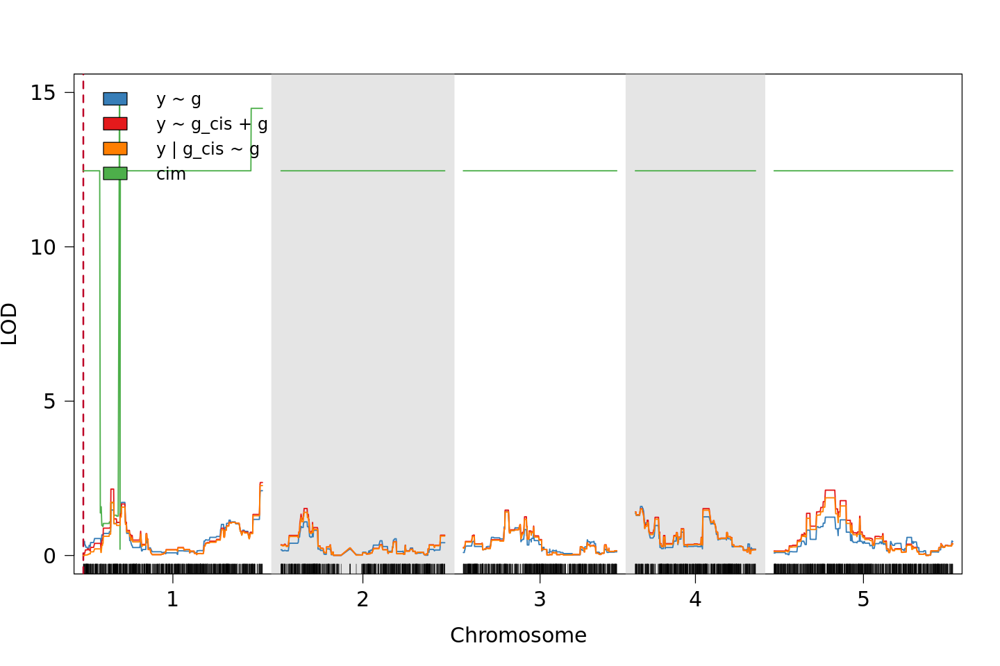

In [51]:
cis_model = lm(qtl_phenos_to_map[['pheno']] ~ qtl_phenos_to_map[['cis_geno']], na.action=na.exclude  )
cis_model_resid = rep(NA, length(qtl_phenos_to_map[['pheno']]))
cis_model_resid[as.numeric(names(cis_model$residuals))] = as.numeric(cis_model$residuals)


par(cex.axis = 1.5, cex.lab = 1.5)

plot_qtl_map(scanone(cross_genotypes[["2020.d1.t16"]], pheno.col = qtl_phenos_to_map[['pheno']], method = "hk",  ), lwd = 1.5, gene_str_marker = qtl_phenos_to_map[['cis_marker']], ylim = c(0, 15), col = brewer.pal(5, "Set1")[2] )
             
#addcovar = cross_genotypes[["2020.d1.t16"]]$pheno %>% dplyr::select(c("plate", "temp_plate")) %>% mutate_at(c("temp_plate"), as.numeric), intcovar = cross_genotypes[["2020.d1.t16"]]$pheno %>% dplyr::select(c("temp")), method = "hk"

plot_qtl_map(cim(cross_genotypes[["2020.d1.t16"]], pheno.col = qtl_phenos_to_map[['pheno']] ), lwd = 1.5, col = brewer.pal(5, "Set1")[3], add = T)
# plot_qtl_map(scanone(cross_genotypes[["2020.d1"]], pheno.col = qtl_phenos_to_map[['pheno']], addcovar = cross_genotypes[["2020.d1"]]$pheno %>% dplyr::select(c("plate", "temp_plate")) %>% mutate_at(c("temp_plate"), as.numeric) %>% mutate( "cis" = qtl_phenos_to_map[['cis_geno']] ), intcovar = cross_genotypes[["2020.d1"]]$pheno %>% dplyr::select(c("temp")), method = "ehk" ), lwd = 1.5, gene_str_marker = qtl_phenos_to_map[['cis_marker']], col = brewer.pal(5, "Set1")[1])

plot_qtl_map(scanone(cross_genotypes[["2020.d1.t16"]], pheno.col = qtl_phenos_to_map[['pheno']], addcovar = qtl_phenos_to_map[['cis_geno']], method = "hk" ), lwd = 1.5, col = brewer.pal(5, "Set1")[1], add = T)
# addcovar = cross_genotypes[["2020.d1.t16"]]$pheno %>% dplyr::select(c("plate", "temp_plate")) %>% mutate_at(c("temp_plate"), as.numeric) %>% mutate( "cis" = qtl_phenos_to_map[['cis_geno']] ), intcovar = cross_genotypes[["2020.d1.t16"]]$pheno %>% dplyr::select(c("temp")), 

plot_qtl_map(scanone(cross_genotypes[["2020.d1.t16"]], pheno.col = cis_model_resid, method = "hk" ), lwd = 1.5, col = brewer.pal(5, "Set1")[5], add = T)


legend("topleft", c("y ~ g",  "y ~ g_cis + g", "y | g_cis ~ g", "cim"), fill = brewer.pal(5, "Set1")[c(2,1,5,3)], bty = "n", cex = 1.2 )


# dev.off()